In [123]:
#Import

import numpy as np
import matplotlib.pyplot as plt
from pprint import pprint
from biasmodels import MagnificationBias, GalaxyBias, EvolutionBias
from multipole_signal import Signal, Derivatives
from getdist import plots
from getdist.gaussian_mixtures import GaussianND
import fishermat as fm
import pickle as pk

#Set current directory
import os
import sys

PACKAGE_PARENT = '..'
SCRIPT_DIR = os.path.dirname(os.path.realpath(os.path.join(os.getcwd())))
sys.path.append(SCRIPT_DIR)
print(SCRIPT_DIR)

#Configuration
large = 22; med = 16; small = 12
params = {'axes.titlesize': large,
          'legend.fontsize': med,
          'axes.labelsize': med,
          'axes.titlesize': med,
          'xtick.labelsize': med,
          'ytick.labelsize': med,
          'figure.titlesize': large,
          'xtick.direction': 'out',  
          'ytick.direction': 'out',  
          'xtick.minor.visible': True,  
          'ytick.minor.visible': True,
          'xtick.major.size': 9,
          'xtick.minor.size': 4.5,
          'ytick.major.size': 9,
          'ytick.minor.size': 4.5,
          'lines.linewidth': 1.75}
plt.rcParams.update(params)

plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = 'serif'

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

/Users/danielsb/Documents/GitHub


In [124]:
# Redshift bins

z_bins = np.array([0.15, 0.25, 0.35, 0.45, 0.55, 0.65, 0.75, 0.85, 0.95, 1.05, 1.15, 1.25, 1.35, 1.45, 1.55, 1.65, 1.75, 1.85, 1.95])

# Separations

dist = [
    np.arange(20, 164, 4),
    np.arange(32, 164, 4),
]

params_dict0 = {
    'h' : 0.6766,
    'As' : 2.05e-9,
    'ns' : 0.9665,
    'Ob' : 0.04897, # This is here the density parameter of Baryons
    'Om' : 0.3111, # This is here the density parameter of Cold Dark Matter
}

steps = [1e-3, 1e-1, 1e-4, 1e-2, 1e-2]

#myDerivatives = Derivatives(params_dict0 = params_dict0,  wide_angle = False, dist_correction = False)

# Derivatives

In [125]:
with open('derivatives.pkl', 'rb') as File:
    derivatives_dict = pk.load(File)
    
derivatives_50x50 = derivatives_dict['split_50x50']
derivatives_30x70 = derivatives_dict['split_30x70']

In [126]:
dsignal_dsbias_fit = derivatives_50x50['dsignal_dsbias']

dsignal_dgbias =  derivatives_50x50['dsignal_dgbias']

dsignal_dcosmic =  derivatives_50x50['dsignal_dcosmic']

dsignal_dnum_fit =  derivatives_50x50['dsignal_dnumev']

np.shape(dsignal_dsbias_fit), np.shape(dsignal_dgbias), np.shape(dsignal_dcosmic)

((8, 19, 324), (4, 19, 324), (5, 19, 324))

In [127]:
dsignal_dtheta_fit_all = np.concatenate([dsignal_dsbias_fit, dsignal_dnum_fit, dsignal_dgbias, dsignal_dcosmic])

np.shape(dsignal_dtheta_fit_all)

(21, 19, 324)

## Remove the EVEN MULTIPOLES. FIX GBIAS AND COSMIC PARAMS

In [128]:
n_sep = len(dist[0])

print('Number of separations per multipole = ', n_sep)

Number of separations per multipole =  36


In [129]:
index_even = list(range(0,3*n_sep)) + list(range(4*n_sep, 8*n_sep))

print(index_even)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257,

In [130]:
len(index_even)

252

In [131]:
#dsignal_dtheta_fit_neven_ = np.concatenate([dsignal_dsbias_fit, dsignal_dnum_fit, dsignal_dgbias, dsignal_dcosmic])
dsignal_dtheta_fit_neven_ = np.concatenate([dsignal_dsbias_fit, dsignal_dnum_fit])
dsignal_dtheta_fit_neven = np.delete(dsignal_dtheta_fit_neven_, index_even, axis=2)

np.shape(dsignal_dtheta_fit_neven)

(12, 19, 72)

# Analysis with $m = 2.0$

## NO EVEN MULTIPOLES

In [132]:
# Create the Cov Matrix for sB, sF, nevol

errB = [5e-1, 5e-1] 
errF = [5e-1, 5e-1]

sB_4fit = np.array([-0.90110744,  1.82300203, -1.01878439, -0.30342324])
sF_4fit = np.array([-0.19376095,  1.0747336,  -0.07806247, -0.00558005])
nevol_fid = np.array([7.94599875, -12.03752387,   2.29927261, -15.83887369])

num_fit = nevol_fid

dsB_19bins = sB_4fit * errB[0] 
dsF_19bins = sF_4fit * errF[0]

dnum_19bins = num_fit * errB[1]

Cov_all_19bins = np.diag(np.concatenate([dsB_19bins**2, dsF_19bins**2, dnum_19bins**2]))

Inv_Cov_all_19bins = np.linalg.inv(Cov_all_19bins)

Inv_Cov_prior_all = np.zeros([len(dsignal_dtheta_fit_neven), len(dsignal_dtheta_fit_neven)])

Inv_Cov_prior_all[:len(Inv_Cov_all_19bins), :len(Inv_Cov_all_19bins)] = Inv_Cov_all_19bins

np.shape(Cov_all_19bins)

(12, 12)

In [133]:
Cov_multipoles_19bins_ = fm.cov_matrix_survey(d = dist[0], z_bins = z_bins, split=[50,50])

np.shape(Cov_multipoles_19bins_), type(Cov_multipoles_19bins_)


 ... Loading Covariance Matrices [MONOBB, MONOBF, MONOFF, DIPBF, QUADBB, QUADBF, QUADFF, HEXAT, OCTBF] ... 

Population splitted in 50% BRIGHT - 50% FAINT 




 ... Success! ... 



((19, 324, 324), list)

In [134]:
Cov_odd_multipoles_19bins = np.delete(Cov_multipoles_19bins_, index_even, axis=1)
Cov_odd_multipoles_19bins = np.delete(Cov_odd_multipoles_19bins, index_even, axis=2)

np.shape(Cov_odd_multipoles_19bins)

(19, 72, 72)

In [135]:
Inv_Cov_multipoles_neven_19bins = [np.linalg.inv(Cov_odd_multipoles_19bins[k]) for k,_ in enumerate(z_bins)]

Fisher_Matrix_multipoles_neven_19bins = fm.fisher_matrix(d_signal = dsignal_dtheta_fit_neven, inv_cov = Inv_Cov_multipoles_neven_19bins, z_bins = z_bins)
Fisher_Matrix_neven_19bins = Fisher_Matrix_multipoles_neven_19bins + Inv_Cov_prior_all

Sigma_Matrix_neven_19bins = np.linalg.inv(Fisher_Matrix_neven_19bins)

np.shape(Sigma_Matrix_neven_19bins)


 ... Computing the Fisher Matrix ... 

Signal & Cov must be given as functions (z,d) and (z,d,d') respectively. 


 ... Success! ... 



(12, 12)

#### Constraints

In [136]:
#Absolute Errors

Abs_Errors_neven_19bins = np.sqrt(np.diag(Sigma_Matrix_neven_19bins))

# Fiducial values

sbias_fid = np.concatenate([sB_4fit, sF_4fit])
num_fid = num_fit
#gbias_fid = np.concatenate([np.array([0.554, 0.783]), np.array([0.554, 0.783])])
#cosmic_fid = np.fromiter(params_dict0.values(), dtype=float)
#cosmic_fid[1] = np.log(10**10 * cosmic_fid[1])

#params_fid = np.concatenate([sbias_fid, num_fid, gbias_fid, cosmic_fid])
params_fid = np.concatenate([sbias_fid, num_fid])

# Relative errors

Rel_Errors_neven_19bins = np.abs(Abs_Errors_neven_19bins/params_fid)

params_errors_neven_19bins = Rel_Errors_neven_19bins * 100

print()
print('------------ Relative errors * 100 ------------' )
print()
print('sbias = ', params_errors_neven_19bins[0:len(sbias_fid)])
print()
print('number = ', params_errors_neven_19bins[len(sbias_fid):(len(sbias_fid) + len(num_fid))])
print()
#print('gbias = ', params_errors_neven_19bins[(len(sbias_fid) + len(num_fid)):(len(sbias_fid) + len(num_fid) + len(gbias_fid))])
#print()
#print('cosmic = ', params_errors_neven_19bins[(len(sbias_fid) + len(num_fid)+len(gbias_fid)):])


------------ Relative errors * 100 ------------

sbias =  [30.01757285 18.47189149 25.02639974 23.8056846  39.28684934 27.8277582
 45.07008662 49.94474617]

number =  [41.31180572 31.04102095 25.55359634 30.70763683]



#### Predictions

##### Magnification bias

In [57]:
# Magnification bias fit

def magbias_fit(params, x):
    a, b, c, d = params
    return  a + b * x + c * np.log(x) + d * (np.log(x))**2

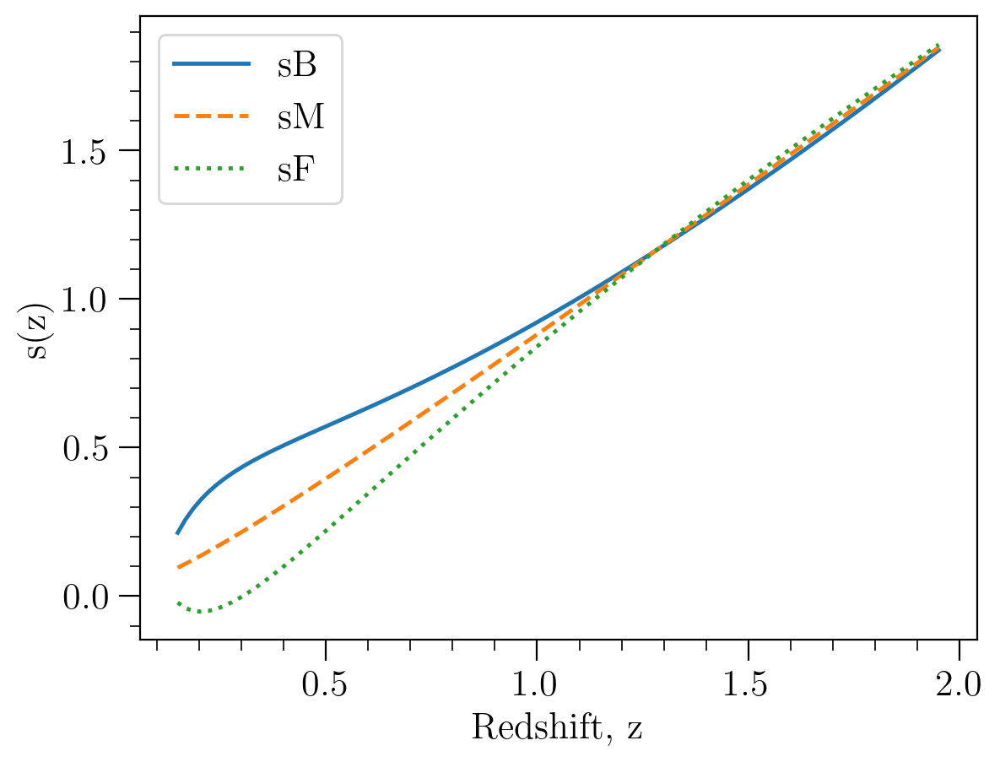

In [58]:
z_lin = np.linspace(z_bins[0], z_bins[-1], 100)
m_split = 2.

sB_fid = magbias_fit(sB_4fit, z_lin)
sM_fid = magbias_fit(sF_4fit, z_lin)
sF_fid = sM_fid * (m_split/(m_split-1)) - sB_fid/(m_split-1)

plt.plot(z_lin, sB_fid, '-', label=r'sB')
plt.plot(z_lin, sM_fid, '--', label=r'sM')
plt.plot(z_lin, sF_fid, ':', label=r'sF')

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.legend();


###### Compare the two observables

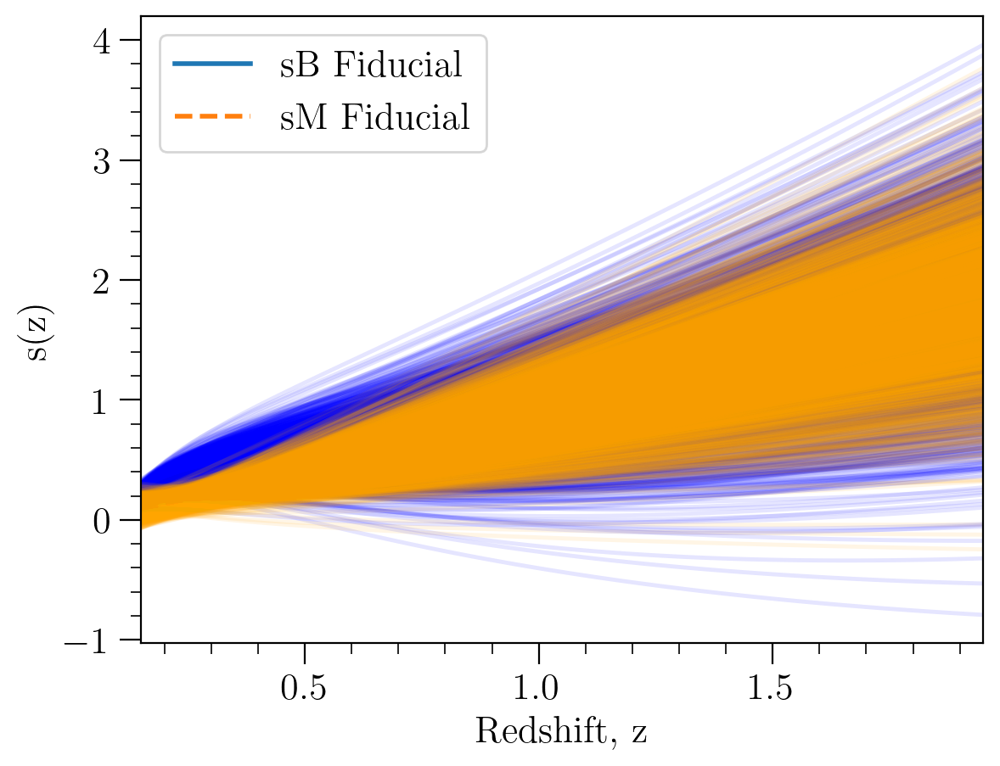

In [59]:
# Select the marginalized covariance matrix for the magnification biases

cov_sB = Sigma_Matrix_neven_19bins[:4, :4]
cov_sM = Sigma_Matrix_neven_19bins[4:8, 4:8]

# Generate parameter samples from multivariate normal distribution
num_samples = 2000
sB_pars_samples = np.random.multivariate_normal(sB_4fit, cov_sB, num_samples)
sM_pars_samples = np.random.multivariate_normal(sF_4fit, cov_sM, num_samples)

# Evaluate fitting function for each parameter sample
sB_samples = np.array([magbias_fit(pars, z_lin) for pars in sB_pars_samples])
sM_samples = np.array([magbias_fit(pars, z_lin) for pars in sM_pars_samples])

# Calculate the 68% confidence interval
sB_lower_bound = np.percentile(sB_samples, 16, axis=0)
sB_upper_bound = np.percentile(sB_samples, 84, axis=0)
sM_lower_bound = np.percentile(sM_samples, 16, axis=0)
sM_upper_bound = np.percentile(sM_samples, 84, axis=0)

# Step 5: Plotting

plt.plot(z_lin, sB_fid, '-', label=r'sB Fiducial', lw = 2.0)
plt.plot(z_lin, sM_fid, '--', label=r'sM Fiducial', lw = 2.0)

# Plot the fitting function for each sample
for sample in sB_samples:
    plt.plot(z_lin, sample, color='blue', alpha=0.1)

for sample in sM_samples:
    plt.plot(z_lin, sample, color='orange', alpha=0.1)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.legend();


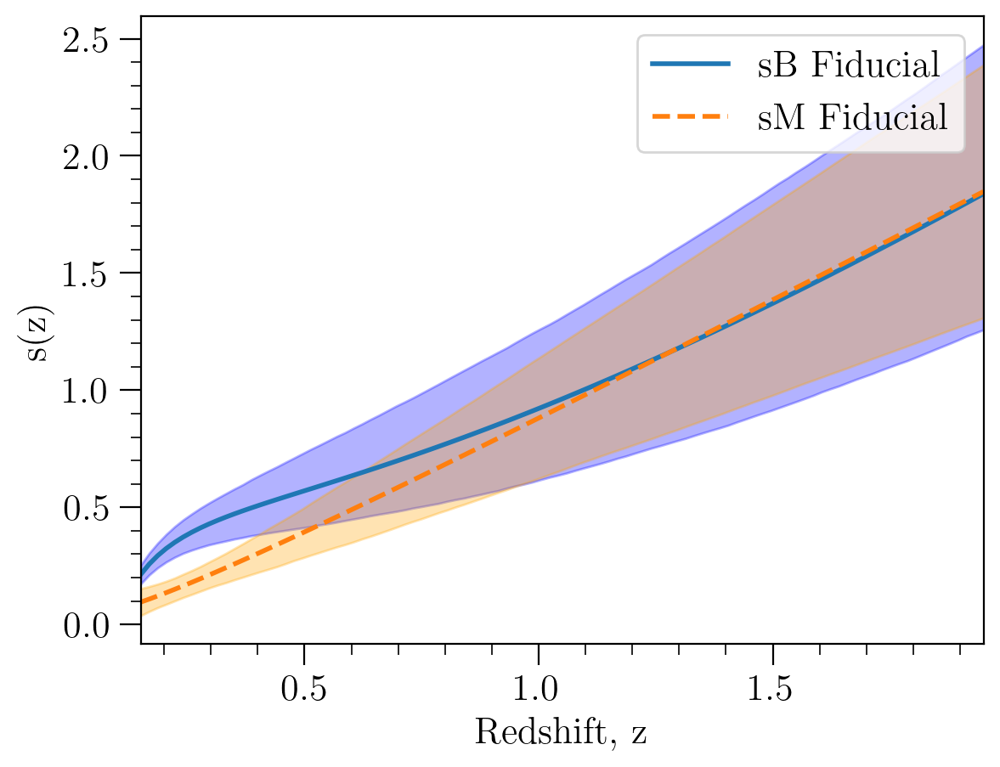

In [60]:
plt.plot(z_lin, sB_fid, '-', label=r'sB Fiducial', lw = 2.0)
plt.plot(z_lin, sM_fid, '--', label=r'sM Fiducial', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound, sB_upper_bound, color='blue', alpha=0.3)
plt.fill_between(z_lin, sM_lower_bound, sM_upper_bound, color='orange', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.legend();

###### Compare with priors

In [61]:
# Select the marginalized covariance matrix for the magnification biases priors

cov_sB_priors = Cov_all_19bins[:4, :4]
cov_sM_priors = Cov_all_19bins[4:8, 4:8]

# Generate parameter samples from multivariate normal distribution
num_samples = 1000
sB_pars_samples_priors = np.random.multivariate_normal(sB_4fit, cov_sB_priors, num_samples)
sM_pars_samples_priors = np.random.multivariate_normal(sF_4fit, cov_sM_priors, num_samples)

# Evaluate fitting function for each parameter sample
sB_samples_priors = np.array([magbias_fit(pars, z_lin) for pars in sB_pars_samples_priors])
sM_samples_priors = np.array([magbias_fit(pars, z_lin) for pars in sM_pars_samples_priors])

# Calculate the 68% confidence interval
sB_lower_bound_priors = np.percentile(sB_samples_priors, 16, axis=0)
sB_upper_bound_priors = np.percentile(sB_samples_priors, 84, axis=0)
sM_lower_bound_priors = np.percentile(sM_samples_priors, 16, axis=0)
sM_upper_bound_priors = np.percentile(sM_samples_priors, 84, axis=0)

Text(0.5, 1.0, 'Prediction vs Prior')

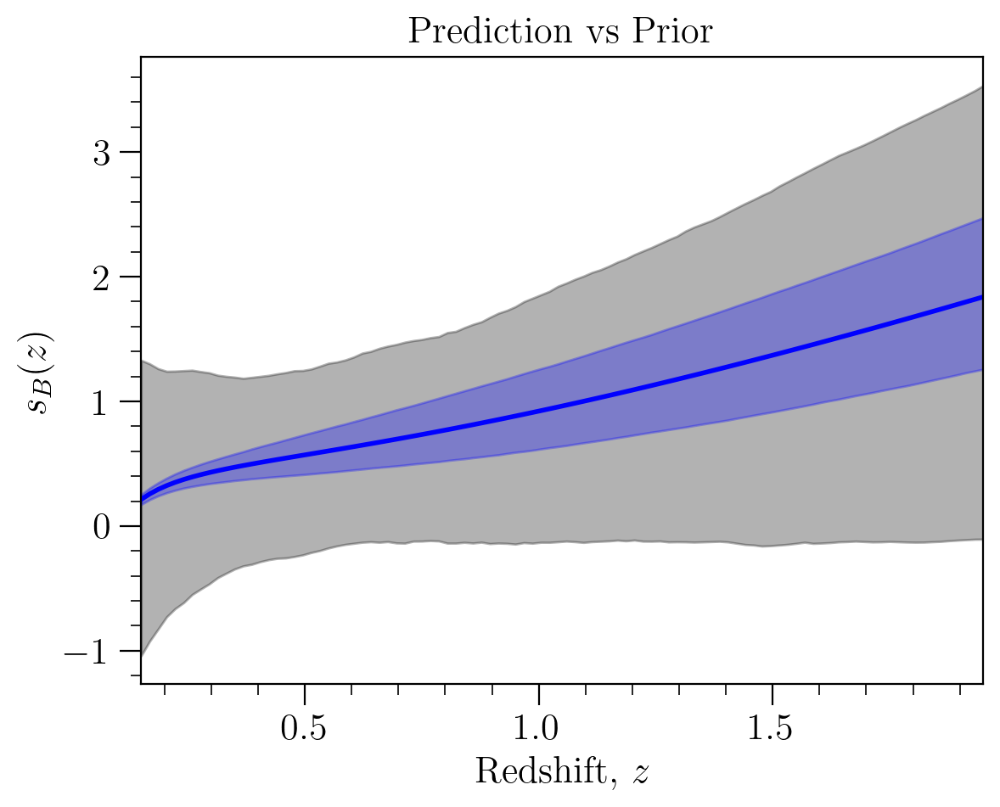

In [62]:
plt.plot(z_lin, sB_fid, '-', lw = 2.0, color='blue')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_priors, sB_upper_bound_priors, color='black', alpha=0.3)
plt.fill_between(z_lin, sB_lower_bound, sB_upper_bound, color='blue', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_B(z)$');
plt.title(r'Prediction vs Prior')

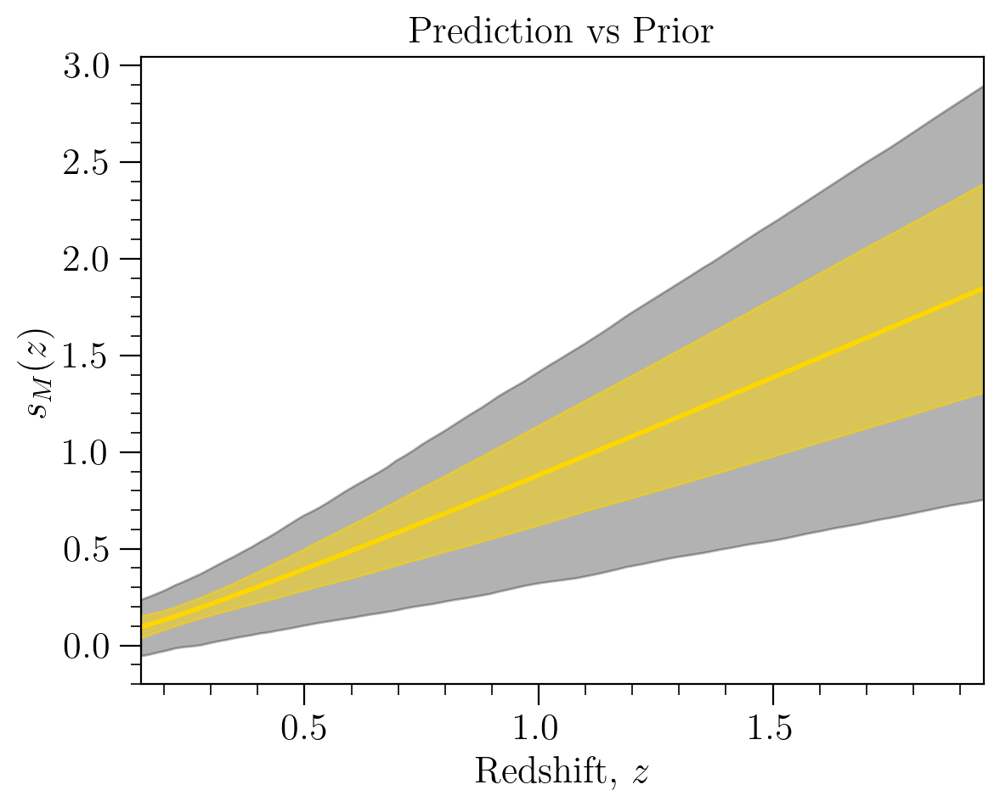

In [63]:
plt.plot(z_lin, sM_fid, '-', lw = 2.0, color='gold')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sM_lower_bound_priors, sM_upper_bound_priors, color='black', alpha=0.3)
plt.fill_between(z_lin, sM_lower_bound, sM_upper_bound, color='gold', alpha=0.5)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_M(z)$');
plt.title(r'Prediction vs Prior');

###### Magnification bias of the Faint

The magnification bias of the faint population is obtained by:

$$ s_F(z) = s_{model}(z)\frac{\bar{N}(z)}{\bar{N}_F(z)} - s_B(z)\frac{\bar{N}_B(z)}{\bar{N}_F(z)} = s_F(z) = s_{model}(z)\frac{m}{m-1} - s_B(z)\frac{1}{m-1} $$ 

We need to sample together the $s_B$ and $s_m$ parameters.

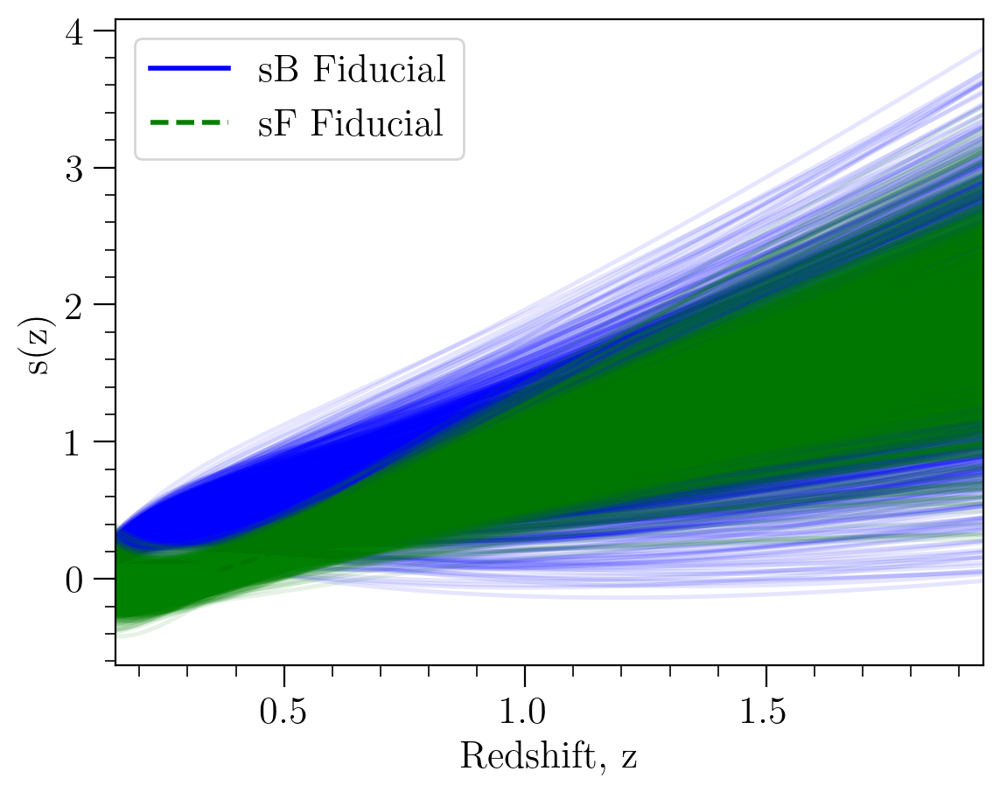

In [64]:
# Select the marginalized covariance matrix for the magnification biases together
cov_sbias = Sigma_Matrix_neven_19bins[:8, :8]

# Generate parameter samples from multivariate normal distribution
num_samples = 2000
sbias_pars_samples = np.random.multivariate_normal(sbias_fid, cov_sbias, num_samples)

# Evaluate fitting function for each parameter sample
sB_samples = np.array([magbias_fit(pars[:4], z_lin) for pars in sbias_pars_samples])
sM_samples = np.array([magbias_fit(pars[4:8], z_lin) for pars in sbias_pars_samples])

# Compute the sF for each sample
sF_samples = sM_samples*m_split/(m_split-1) - sB_samples/(m_split-1)

# Calculate the 68% confidence interval
sF_lower_bound = np.percentile(sF_samples, 16, axis=0)
sF_upper_bound = np.percentile(sF_samples, 84, axis=0)

# Step 5: Plotting

plt.plot(z_lin, sB_fid, '-', label=r'sB Fiducial', lw = 2.0, color='blue')
plt.plot(z_lin, sF_fid, '--', label=r'sF Fiducial', lw = 2.0, color='green')

# Plot the fitting function for each sample
for sample in sB_samples:
    plt.plot(z_lin, sample, color='blue', alpha=0.1)

for sample in sF_samples:
    plt.plot(z_lin, sample, color='green', alpha=0.1)
    
plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.legend();

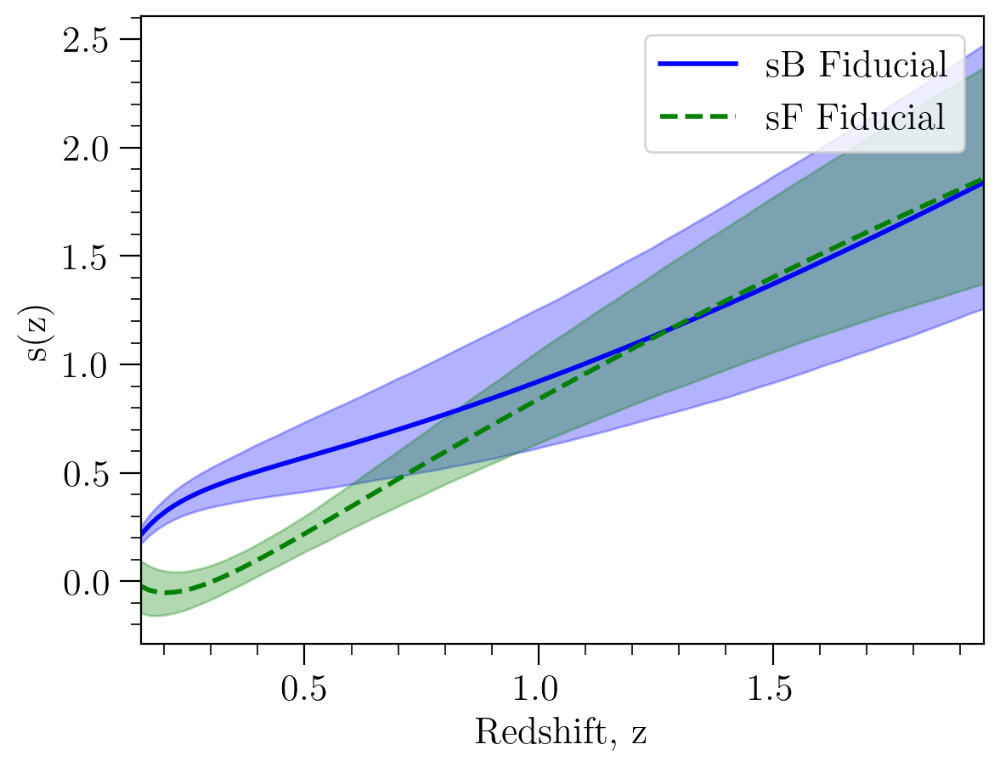

In [65]:
plt.plot(z_lin, sB_fid, '-', label=r'sB Fiducial', lw = 2.0, color='blue')
plt.plot(z_lin, sF_fid, '--', label=r'sF Fiducial', lw = 2.0, color='green')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound, sB_upper_bound, color='blue', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound, sF_upper_bound, color='green', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.legend();

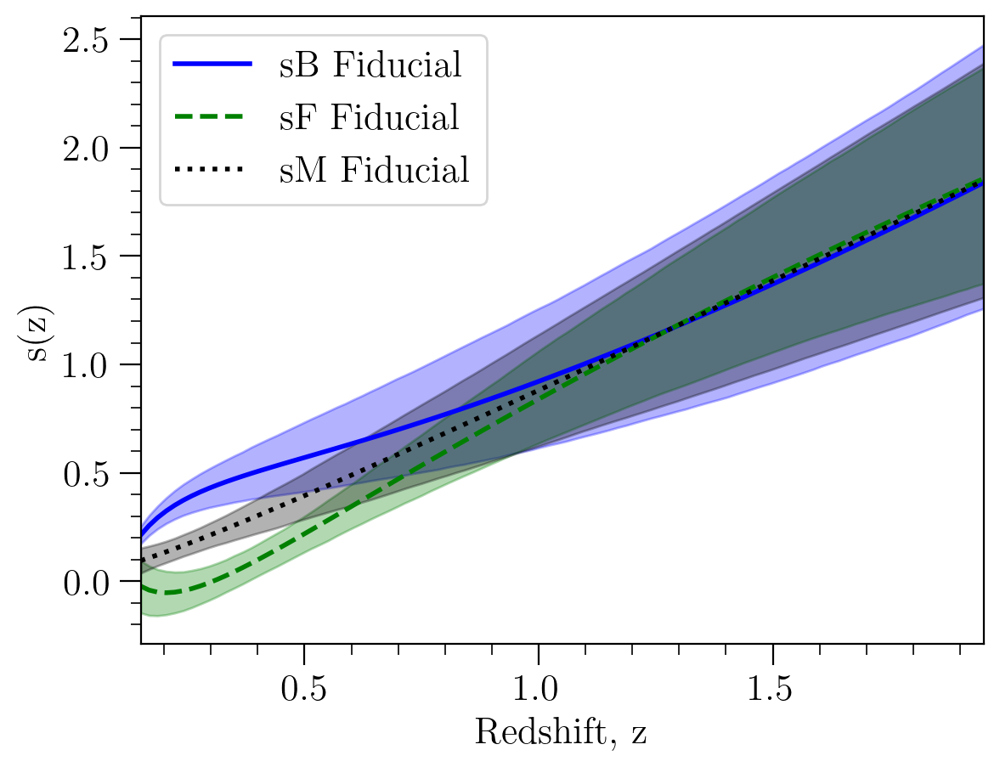

In [66]:
plt.plot(z_lin, sB_fid, '-', label=r'sB Fiducial', lw = 2.0, color='blue')
plt.plot(z_lin, sF_fid, '--', label=r'sF Fiducial', lw = 2.0, color='green')
plt.plot(z_lin, sM_fid, ':', label=r'sM Fiducial', lw = 2.0, color='black')


# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound, sB_upper_bound, color='blue', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound, sF_upper_bound, color='green', alpha=0.3)
plt.fill_between(z_lin, sM_lower_bound, sM_upper_bound, color='black', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.legend();

Compare with priors

In [67]:
# Select the marginalized covariance matrix for the magnification biases together
cov_sbias_priors = Cov_all_19bins[:8, :8]

# Generate parameter samples from multivariate normal distribution
num_samples = 2000
sbias_pars_samples_priors = np.random.multivariate_normal(sbias_fid, cov_sbias_priors, num_samples)

# Evaluate fitting function for each parameter sample
sB_samples_priors = np.array([magbias_fit(pars[:4], z_lin) for pars in sbias_pars_samples_priors])
sM_samples_priors = np.array([magbias_fit(pars[4:8], z_lin) for pars in sbias_pars_samples_priors])

# Compute the sF for each sample
sF_samples_priors = sM_samples_priors*m_split/(m_split-1) - sB_samples_priors/(m_split-1)

# Calculate the 68% confidence interval
sF_lower_bound_priors = np.percentile(sF_samples_priors, 16, axis=0)
sF_upper_bound_priors = np.percentile(sF_samples_priors, 84, axis=0)

Text(0.5, 1.0, 'Prediction vs Prior')

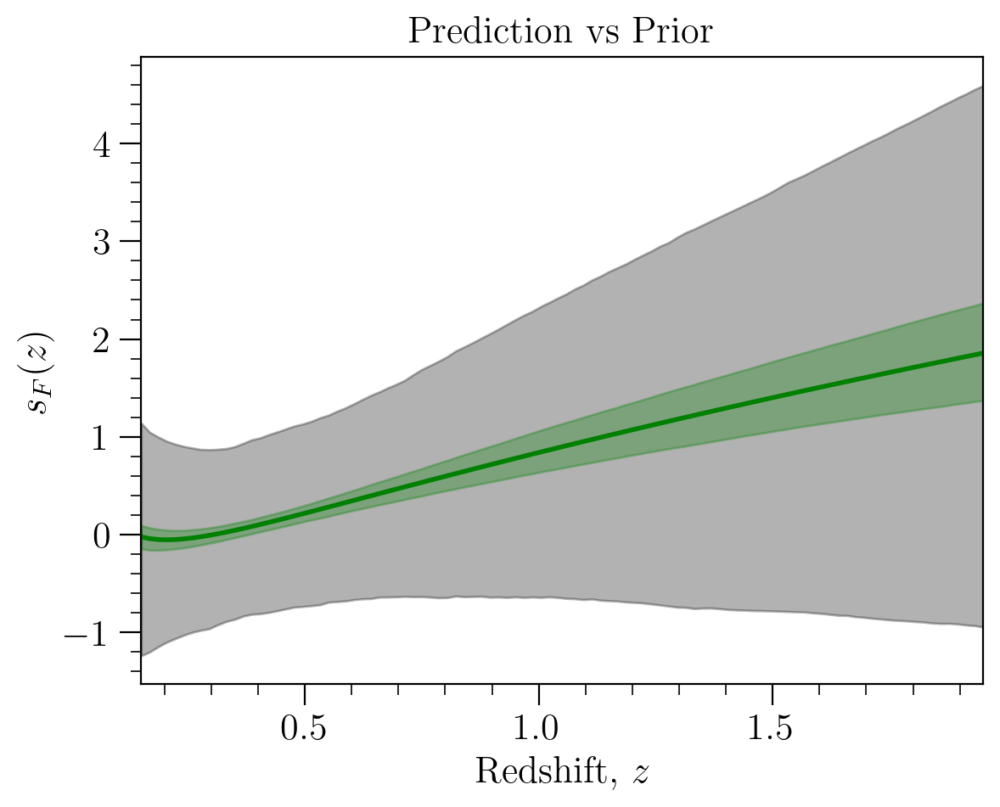

In [68]:
plt.plot(z_lin, sF_fid, '-', lw = 2.0, color='green')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sF_lower_bound_priors, sF_upper_bound_priors, color='black', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound, sF_upper_bound, color='green', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_F(z)$');
plt.title(r'Prediction vs Prior')

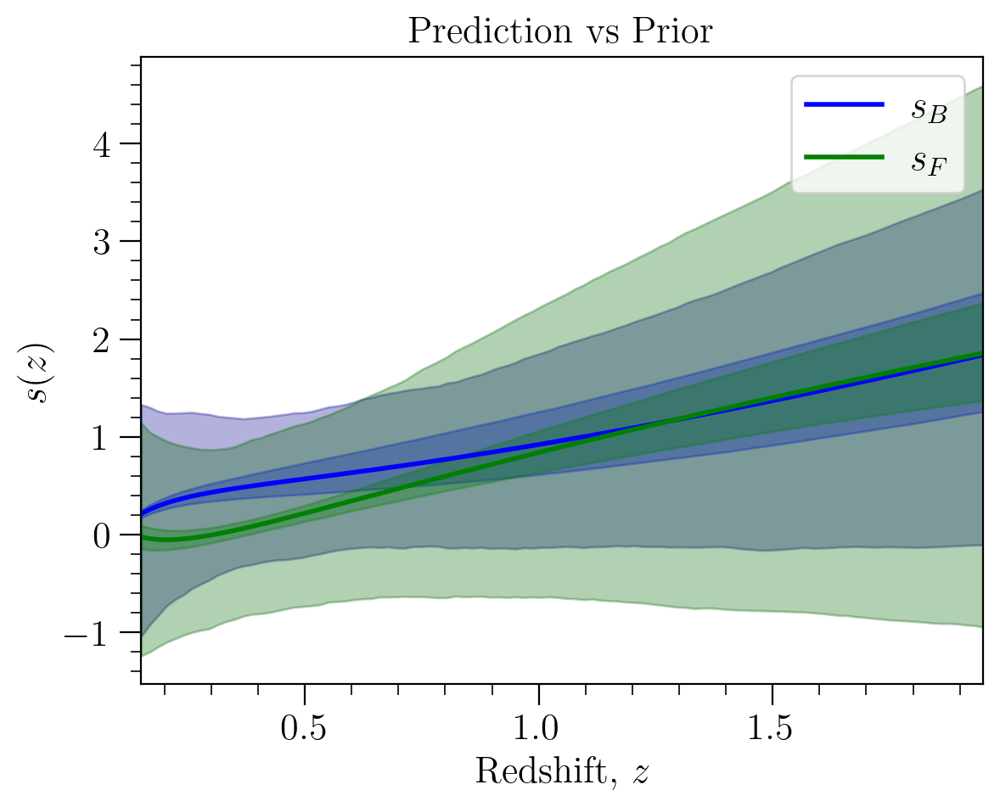

In [69]:
plt.plot(z_lin, sB_fid, '-', lw = 2.0, color='blue', label=r'$s_B$')
plt.plot(z_lin, sF_fid, '-', lw = 2.0, color='green', label=r'$s_F$')


# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_priors, sB_upper_bound_priors, color='darkblue', alpha=0.3)
plt.fill_between(z_lin, sB_lower_bound, sB_upper_bound, color='blue', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound_priors, sF_upper_bound_priors, color='darkgreen', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound, sF_upper_bound, color='green', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s(z)$');
plt.title(r'Prediction vs Prior');
plt.legend();

##### Number evolution

In [70]:
def nevol_fit(params, x):
    a, b, c, d = params
    return a + b * x + c * (1/x) + d * np.exp(-x)

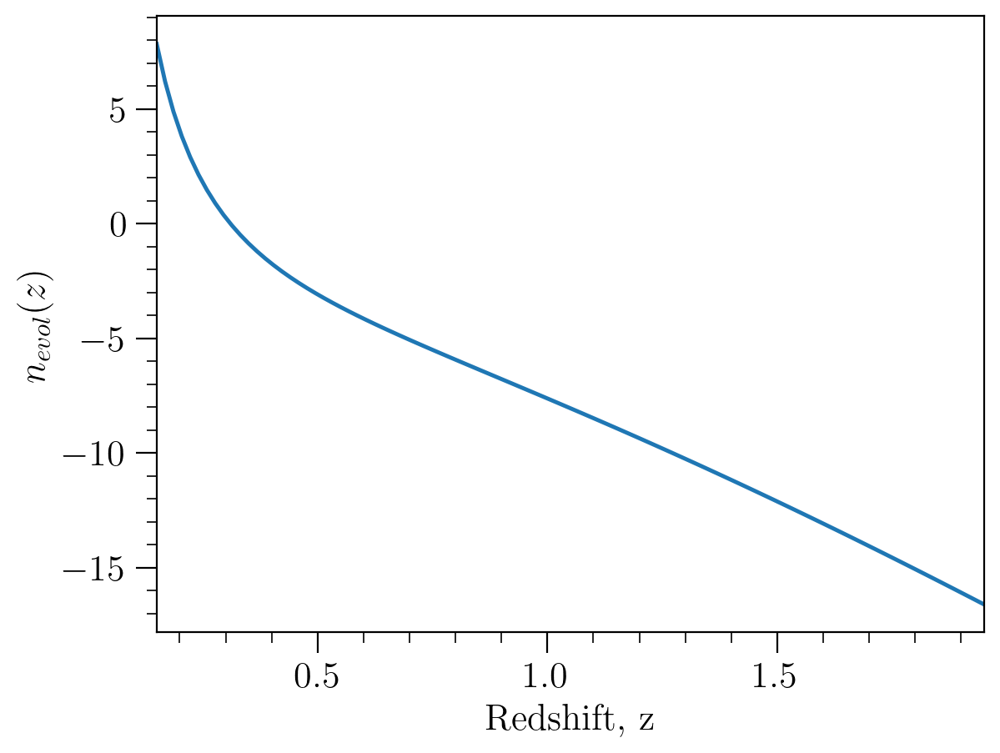

In [71]:
z_lin = np.linspace(z_bins[0], z_bins[-1], 100)
m_split = 2.

num_evol_fid = nevol_fit(nevol_fid, z_lin)

plt.plot(z_lin, num_evol_fid, '-')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z');
plt.ylabel(r'$n_{evol}(z)$');

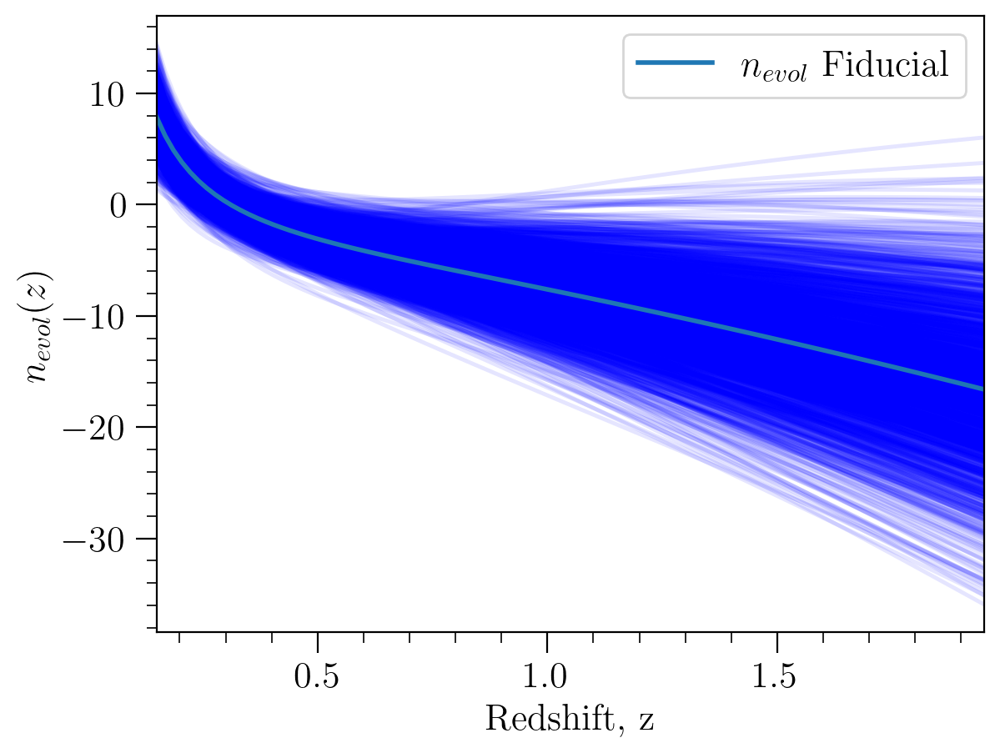

In [72]:
# Select the marginalized covariance matrix for the number evolution
cov_numevol = Sigma_Matrix_neven_19bins[8:12, 8:12]
cov_numevol_priors = Cov_all_19bins[8:12, 8:12]


# Generate parameter samples from multivariate normal distribution
num_samples = 2000
nevol_pars_samples = np.random.multivariate_normal(nevol_fid, cov_numevol, num_samples)
nevol_samples_priors = np.random.multivariate_normal(nevol_fid, cov_numevol_priors, num_samples)


# Evaluate fitting function for each parameter sample
nevol_samples = np.array([nevol_fit(pars, z_lin) for pars in nevol_pars_samples])
nevol_samples_priors = np.array([nevol_fit(pars, z_lin) for pars in nevol_samples_priors])

# Calculate the 68% confidence interval
nevol_lower_bound = np.percentile(nevol_samples, 16, axis=0)
nevol_upper_bound = np.percentile(nevol_samples, 84, axis=0)
nevol_lower_bound_priors = np.percentile(nevol_samples_priors, 16, axis=0)
nevol_upper_bound_priors = np.percentile(nevol_samples_priors, 84, axis=0)

# Step 5: Plotting

# Plot the fitting function for each sample
for sample in nevol_samples:
    plt.plot(z_lin, sample, color='blue', alpha=0.1)
    
plt.plot(z_lin, num_evol_fid, '-', label=r'$n_{evol}$'+' Fiducial', lw = 2.0)

plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$n_{evol}(z)$')
plt.legend();

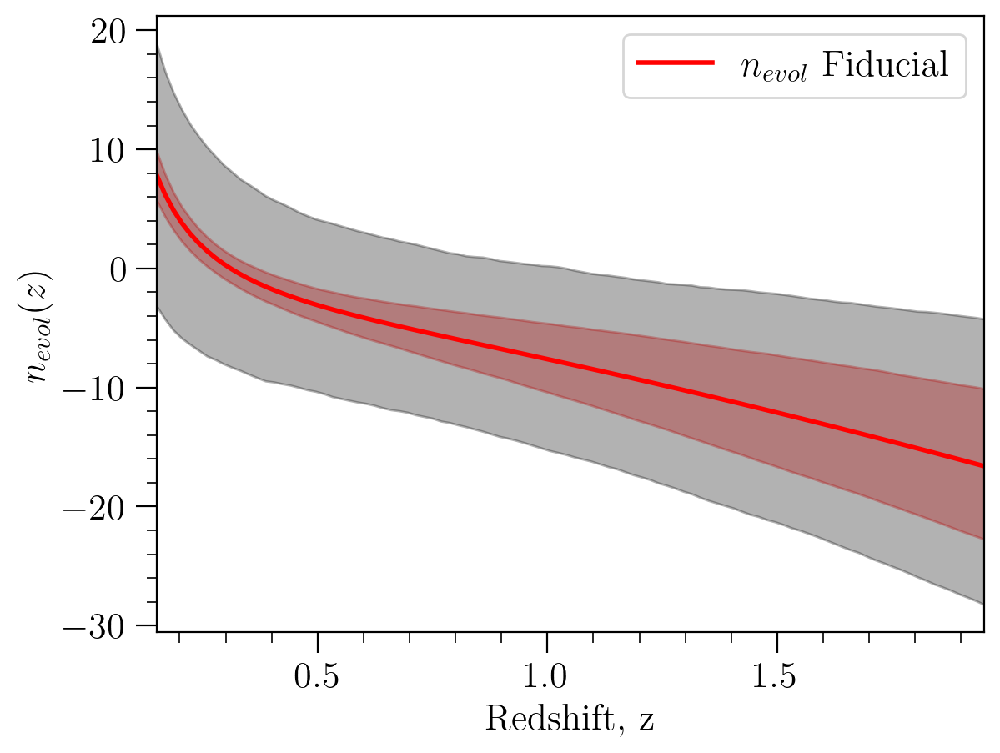

In [73]:
plt.plot(z_lin, num_evol_fid, '-', color='red', label=r'$n_{evol}$'+' Fiducial', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, nevol_lower_bound, nevol_upper_bound, color='red', alpha=0.3)
plt.fill_between(z_lin, nevol_lower_bound_priors, nevol_upper_bound_priors, color='black', alpha=0.3)


plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$n_{evol}(z)$')
plt.legend();

##### Evolution bias

The evolution bias is computed from the magnification biases and the evolution of the number densities.

$$ f^{evol}_{B}(z) = -\frac{d\log{N_B(z)}}{d\log{(1+z)}} - \frac{d\log{H(z)}}{d\log{(1+z)}} + \frac{2(1+z)}{r(z)H(z)} -5\,s_B(z)\left(1+\frac{(1+z)}{r(z)H(z)}\right) - \frac{5}{2}s_B(z)\,\frac{d\log{F_c}}{d\log{(1+z)}} $$

$$ f^{evol}_{F}(z) = -\frac{d\log{N_F(z)}}{d\log{(1+z)}} - \frac{d\log{H(z)}}{d\log{(1+z)}} + \frac{2(1+z)}{r(z)H(z)} -5\,s_F(z)\left(1+\frac{(1+z)}{r(z)H(z)}\right) 
    - \frac{5}{2}\left[\frac{\bar{N}}{\bar{N}_F}\,s_{model}(z)\frac{d\log{F_*}}{d\log{(1+z)}}-\frac{\bar{N}_B}{\bar{N}_F}\,s_B(z)\frac{d\log{F_c}}{d\log{(1+z)}}\right] $$

We have all the ingredients defined as methods in the EvolutionBias class. We need to extract the relevant terms and then sample togeter the $n_{evol}$ and magnification bias parameters to construct the predictions for each evolution bias. 

In [79]:
m_split = 2.

myEvolBias = EvolutionBias(n_split=m_split)

dlogH = myEvolBias.dlogH
rHterm = myEvolBias.rHterm
dFstar = myEvolBias.dLogFstar
dFcut = myEvolBias.dLogFcut

In [80]:
def fevol_bright(pars_s, pars_n, z):
    pars_sB = pars_s[:4] 
    return - nevol_fit(params=pars_n, x=z) - dlogH(z) + (2 - 5*magbias_fit(params=pars_sB, x=z))*rHterm(z) - 5*magbias_fit(params=pars_sB, x=z) - 5/2*magbias_fit(params=pars_sB, x=z)*dFcut(z)
    
def fevol_faint(pars_s, pars_n, z):
    
    pars_sB = pars_s[:4]
    pars_sM = pars_s[4:]
    s_B = magbias_fit(params=pars_sB, x=z)
    s_M = magbias_fit(params=pars_sM, x=z)
    s_faint = s_M*m_split/(m_split-1) - s_B/(m_split-1)
    
    return - nevol_fit(params=pars_n, x=z) - dlogH(z) + (2 - 5*s_faint)*rHterm(z) - 5*s_faint + 5/2*((1/(m_split-1)) * s_B *dFcut(z) - (m_split/(m_split-1)) * s_M *dFstar(z))

In [81]:
sbias_fid

array([-0.90110744,  1.82300203, -1.01878439, -0.30342324, -0.19376095,
        1.0747336 , -0.07806247, -0.00558005])

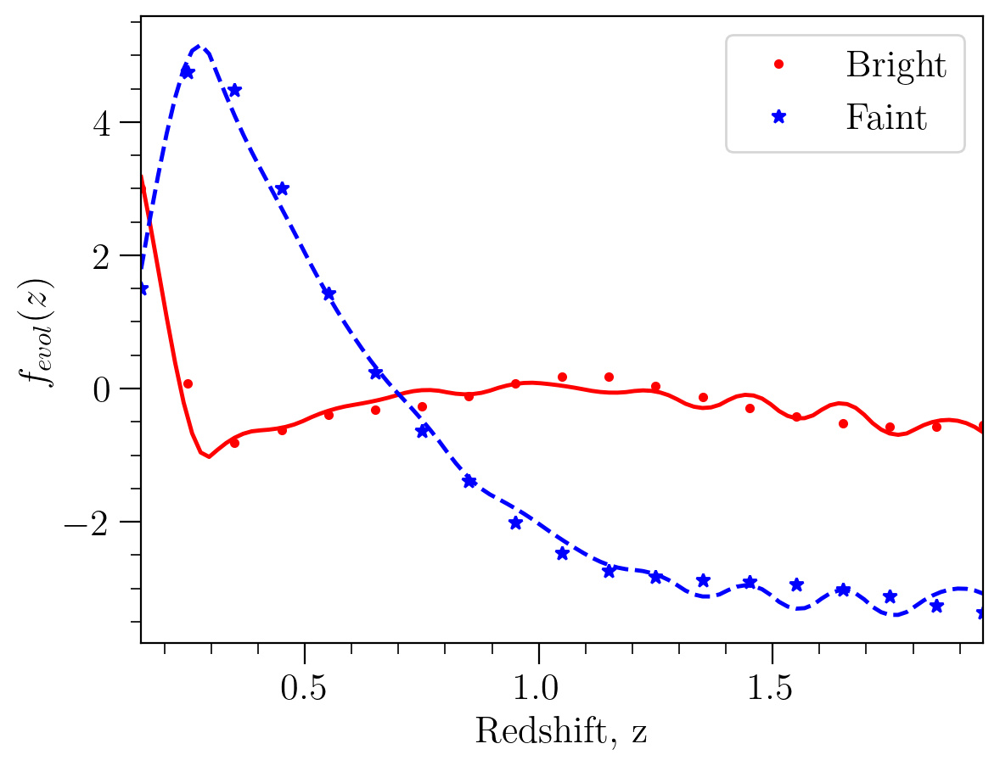

In [82]:
z_lin = np.linspace(z_bins[0], z_bins[-1], 100)

fevol_B_fid = fevol_bright(pars_s = sbias_fid, pars_n = nevol_fid, z = z_lin)
fevol_F_fid = fevol_faint(pars_s = sbias_fid, pars_n = nevol_fid, z = z_lin)

plt.plot(z_lin, fevol_B_fid, 'r-')
plt.plot(z_lin, fevol_F_fid, 'b--')

feB = myEvolBias.fevol_bright(z_bins)
feF = myEvolBias.fevol_faint(z_bins)

plt.plot(z_bins, feB, 'r.', label='Bright')
plt.plot(z_bins, feF, 'b*', label='Faint')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z');
plt.ylabel(r'$f_{evol}(z)$');
plt.legend();

In [83]:
# Select the marginalized covariance matrix for the number evolution

cov_all = Sigma_Matrix_neven_19bins[:12, :12]
cov_all_priors = Cov_all_19bins[:12, :12]

all_fid = np.concatenate([sbias_fid, nevol_fid])

# Generate parameter samples from multivariate normal distribution

num_samples = 2000
all_pars_samples = np.random.multivariate_normal(all_fid, cov_all, num_samples)
all_pars_samples_priors = np.random.multivariate_normal(all_fid, cov_all_priors, num_samples)

# Evaluate fitting function for each parameter sample

fevol_B_samples = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples])
fevol_B_samples_priors = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples_priors])
fevol_F_samples = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples])
fevol_F_samples_priors = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples_priors])

# Calculate the 68% confidence intervals

fevol_B_lower_bound = np.percentile(fevol_B_samples, 16, axis=0)
fevol_B_upper_bound = np.percentile(fevol_B_samples, 84, axis=0)
fevol_B_lower_bound_priors = np.percentile(fevol_B_samples_priors, 16, axis=0)
fevol_B_upper_bound_priors = np.percentile(fevol_B_samples_priors, 84, axis=0)

fevol_F_lower_bound = np.percentile(fevol_F_samples, 16, axis=0)
fevol_F_upper_bound = np.percentile(fevol_F_samples, 84, axis=0)
fevol_F_lower_bound_priors = np.percentile(fevol_F_samples_priors, 16, axis=0)
fevol_F_upper_bound_priors = np.percentile(fevol_F_samples_priors, 84, axis=0)

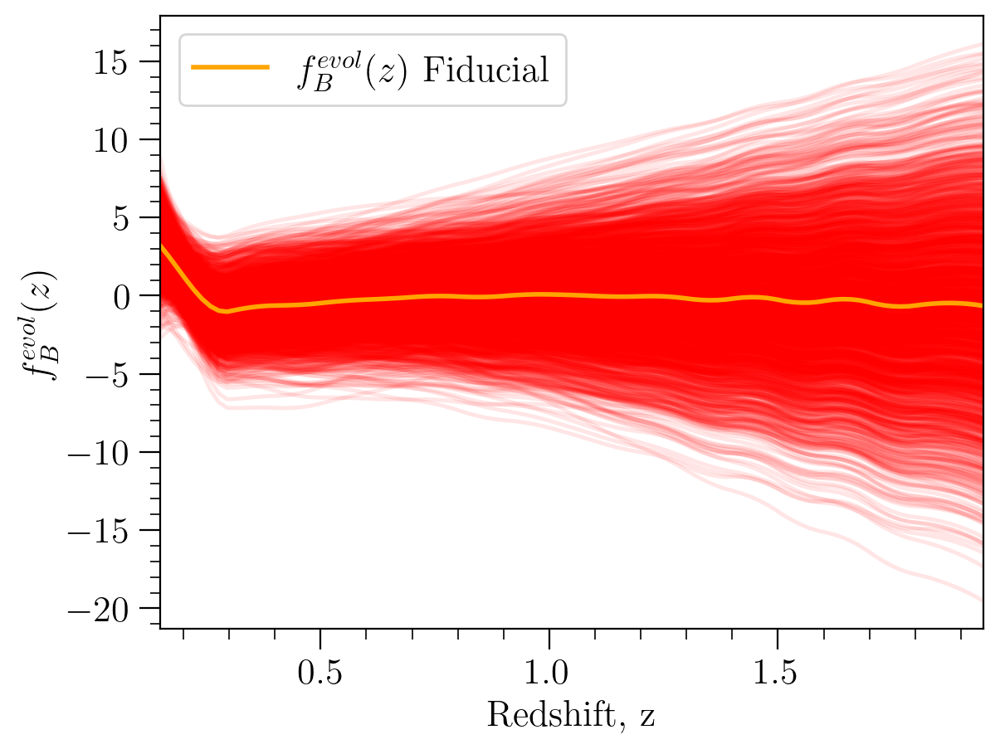

In [84]:
# Plot the fitting function for each sample
for sample in fevol_B_samples:
    plt.plot(z_lin, sample, color='red', alpha=0.1)
    
plt.plot(z_lin, fevol_B_fid, '-', color='orange', label=r'$f^{evol}_B(z)$'+' Fiducial', lw = 2.0)

plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_B(z)$')
plt.legend();

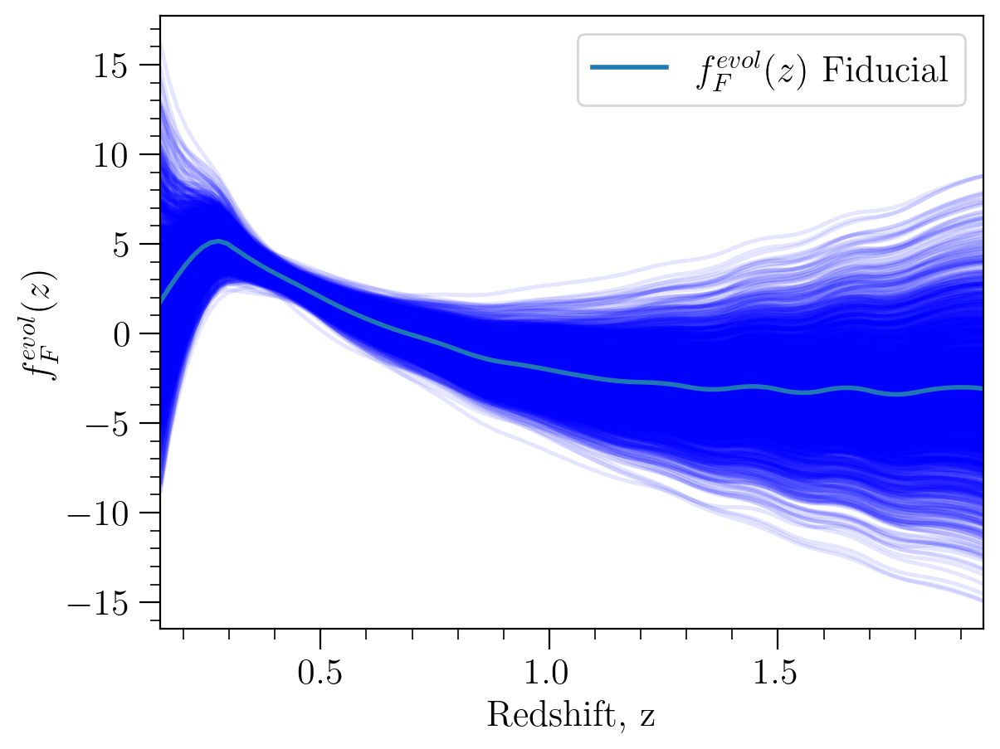

In [85]:
# Plot the fitting function for each sample
for sample in fevol_F_samples:
    plt.plot(z_lin, sample, color='blue', alpha=0.1)
    
plt.plot(z_lin, fevol_F_fid, '-', label=r'$f^{evol}_F(z)$'+' Fiducial', lw = 2.0)

plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_F(z)$')
plt.legend();

Text(0, 0.5, '$f^{evol}_B(z)$')

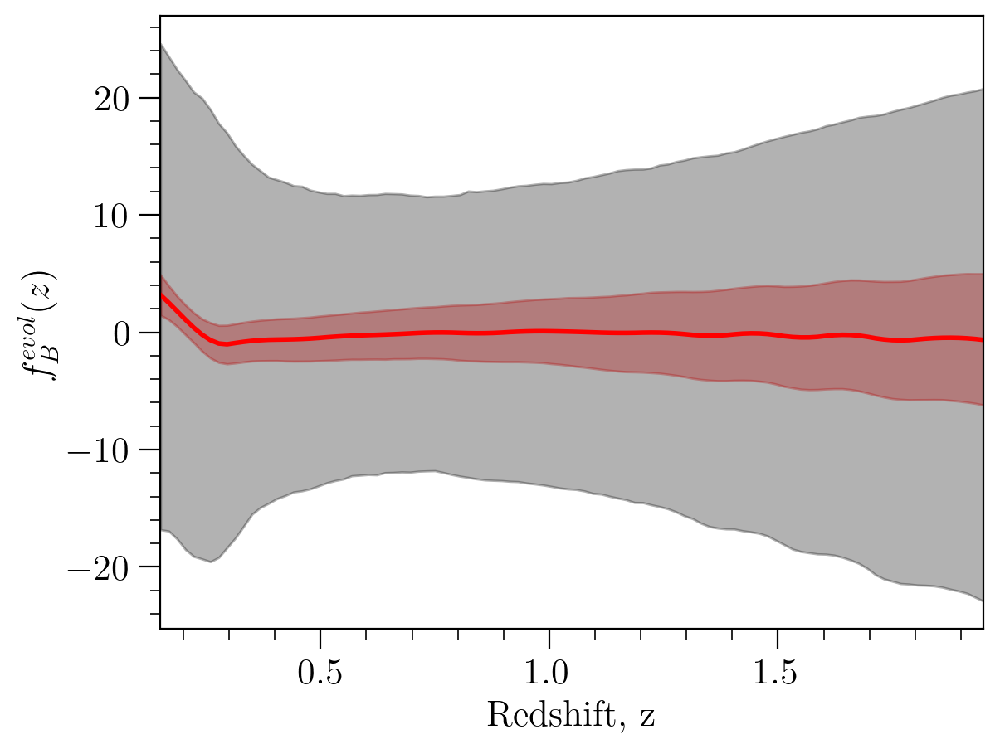

In [86]:
plt.plot(z_lin, fevol_B_fid, '-', color='red', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, fevol_B_lower_bound, fevol_B_upper_bound, color='red', alpha=0.3)
plt.fill_between(z_lin, fevol_B_lower_bound_priors, fevol_B_upper_bound_priors, color='black', alpha=0.3)


plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_B(z)$')

Text(0, 0.5, '$f^{evol}_F(z)$')

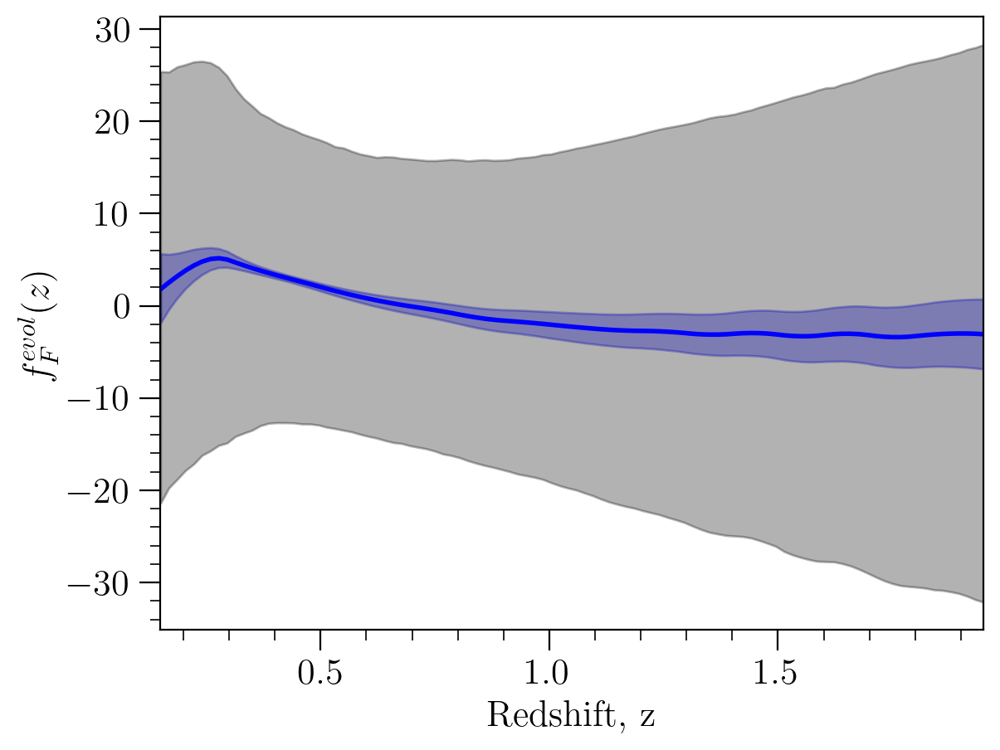

In [87]:
plt.plot(z_lin, fevol_F_fid, '-', color='blue', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, fevol_F_lower_bound, fevol_F_upper_bound, color='blue', alpha=0.3)
plt.fill_between(z_lin, fevol_F_lower_bound_priors, fevol_F_upper_bound_priors, color='black', alpha=0.3)

plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_F(z)$')

In [88]:
# SAMPLING ALL AT ONCE 

# Select the marginalized covariance matrix for the number evolution

cov_all = Sigma_Matrix_neven_19bins
cov_all_priors = Cov_all_19bins

all_fid = np.concatenate([sbias_fid, nevol_fid])

# Generate parameter samples from multivariate normal distribution

num_samples = 2000
all_pars_samples = np.random.multivariate_normal(all_fid, cov_all, num_samples)
all_pars_samples_priors = np.random.multivariate_normal(all_fid, cov_all_priors, num_samples)

In [90]:
np.shape(all_pars_samples)

(2000, 12)

In [91]:
# Evaluate fitting function for each parameter sample

sB_samples = np.array([magbias_fit(pars[:4], z_lin) for pars in all_pars_samples])
sM_samples = np.array([magbias_fit(pars[4:8], z_lin) for pars in all_pars_samples])

# Calculate the 68% confidence interval

sB_lower_bound = np.percentile(sB_samples, 16, axis=0)
sB_upper_bound = np.percentile(sB_samples, 84, axis=0)
sM_lower_bound = np.percentile(sM_samples, 16, axis=0)
sM_upper_bound = np.percentile(sM_samples, 84, axis=0)

# Evaluate fitting function for each parameter sample

sB_samples_priors = np.array([magbias_fit(pars[:4], z_lin) for pars in all_pars_samples_priors])
sM_samples_priors = np.array([magbias_fit(pars[4:8], z_lin) for pars in all_pars_samples_priors])

# Calculate the 68% confidence interval

sB_lower_bound_priors = np.percentile(sB_samples_priors, 16, axis=0)
sB_upper_bound_priors = np.percentile(sB_samples_priors, 84, axis=0)
sM_lower_bound_priors = np.percentile(sM_samples_priors, 16, axis=0)
sM_upper_bound_priors = np.percentile(sM_samples_priors, 84, axis=0)

In [92]:
# Compute the sF for each sample

sF_samples = sM_samples*m_split/(m_split-1) - sB_samples/(m_split-1)
sF_samples_priors = sM_samples_priors*m_split/(m_split-1) - sB_samples_priors/(m_split-1)

# Calculate the 68% confidence interval

sF_lower_bound = np.percentile(sF_samples, 16, axis=0)
sF_upper_bound = np.percentile(sF_samples, 84, axis=0)
sF_lower_bound_priors = np.percentile(sF_samples_priors, 16, axis=0)
sF_upper_bound_priors = np.percentile(sF_samples_priors, 84, axis=0)

In [93]:
# Evaluate fitting function for each parameter sample
nevol_samples = np.array([nevol_fit(pars[8:], z_lin) for pars in all_pars_samples])
nevol_samples_priors = np.array([nevol_fit(pars[8:], z_lin) for pars in all_pars_samples_priors])

# Calculate the 68% confidence interval
nevol_lower_bound = np.percentile(nevol_samples, 16, axis=0)
nevol_upper_bound = np.percentile(nevol_samples, 84, axis=0)
nevol_lower_bound_priors = np.percentile(nevol_samples_priors, 16, axis=0)
nevol_upper_bound_priors = np.percentile(nevol_samples_priors, 84, axis=0)

In [94]:
# Evaluate fitting function for each parameter sample

fevol_B_samples = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples])
fevol_B_samples_priors = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples_priors])
fevol_F_samples = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples])
fevol_F_samples_priors = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples_priors])

# Calculate the 68% confidence intervals

fevol_B_lower_bound = np.percentile(fevol_B_samples, 16, axis=0)
fevol_B_upper_bound = np.percentile(fevol_B_samples, 84, axis=0)
fevol_B_lower_bound_priors = np.percentile(fevol_B_samples_priors, 16, axis=0)
fevol_B_upper_bound_priors = np.percentile(fevol_B_samples_priors, 84, axis=0)

fevol_F_lower_bound = np.percentile(fevol_F_samples, 16, axis=0)
fevol_F_upper_bound = np.percentile(fevol_F_samples, 84, axis=0)
fevol_F_lower_bound_priors = np.percentile(fevol_F_samples_priors, 16, axis=0)
fevol_F_upper_bound_priors = np.percentile(fevol_F_samples_priors, 84, axis=0)

Text(0.5, 1.0, 'Prediction vs Prior')

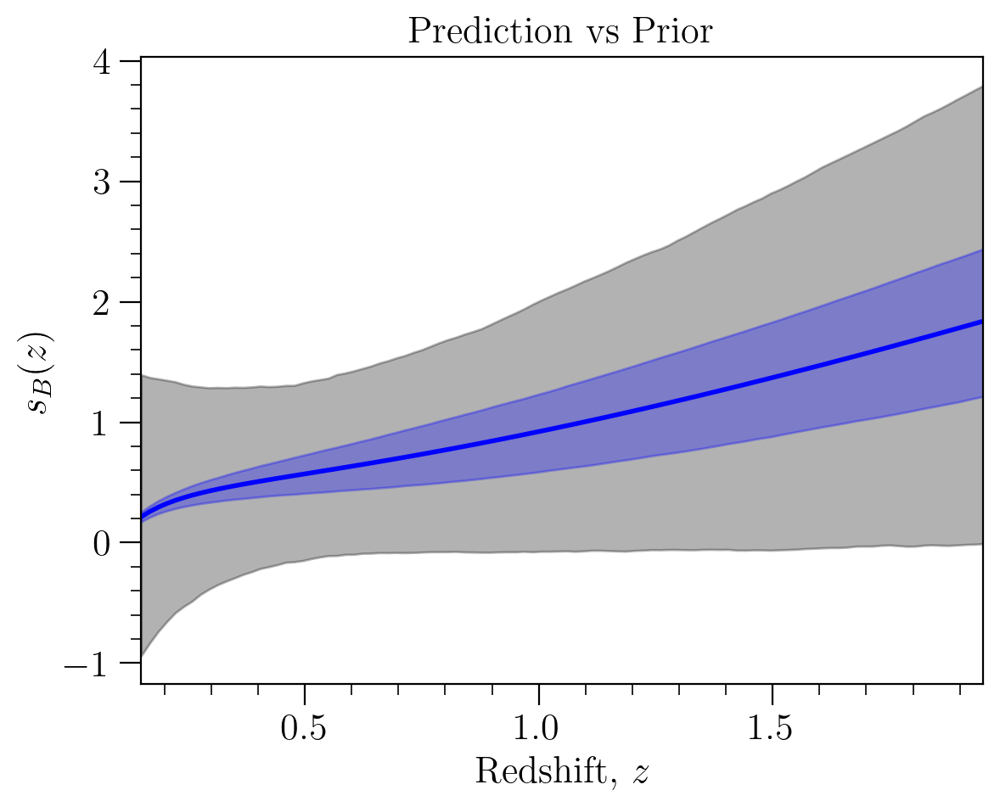

In [95]:
plt.plot(z_lin, sB_fid, '-', lw = 2.0, color='blue')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_priors, sB_upper_bound_priors, color='black', alpha=0.3)
plt.fill_between(z_lin, sB_lower_bound, sB_upper_bound, color='blue', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_B(z)$');
plt.title(r'Prediction vs Prior')

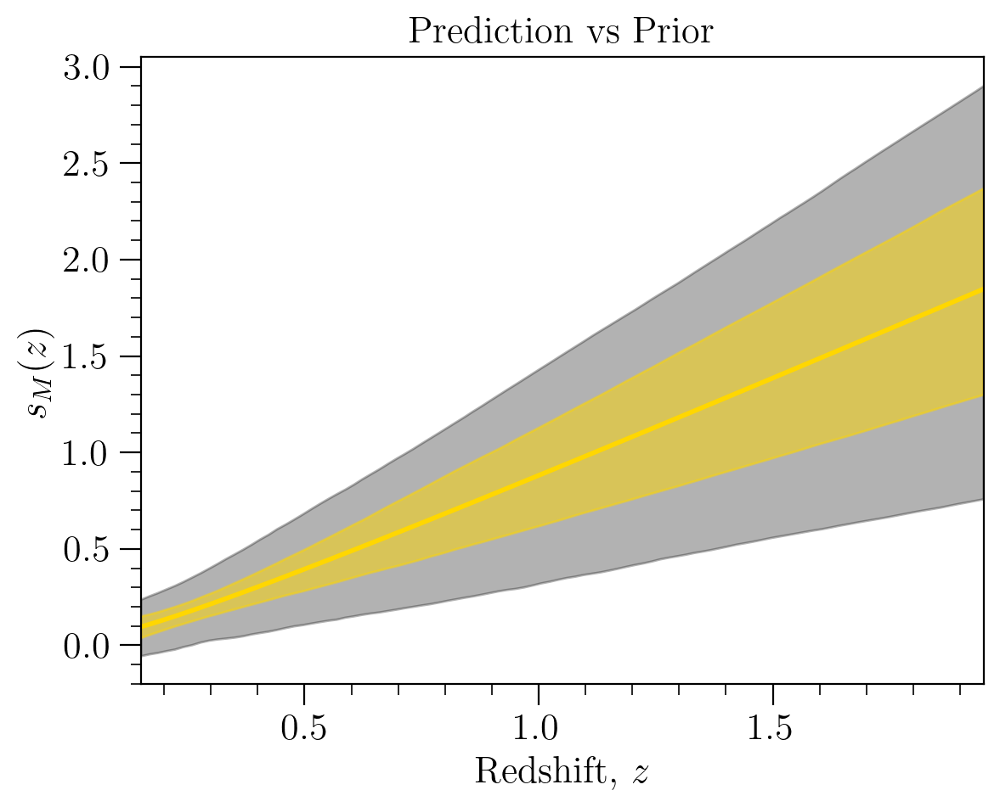

In [96]:
plt.plot(z_lin, sM_fid, '-', lw = 2.0, color='gold')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sM_lower_bound_priors, sM_upper_bound_priors, color='black', alpha=0.3)
plt.fill_between(z_lin, sM_lower_bound, sM_upper_bound, color='gold', alpha=0.5)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_M(z)$');
plt.title(r'Prediction vs Prior');

Text(0.5, 1.0, 'Prediction vs Prior')

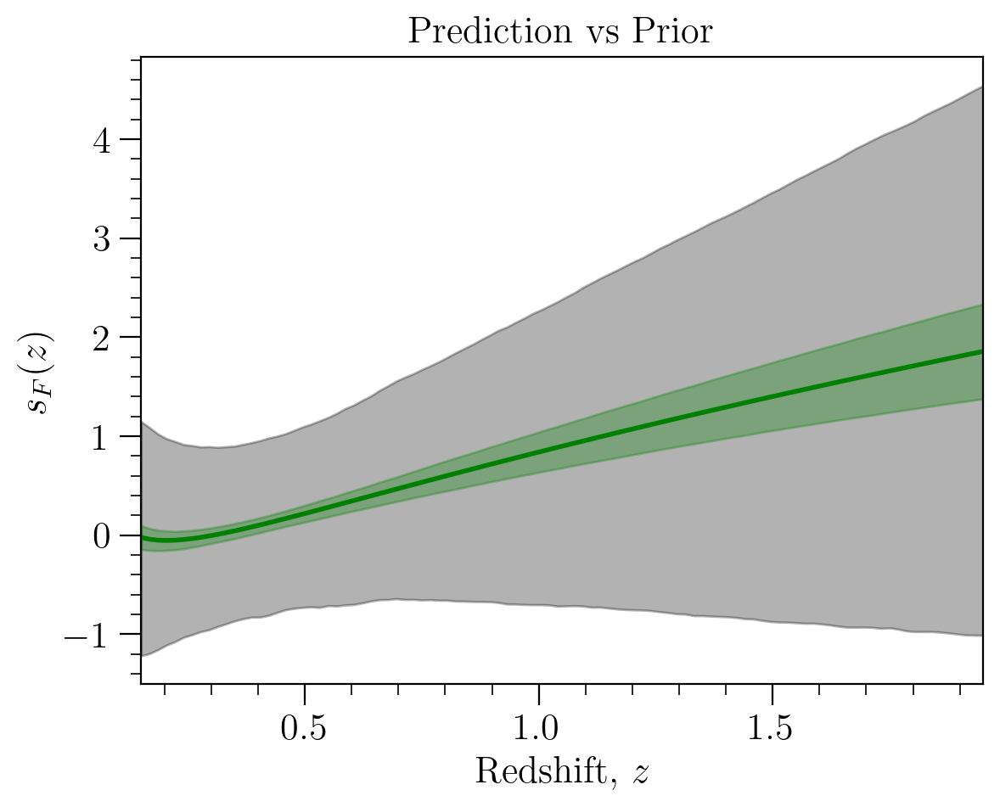

In [97]:
plt.plot(z_lin, sF_fid, '-', lw = 2.0, color='green')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sF_lower_bound_priors, sF_upper_bound_priors, color='black', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound, sF_upper_bound, color='green', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_F(z)$');
plt.title(r'Prediction vs Prior')

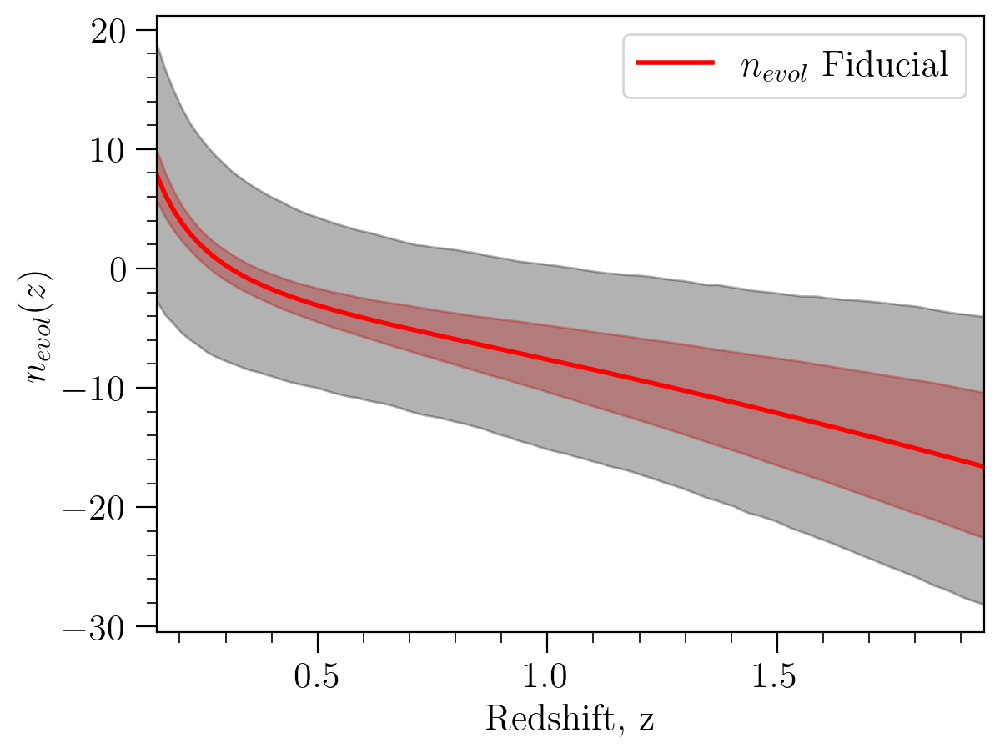

In [98]:
plt.plot(z_lin, num_evol_fid, '-', color='red', label=r'$n_{evol}$'+' Fiducial', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, nevol_lower_bound, nevol_upper_bound, color='red', alpha=0.3)
plt.fill_between(z_lin, nevol_lower_bound_priors, nevol_upper_bound_priors, color='black', alpha=0.3)


plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$n_{evol}(z)$')
plt.legend();

Text(0, 0.5, '$f^{evol}_B(z)$')

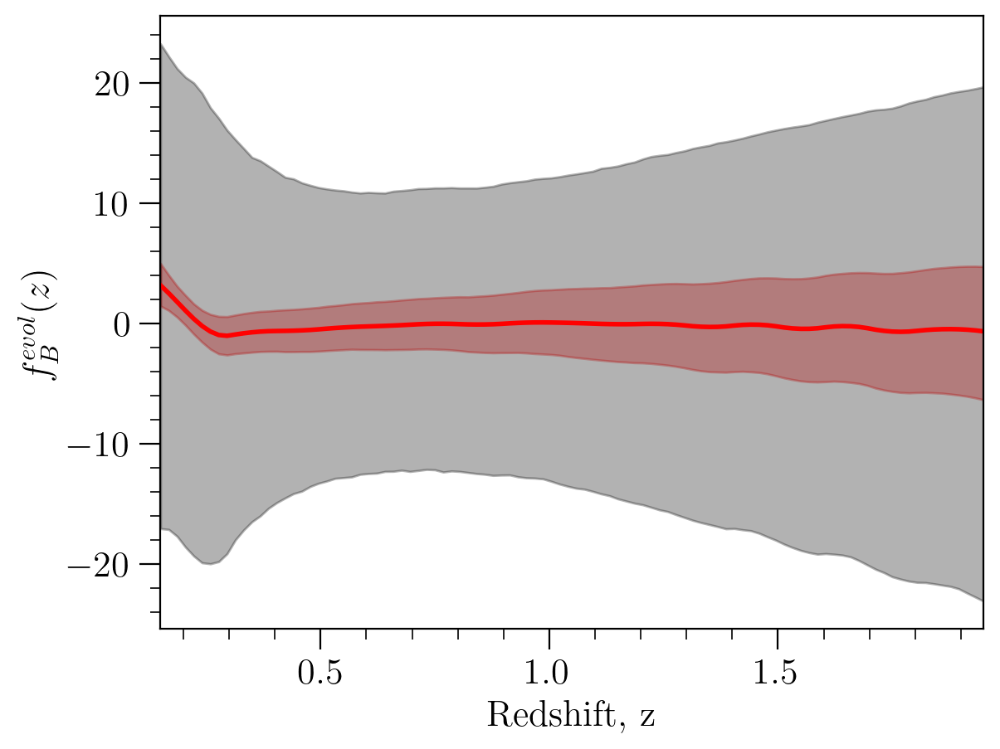

In [99]:
plt.plot(z_lin, fevol_B_fid, '-', color='red', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, fevol_B_lower_bound, fevol_B_upper_bound, color='red', alpha=0.3)
plt.fill_between(z_lin, fevol_B_lower_bound_priors, fevol_B_upper_bound_priors, color='black', alpha=0.3)


plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_B(z)$')

Text(0, 0.5, '$f^{evol}_F(z)$')

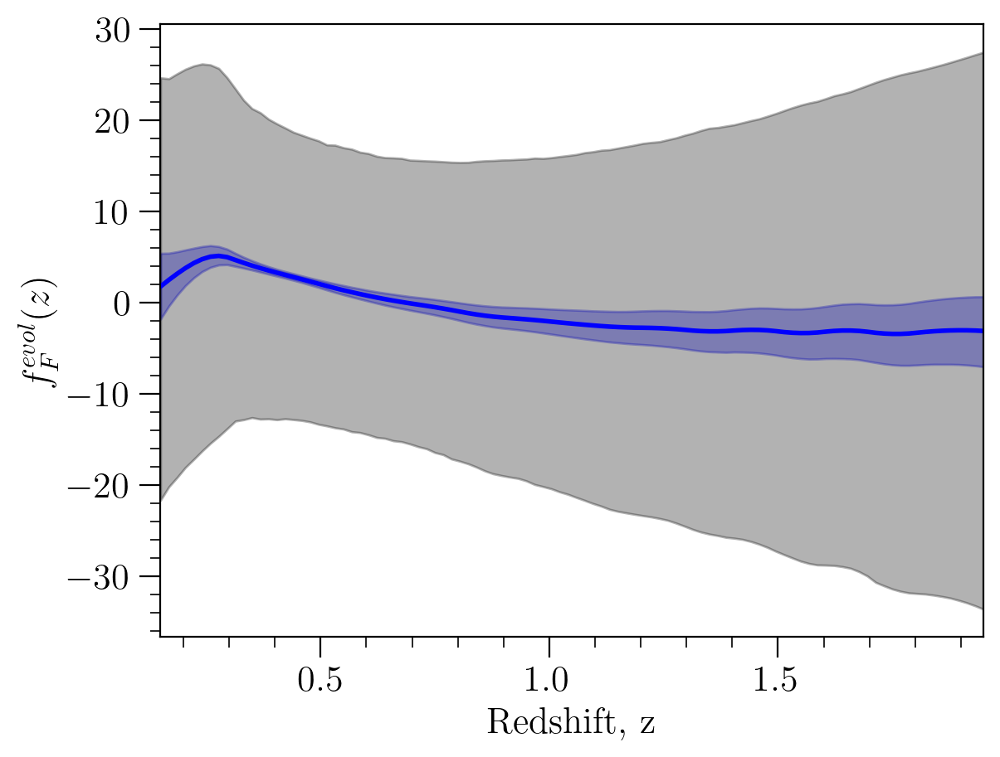

In [100]:
plt.plot(z_lin, fevol_F_fid, '-', color='blue', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, fevol_F_lower_bound, fevol_F_upper_bound, color='blue', alpha=0.3)
plt.fill_between(z_lin, fevol_F_lower_bound_priors, fevol_F_upper_bound_priors, color='black', alpha=0.3)

plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_F(z)$')

## REMOVE THE OCTUPOLE

In [137]:
# Create the Cov Matrix for sB, sF, nevol

errB = [5e-1, 5e-1] 
errF = [5e-1, 5e-1]

sB_4fit = np.array([-0.90110744,  1.82300203, -1.01878439, -0.30342324])
sF_4fit = np.array([-0.19376095,  1.0747336,  -0.07806247, -0.00558005])
nevol_fid = np.array([7.94599875, -12.03752387,   2.29927261, -15.83887369])

num_fit = nevol_fid

dsB_19bins = sB_4fit * errB[0] 
dsF_19bins = sF_4fit * errF[0]

dnum_19bins = num_fit * errB[1]

Cov_all_19bins = np.diag(np.concatenate([dsB_19bins**2, dsF_19bins**2, dnum_19bins**2]))

Inv_Cov_all_19bins = np.linalg.inv(Cov_all_19bins)

Inv_Cov_prior_all = np.zeros([len(dsignal_dtheta_fit_neven), len(dsignal_dtheta_fit_neven)])

Inv_Cov_prior_all[:len(Inv_Cov_all_19bins), :len(Inv_Cov_all_19bins)] = Inv_Cov_all_19bins

np.shape(Cov_all_19bins)

(12, 12)

In [138]:
np.shape(dsignal_dtheta_fit_neven)

(12, 19, 72)

In [139]:
index_octupole = list(range(n_sep, 2*n_sep))

print(index_octupole)

[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]


In [140]:
dsignal_dtheta_fit_dipole = np.delete(dsignal_dtheta_fit_neven, index_octupole, axis=2)

np.shape(dsignal_dtheta_fit_dipole)

(12, 19, 36)

In [141]:
np.shape(Cov_odd_multipoles_19bins), type(Cov_odd_multipoles_19bins)

((19, 72, 72), numpy.ndarray)

In [142]:
# REMOVE DIPOLE

Cov_dipole_19bins = np.delete(Cov_odd_multipoles_19bins, index_octupole, axis=1)
Cov_dipole_19bins = np.delete(Cov_dipole_19bins, index_octupole, axis=2)

np.shape(Cov_dipole_19bins)

(19, 36, 36)

In [143]:
Inv_Cov_dipole_19bins = [np.linalg.inv(Cov_dipole_19bins[k]) for k,_ in enumerate(z_bins)]

Fisher_Matrix_dipole_19bins = fm.fisher_matrix(d_signal = dsignal_dtheta_fit_dipole, inv_cov = Inv_Cov_dipole_19bins, z_bins = z_bins)
Fisher_Matrix_dipole_19bins = Fisher_Matrix_dipole_19bins + Inv_Cov_prior_all

Sigma_Matrix_dipole_19bins = np.linalg.inv(Fisher_Matrix_dipole_19bins)

np.shape(Sigma_Matrix_dipole_19bins)


 ... Computing the Fisher Matrix ... 

Signal & Cov must be given as functions (z,d) and (z,d,d') respectively. 


 ... Success! ... 



(12, 12)

#### Constraints

In [144]:
#Absolute Errors

Abs_Errors_dipole_19bins = np.sqrt(np.diag(Sigma_Matrix_dipole_19bins))

# Fiducial values

sbias_fid = np.concatenate([sB_4fit, sF_4fit])
num_fid = num_fit
#gbias_fid = np.concatenate([np.array([0.554, 0.783]), np.array([0.554, 0.783])])
#cosmic_fid = np.fromiter(params_dict0.values(), dtype=float)
#cosmic_fid[1] = np.log(10**10 * cosmic_fid[1])

#params_fid = np.concatenate([sbias_fid, num_fid, gbias_fid, cosmic_fid])
params_fid = np.concatenate([sbias_fid, num_fid])

# Relative errors

Rel_Errors_dipole_19bins = np.abs(Abs_Errors_dipole_19bins/params_fid)

params_errors_dipole_19bins = Rel_Errors_dipole_19bins * 100

print()
print('------------ Relative errors * 100 ------------' )
print()
print('sbias = ', params_errors_dipole_19bins[0:len(sbias_fid)])
print()
print('number = ', params_errors_dipole_19bins[len(sbias_fid):(len(sbias_fid) + len(num_fid))])
print()
#print('gbias = ', params_errors_dipole_19bins[(len(sbias_fid) + len(num_fid)):(len(sbias_fid) + len(num_fid) + len(gbias_fid))])
#print()
#print('cosmic = ', params_errors_dipole_19bins[(len(sbias_fid) + len(num_fid)+len(gbias_fid)):])


------------ Relative errors * 100 ------------

sbias =  [36.81386076 20.00992031 26.36329692 26.18091096 47.7006816  31.79499497
 49.25653496 49.98536748]

number =  [44.85255782 43.74045193 40.38607746 33.16307729]



#### Predictions

In [200]:
# SAMPLING ALL AT ONCE 

# Select the marginalized covariance matrix for the number evolution

cov_dipole = Sigma_Matrix_dipole_19bins
cov_all_priors = Cov_all_19bins

all_fid = np.concatenate([sbias_fid, nevol_fid])

# Generate parameter samples from multivariate normal distribution

num_samples = 2000
all_pars_samples = np.random.multivariate_normal(all_fid, cov_dipole, num_samples)
all_pars_samples_priors = np.random.multivariate_normal(all_fid, cov_all_priors, num_samples)

In [201]:
np.shape(all_pars_samples)

(2000, 12)

In [202]:
# Evaluate fitting function for each parameter sample

sB_samples_ = np.array([magbias_fit(pars[:4], z_lin) for pars in all_pars_samples])
sM_samples_ = np.array([magbias_fit(pars[4:8], z_lin) for pars in all_pars_samples])

# Calculate the 68% confidence interval

sB_lower_bound_ = np.percentile(sB_samples, 16, axis=0)
sB_upper_bound_ = np.percentile(sB_samples, 84, axis=0)
sM_lower_bound_ = np.percentile(sM_samples, 16, axis=0)
sM_upper_bound_ = np.percentile(sM_samples, 84, axis=0)

# Evaluate fitting function for each parameter sample

sB_samples_priors_ = np.array([magbias_fit(pars[:4], z_lin) for pars in all_pars_samples_priors])
sM_samples_priors_ = np.array([magbias_fit(pars[4:8], z_lin) for pars in all_pars_samples_priors])

# Calculate the 68% confidence interval

sB_lower_bound_priors_ = np.percentile(sB_samples_priors, 16, axis=0)
sB_upper_bound_priors_ = np.percentile(sB_samples_priors, 84, axis=0)
sM_lower_bound_priors_ = np.percentile(sM_samples_priors, 16, axis=0)
sM_upper_bound_priors_ = np.percentile(sM_samples_priors, 84, axis=0)

In [203]:
# Compute the sF for each sample

sF_samples_ = sM_samples*m_split/(m_split-1) - sB_samples/(m_split-1)
sF_samples_priors_ = sM_samples_priors*m_split/(m_split-1) - sB_samples_priors/(m_split-1)

# Calculate the 68% confidence interval

sF_lower_bound_ = np.percentile(sF_samples, 16, axis=0)
sF_upper_bound_ = np.percentile(sF_samples, 84, axis=0)
sF_lower_bound_priors_ = np.percentile(sF_samples_priors, 16, axis=0)
sF_upper_bound_priors_ = np.percentile(sF_samples_priors, 84, axis=0)

In [204]:
# Evaluate fitting function for each parameter sample
nevol_samples_ = np.array([nevol_fit(pars[8:], z_lin) for pars in all_pars_samples])
nevol_samples_priors_ = np.array([nevol_fit(pars[8:], z_lin) for pars in all_pars_samples_priors])

# Calculate the 68% confidence interval
nevol_lower_bound_ = np.percentile(nevol_samples, 16, axis=0)
nevol_upper_bound_ = np.percentile(nevol_samples, 84, axis=0)
nevol_lower_bound_priors_ = np.percentile(nevol_samples_priors, 16, axis=0)
nevol_upper_bound_priors_ = np.percentile(nevol_samples_priors, 84, axis=0)

In [205]:
# Evaluate fitting function for each parameter sample

fevol_B_samples_ = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples])
fevol_B_samples_priors_ = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples_priors])
fevol_F_samples_ = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples])
fevol_F_samples_priors_ = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples_priors])

# Calculate the 68% confidence intervals

fevol_B_lower_bound_ = np.percentile(fevol_B_samples, 16, axis=0)
fevol_B_upper_bound_ = np.percentile(fevol_B_samples, 84, axis=0)
fevol_B_lower_bound_priors_ = np.percentile(fevol_B_samples_priors, 16, axis=0)
fevol_B_upper_bound_priors_ = np.percentile(fevol_B_samples_priors, 84, axis=0)

fevol_F_lower_bound_ = np.percentile(fevol_F_samples, 16, axis=0)
fevol_F_upper_bound_ = np.percentile(fevol_F_samples, 84, axis=0)
fevol_F_lower_bound_priors_ = np.percentile(fevol_F_samples_priors, 16, axis=0)
fevol_F_upper_bound_priors_ = np.percentile(fevol_F_samples_priors, 84, axis=0)

Text(0.5, 1.0, 'Prediction vs Prior')

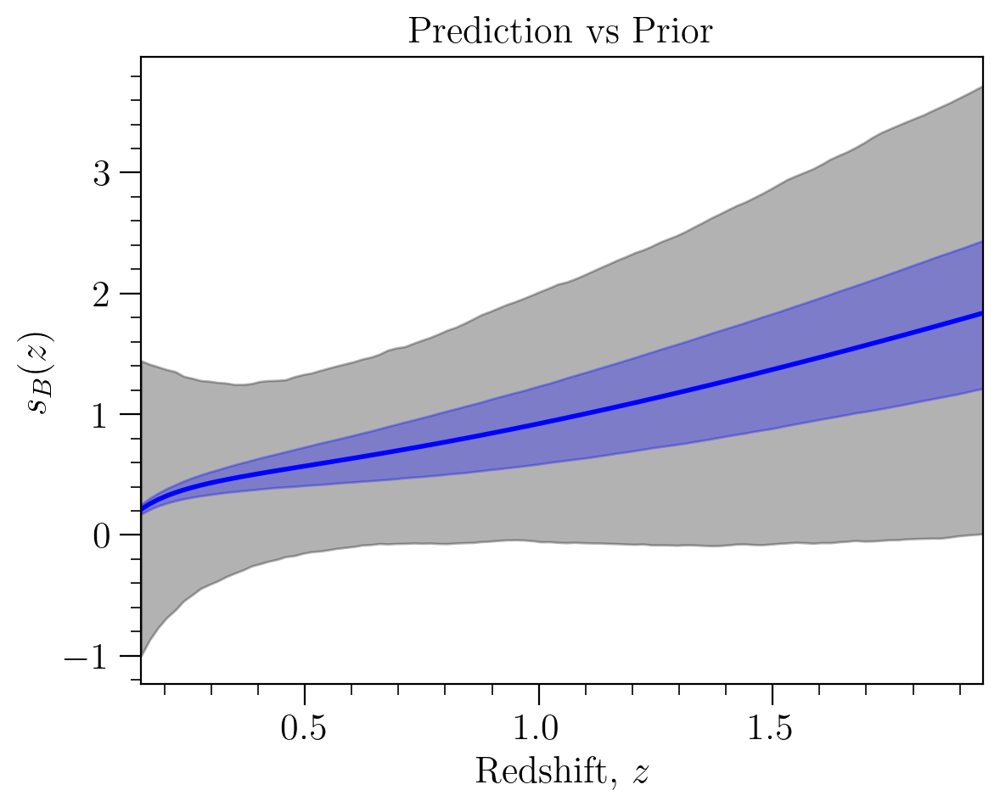

In [154]:
plt.plot(z_lin, sB_fid, '-', lw = 2.0, color='blue')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_priors, sB_upper_bound_priors, color='black', alpha=0.3)
plt.fill_between(z_lin, sB_lower_bound_, sB_upper_bound_, color='blue', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_B(z)$');
plt.title(r'Prediction vs Prior')

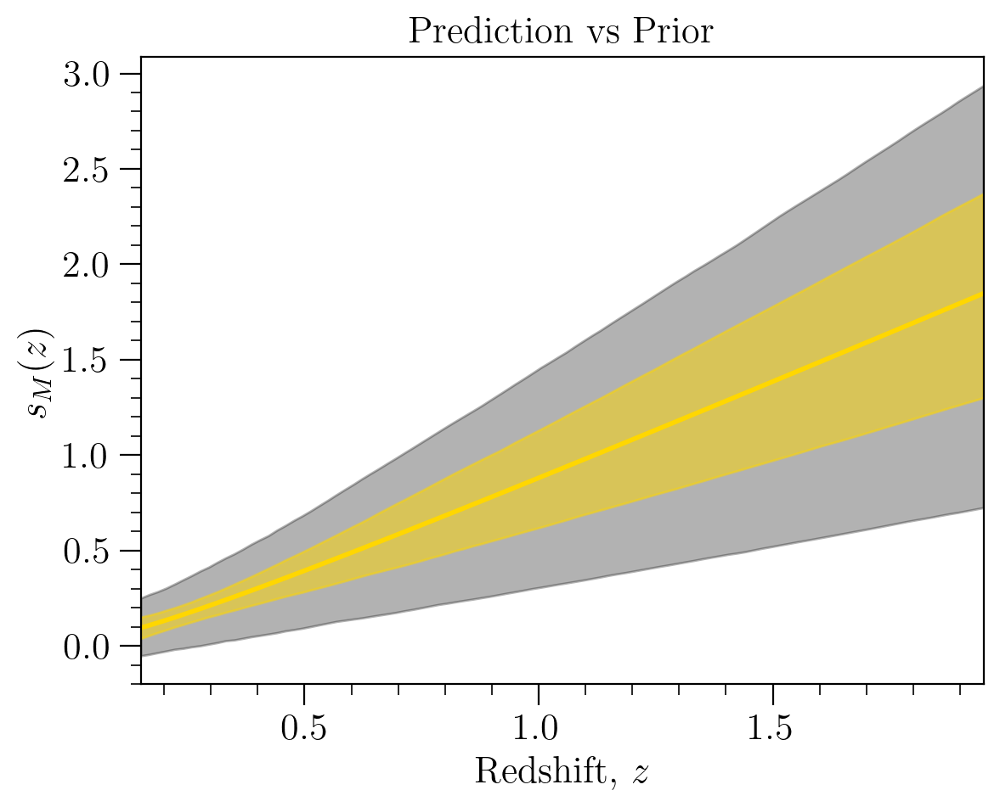

In [155]:
plt.plot(z_lin, sM_fid, '-', lw = 2.0, color='gold')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sM_lower_bound_priors, sM_upper_bound_priors, color='black', alpha=0.3)
plt.fill_between(z_lin, sM_lower_bound_, sM_upper_bound_, color='gold', alpha=0.5)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_M(z)$');
plt.title(r'Prediction vs Prior');

Text(0.5, 1.0, 'Prediction vs Prior')

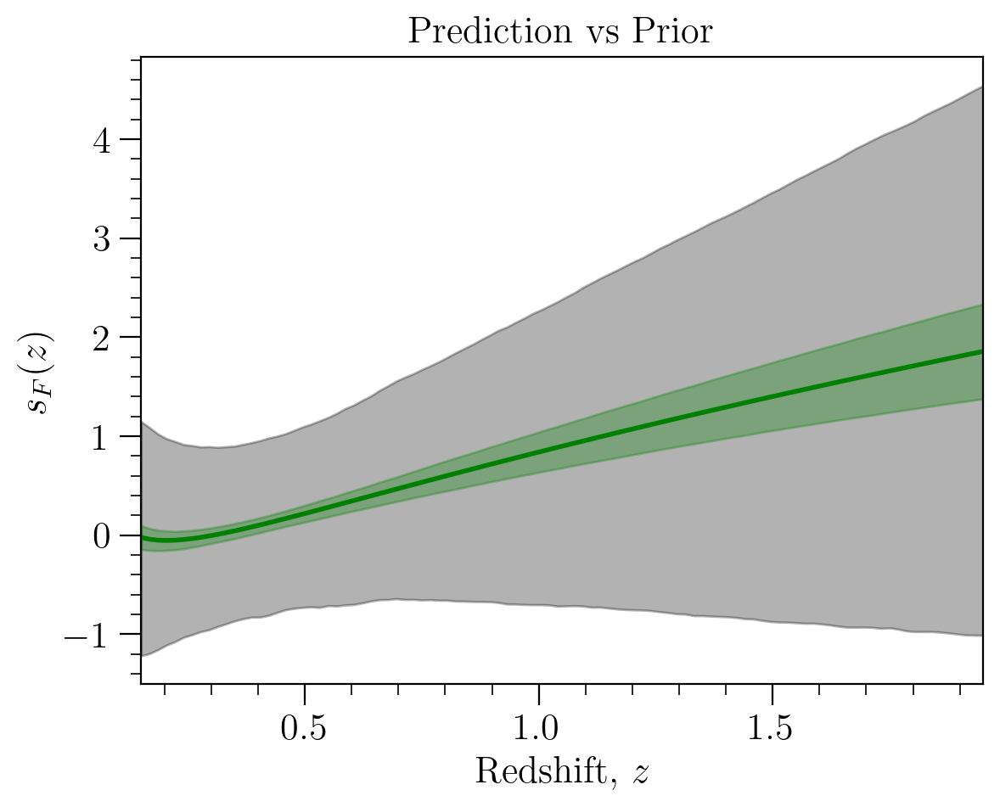

In [156]:
plt.plot(z_lin, sF_fid, '-', lw = 2.0, color='green')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sF_lower_bound_priors, sF_upper_bound_priors, color='black', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound_, sF_upper_bound_, color='green', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_F(z)$');
plt.title(r'Prediction vs Prior')

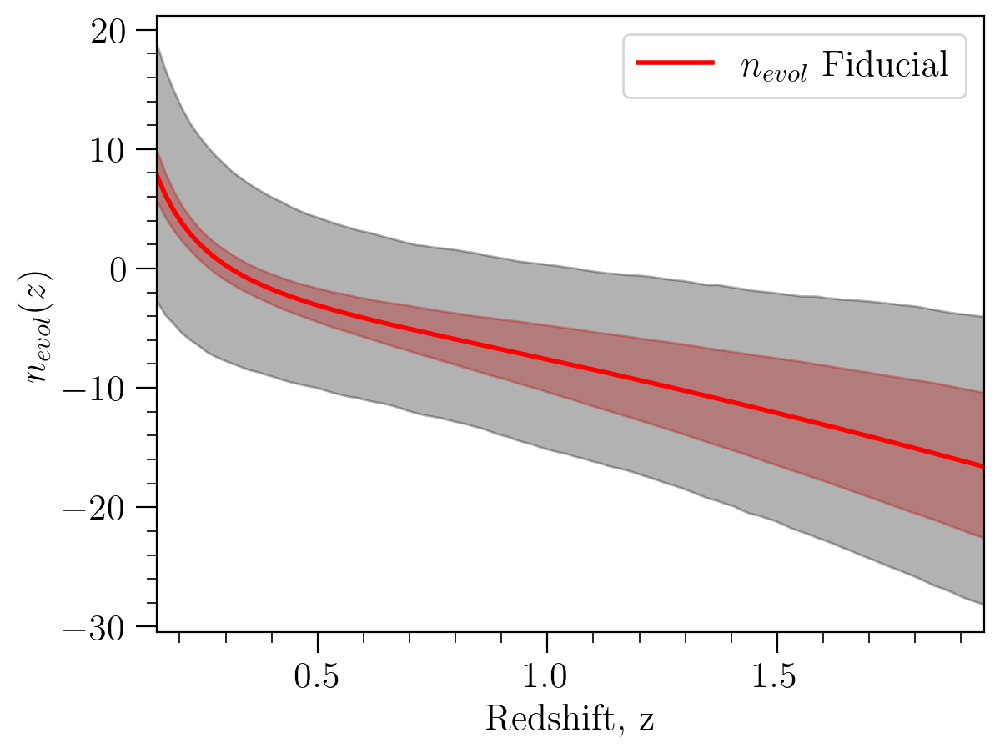

In [157]:
plt.plot(z_lin, num_evol_fid, '-', color='red', label=r'$n_{evol}$'+' Fiducial', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, nevol_lower_bound, nevol_upper_bound, color='red', alpha=0.3)
plt.fill_between(z_lin, nevol_lower_bound_priors_, nevol_upper_bound_priors_, color='black', alpha=0.3)


plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$n_{evol}(z)$')
plt.legend();

Text(0, 0.5, '$f^{evol}_B(z)$')

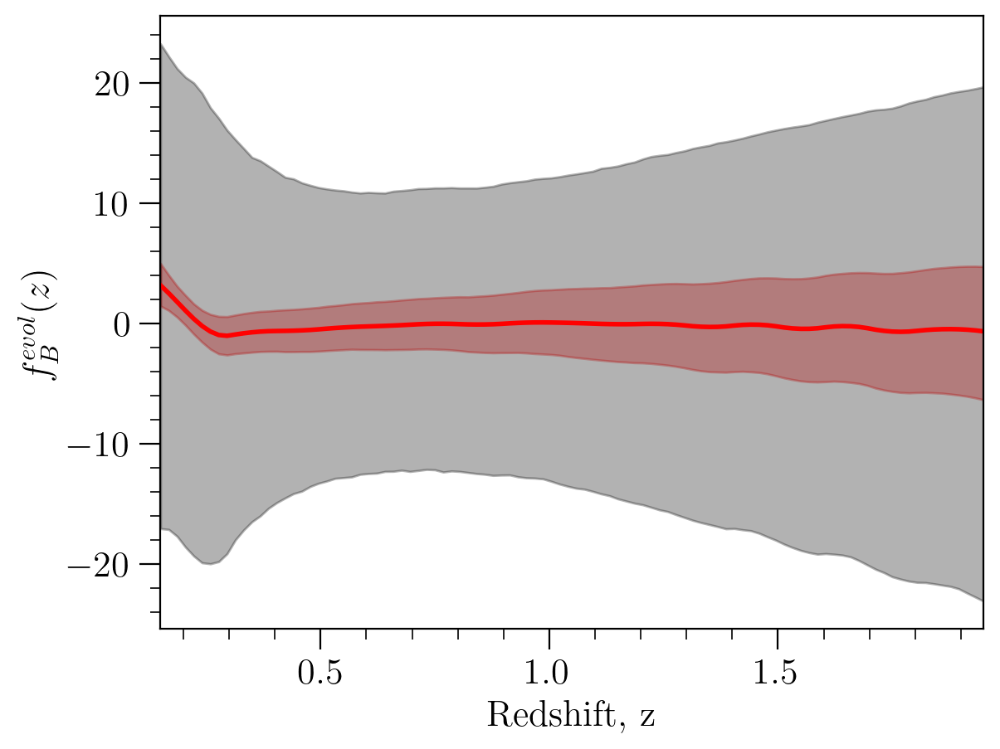

In [158]:
plt.plot(z_lin, fevol_B_fid, '-', color='red', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, fevol_B_lower_bound, fevol_B_upper_bound, color='red', alpha=0.3)
plt.fill_between(z_lin, fevol_B_lower_bound_priors_, fevol_B_upper_bound_priors_, color='black', alpha=0.3)


plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_B(z)$')

Text(0, 0.5, '$f^{evol}_F(z)$')

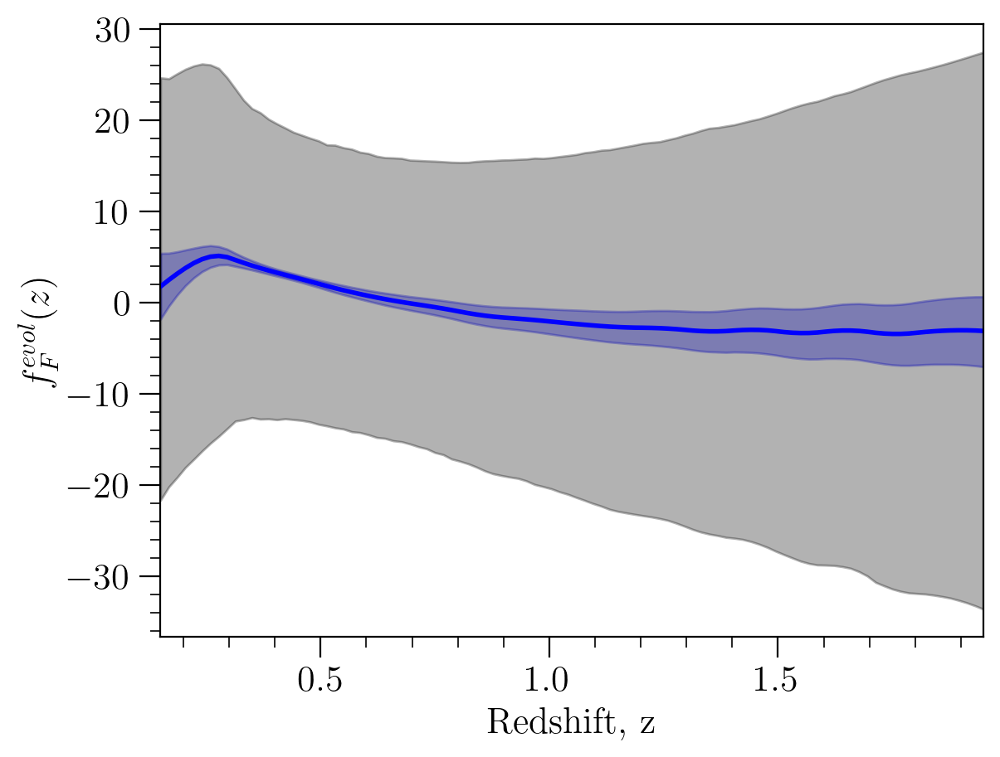

In [159]:
plt.plot(z_lin, fevol_F_fid, '-', color='blue', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, fevol_F_lower_bound, fevol_F_upper_bound, color='blue', alpha=0.3)
plt.fill_between(z_lin, fevol_F_lower_bound_priors_, fevol_F_upper_bound_priors_, color='black', alpha=0.3)

plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_F(z)$')

## REMOVE THE DIPOLE

In [161]:
# Create the Cov Matrix for sB, sF, nevol

errB = [5e-1, 5e-1] 
errF = [5e-1, 5e-1]

sB_4fit = np.array([-0.90110744,  1.82300203, -1.01878439, -0.30342324])
sF_4fit = np.array([-0.19376095,  1.0747336,  -0.07806247, -0.00558005])
nevol_fid = np.array([7.94599875, -12.03752387,   2.29927261, -15.83887369])

num_fit = nevol_fid

dsB_19bins = sB_4fit * errB[0] 
dsF_19bins = sF_4fit * errF[0]

dnum_19bins = num_fit * errB[1]

Cov_all_19bins = np.diag(np.concatenate([dsB_19bins**2, dsF_19bins**2, dnum_19bins**2]))

Inv_Cov_all_19bins = np.linalg.inv(Cov_all_19bins)

Inv_Cov_prior_all = np.zeros([len(dsignal_dtheta_fit_neven), len(dsignal_dtheta_fit_neven)])

Inv_Cov_prior_all[:len(Inv_Cov_all_19bins), :len(Inv_Cov_all_19bins)] = Inv_Cov_all_19bins

np.shape(Cov_all_19bins)

(12, 12)

In [162]:
np.shape(dsignal_dtheta_fit_neven)

(12, 19, 72)

In [163]:
index_dipole = list(range(0, n_sep))

print(index_dipole)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35]


In [164]:
dsignal_dtheta_fit_octupole = np.delete(dsignal_dtheta_fit_neven, index_dipole, axis=2)

np.shape(dsignal_dtheta_fit_octupole)

(12, 19, 36)

In [165]:
np.shape(Cov_odd_multipoles_19bins), type(Cov_odd_multipoles_19bins)

((19, 72, 72), numpy.ndarray)

In [167]:
# REMOVE DIPOLE

Cov_octupole_19bins = np.delete(Cov_odd_multipoles_19bins, index_dipole, axis=1)
Cov_octupole_19bins = np.delete(Cov_octupole_19bins, index_dipole, axis=2)

np.shape(Cov_octupole_19bins)

(19, 36, 36)

In [178]:
Inv_Cov_octupole_19bins = [np.linalg.inv(Cov_octupole_19bins[k]) for k,_ in enumerate(z_bins)]

Fisher_Matrix_octupole_19bins = fm.fisher_matrix(d_signal = dsignal_dtheta_fit_octupole, inv_cov = Inv_Cov_octupole_19bins, z_bins = z_bins)
Fisher_Matrix_octupole_19bins = Fisher_Matrix_octupole_19bins + Inv_Cov_prior_all

Sigma_Matrix_octupole_19bins = np.linalg.inv(Fisher_Matrix_octupole_19bins)

np.shape(Sigma_Matrix_octupole_19bins)


 ... Computing the Fisher Matrix ... 

Signal & Cov must be given as functions (z,d) and (z,d,d') respectively. 


 ... Success! ... 



(12, 12)

In [345]:
dsignal_dtheta_fit_octupole[8:,8:]

array([[[ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        ...,
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.]],

       [[ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        ...,
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.]],

       [[ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        ...,
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.]],

       [[ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        [ 0.,  0.,  0., ..., -0., -0., -0.],
        ..

In [180]:
dsignal_dtheta_fit_dipole[8:,8:]

array([[[1.46882037e-04, 1.27053441e-04, 1.10728168e-04, ...,
         8.75026828e-06, 8.18530705e-06, 7.66506220e-06],
        [1.38210326e-04, 1.19552382e-04, 1.04190931e-04, ...,
         8.23366462e-06, 7.70205792e-06, 7.21252760e-06],
        [1.30224620e-04, 1.12644721e-04, 9.81708444e-05, ...,
         7.75792865e-06, 7.25703785e-06, 6.79579228e-06],
        ...,
        [9.39437622e-05, 8.12616605e-05, 7.08202370e-05, ...,
         5.59655312e-06, 5.23521157e-06, 4.90247001e-06],
        [8.94134116e-05, 7.73428924e-05, 6.74049969e-05, ...,
         5.32666455e-06, 4.98274836e-06, 4.66605295e-06],
        [8.52151392e-05, 7.37113732e-05, 6.42400966e-05, ...,
         5.07655902e-06, 4.74879090e-06, 4.44696544e-06]],

       [[1.39537935e-04, 1.20700769e-04, 1.05191759e-04, ...,
         8.31275486e-06, 7.77604170e-06, 7.28180909e-06],
        [1.45120842e-04, 1.25530001e-04, 1.09400477e-04, ...,
         8.64534785e-06, 8.08716081e-06, 7.57315398e-06],
        [1.49758313e-04, 

In [181]:
Fisher_Matrix_octupole_19bins[8:,8:]

array([[0.06335239, 0.        , 0.        , 0.        ],
       [0.        , 0.02760487, 0.        , 0.        ],
       [0.        , 0.        , 0.75662217, 0.        ],
       [0.        , 0.        , 0.        , 0.01594452]])

In [182]:
Sigma_Matrix_octupole_19bins[8:,8:]

array([[15.78472403,  0.        ,  0.        ,  0.        ],
       [ 0.        , 36.22549523,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  1.32166363,  0.        ],
       [ 0.        ,  0.        ,  0.        , 62.71747994]])

In [183]:
Sigma_Matrix_dipole_19bins[8:,8:]

array([[12.7019797 , -1.8128363 , -0.65554785, -8.75238292],
       [-1.8128363 , 27.72304018, -0.14622476,  2.94962998],
       [-0.65554785, -0.14622476,  0.86227199, -2.62975977],
       [-8.75238292,  2.94962998, -2.62975977, 27.59041527]])

#### Constraints

In [184]:
#Absolute Errors

Abs_Errors_octupole_19bins = np.sqrt(np.diag(Sigma_Matrix_octupole_19bins))

# Fiducial values

sbias_fid = np.concatenate([sB_4fit, sF_4fit])
num_fid = num_fit
#gbias_fid = np.concatenate([np.array([0.554, 0.783]), np.array([0.554, 0.783])])
#cosmic_fid = np.fromiter(params_dict0.values(), dtype=float)
#cosmic_fid[1] = np.log(10**10 * cosmic_fid[1])

#params_fid = np.concatenate([sbias_fid, num_fid, gbias_fid, cosmic_fid])
params_fid = np.concatenate([sbias_fid, num_fid])

# Relative errors

Rel_Errors_octupole_19bins = np.abs(Abs_Errors_octupole_19bins/params_fid)

params_errors_octupole_19bins = Rel_Errors_octupole_19bins * 100

print()
print('------------ Relative errors * 100 ------------' )
print()
print('sbias = ', params_errors_octupole_19bins[0:len(sbias_fid)])
print()
print('number = ', params_errors_octupole_19bins[len(sbias_fid):(len(sbias_fid) + len(num_fid))])
print()
#print('gbias = ', params_errors_dipole_19bins[(len(sbias_fid) + len(num_fid)):(len(sbias_fid) + len(num_fid) + len(gbias_fid))])
#print()
#print('cosmic = ', params_errors_dipole_19bins[(len(sbias_fid) + len(num_fid)+len(gbias_fid)):])


------------ Relative errors * 100 ------------

sbias =  [37.38194758 25.16941833 26.70778074 34.04203496 41.22794528 33.93570754
 46.99365394 49.9703557 ]

number =  [50. 50. 50. 50.]



#### Predictions

In [214]:
# SAMPLING ALL AT ONCE 

# Select the marginalized covariance matrix for the number evolution

cov_octupole = Sigma_Matrix_octupole_19bins
cov_all_priors = Cov_all_19bins

all_fid = np.concatenate([sbias_fid, nevol_fid])

# Generate parameter samples from multivariate normal distribution

num_samples = 2000
all_pars_samples = np.random.multivariate_normal(all_fid, cov_octupole, num_samples)
all_pars_samples_priors = np.random.multivariate_normal(all_fid, cov_all_priors, num_samples)

In [215]:
np.shape(all_pars_samples)

(2000, 12)

In [216]:
# Evaluate fitting function for each parameter sample

sB_samples_oct = np.array([magbias_fit(pars[:4], z_lin) for pars in all_pars_samples])
sM_samples_oct = np.array([magbias_fit(pars[4:8], z_lin) for pars in all_pars_samples])

# Calculate the 68% confidence interval

sB_lower_bound_oct = np.percentile(sB_samples_oct, 16, axis=0)
sB_upper_bound_oct = np.percentile(sB_samples_oct, 84, axis=0)
sM_lower_bound_oct = np.percentile(sM_samples_oct, 16, axis=0)
sM_upper_bound_oct = np.percentile(sM_samples_oct, 84, axis=0)

# Evaluate fitting function for each parameter sample

sB_samples_priors_oct = np.array([magbias_fit(pars[:4], z_lin) for pars in all_pars_samples_priors])
sM_samples_priors_oct = np.array([magbias_fit(pars[4:8], z_lin) for pars in all_pars_samples_priors])

# Calculate the 68% confidence interval

sB_lower_bound_priors_oct = np.percentile(sB_samples_priors_oct, 16, axis=0)
sB_upper_bound_priors_oct = np.percentile(sB_samples_priors_oct, 84, axis=0)
sM_lower_bound_priors_oct = np.percentile(sM_samples_priors_oct, 16, axis=0)
sM_upper_bound_priors_oct = np.percentile(sM_samples_priors_oct, 84, axis=0)

In [233]:
# Compute the sF for each sample

sF_samples_oct = sM_samples_oct*m_split/(m_split-1) - sB_samples_oct/(m_split-1)
sF_samples_priors_oct = sM_samples_priors_oct*m_split/(m_split-1) - sB_samples_priors_oct/(m_split-1)

# Calculate the 68% confidence interval

sF_lower_bound_oct = np.percentile(sF_samples_oct, 16, axis=0)
sF_upper_bound_oct = np.percentile(sF_samples_oct, 84, axis=0)
sF_lower_bound_priors_oct = np.percentile(sF_samples_priors_oct, 16, axis=0)
sF_upper_bound_priors_oct = np.percentile(sF_samples_priors_oct, 84, axis=0)

In [218]:
# Evaluate fitting function for each parameter sample
nevol_samples_oct = np.array([nevol_fit(pars[8:], z_lin) for pars in all_pars_samples])
nevol_samples_priors_oct = np.array([nevol_fit(pars[8:], z_lin) for pars in all_pars_samples_priors])

# Calculate the 68% confidence interval
nevol_lower_bound_oct = np.percentile(nevol_samples_oct, 16, axis=0)
nevol_upper_bound_oct = np.percentile(nevol_samples_oct, 84, axis=0)
nevol_lower_bound_priors_oct = np.percentile(nevol_samples_priors_oct, 16, axis=0)
nevol_upper_bound_priors_oct = np.percentile(nevol_samples_priors_oct, 84, axis=0)

In [219]:
# Evaluate fitting function for each parameter sample

fevol_B_samples_oct = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples])
fevol_B_samples_priors_oct = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples_priors])
fevol_F_samples_oct = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples])
fevol_F_samples_priors_oct = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples_priors])

# Calculate the 68% confidence intervals

fevol_B_lower_bound_oct = np.percentile(fevol_B_samples_oct, 16, axis=0)
fevol_B_upper_bound_oct = np.percentile(fevol_B_samples_oct, 84, axis=0)
fevol_B_lower_bound_priors_oct = np.percentile(fevol_B_samples_priors_oct, 16, axis=0)
fevol_B_upper_bound_priors_oct = np.percentile(fevol_B_samples_priors_oct, 84, axis=0)

fevol_F_lower_bound_oct = np.percentile(fevol_F_samples_oct, 16, axis=0)
fevol_F_upper_bound_oct = np.percentile(fevol_F_samples_oct, 84, axis=0)
fevol_F_lower_bound_priors_oct = np.percentile(fevol_F_samples_priors_oct, 16, axis=0)
fevol_F_upper_bound_priors_oct = np.percentile(fevol_F_samples_priors_oct, 84, axis=0)

Text(0.5, 1.0, 'Prediction vs Prior')

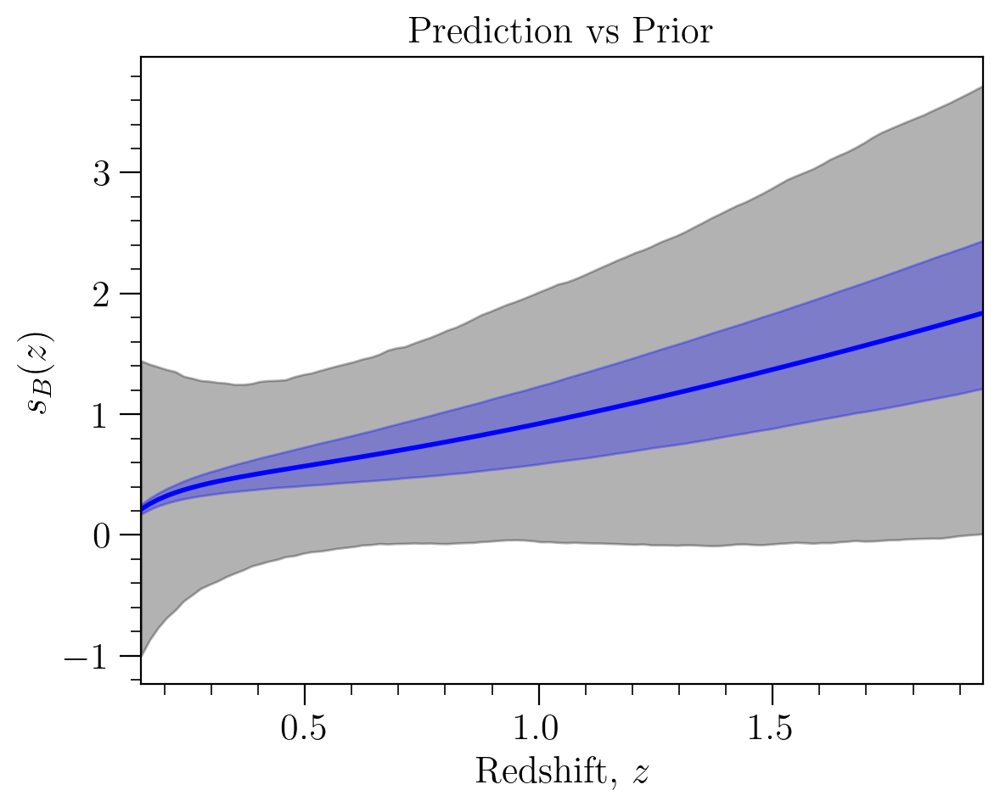

In [193]:
plt.plot(z_lin, sB_fid, '-', lw = 2.0, color='blue')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_priors, sB_upper_bound_priors, color='black', alpha=0.3)
plt.fill_between(z_lin, sB_lower_bound_oct, sB_upper_bound_oct, color='blue', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_B(z)$');
plt.title(r'Prediction vs Prior')

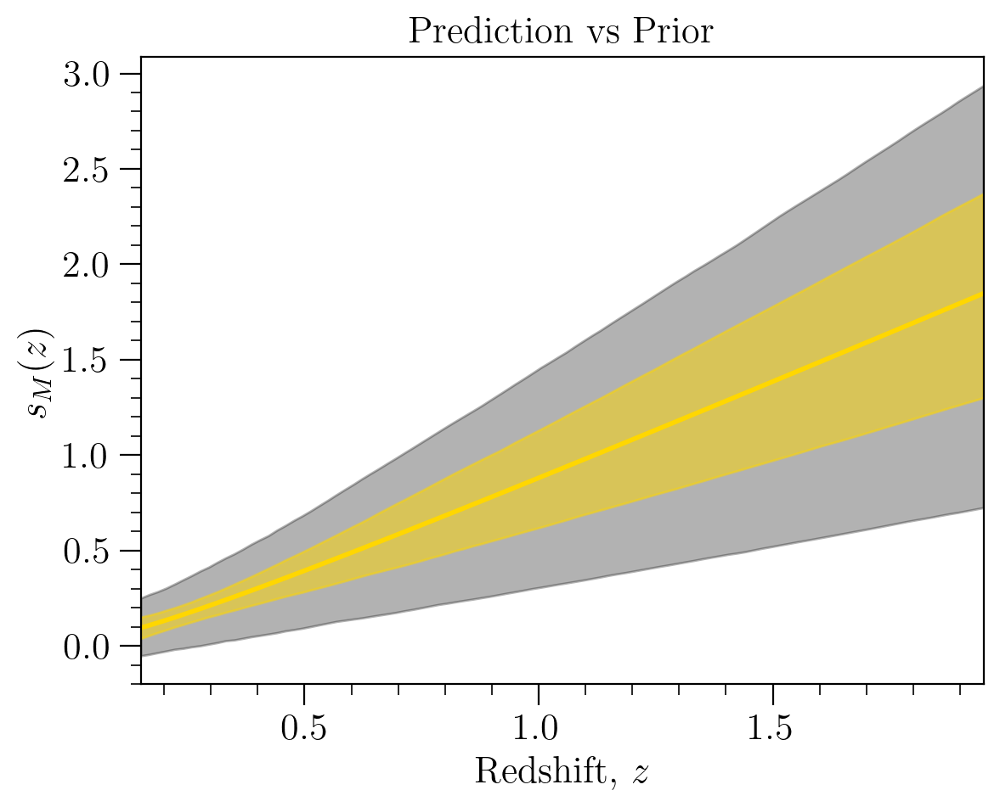

In [194]:
plt.plot(z_lin, sM_fid, '-', lw = 2.0, color='gold')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sM_lower_bound_priors, sM_upper_bound_priors, color='black', alpha=0.3)
plt.fill_between(z_lin, sM_lower_bound_oct, sM_upper_bound_oct, color='gold', alpha=0.5)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_M(z)$');
plt.title(r'Prediction vs Prior');

Text(0.5, 1.0, 'Prediction vs Prior')

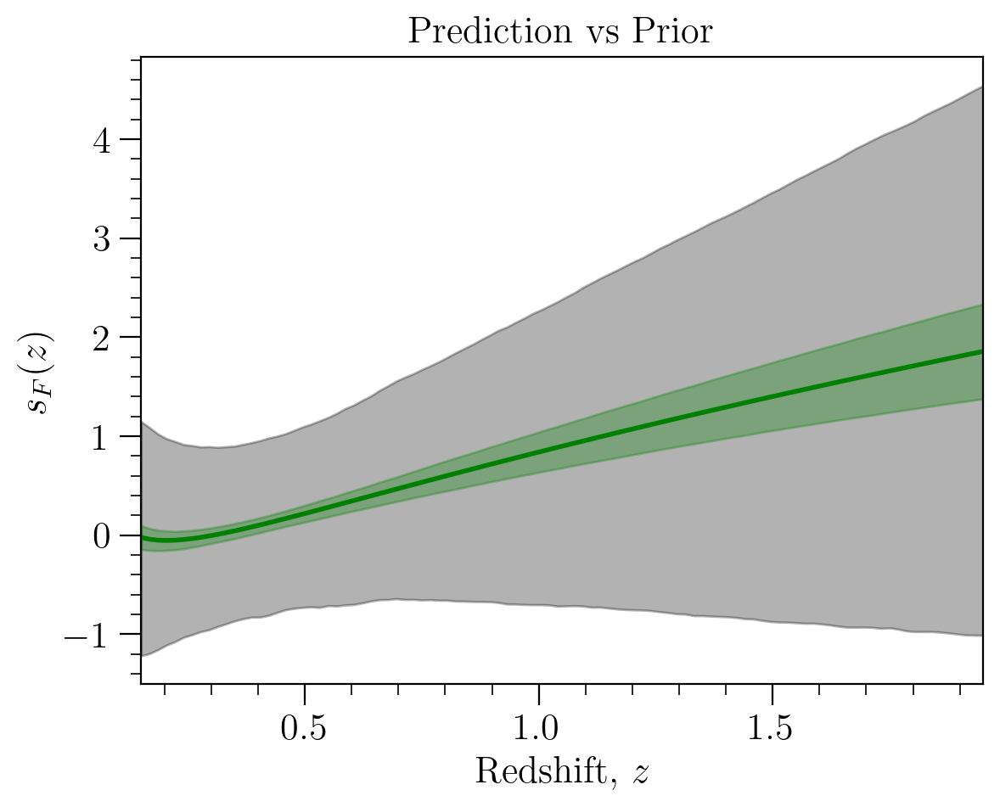

In [195]:
plt.plot(z_lin, sF_fid, '-', lw = 2.0, color='green')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sF_lower_bound_priors, sF_upper_bound_priors, color='black', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound_oct, sF_upper_bound_oct, color='green', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_F(z)$');
plt.title(r'Prediction vs Prior')

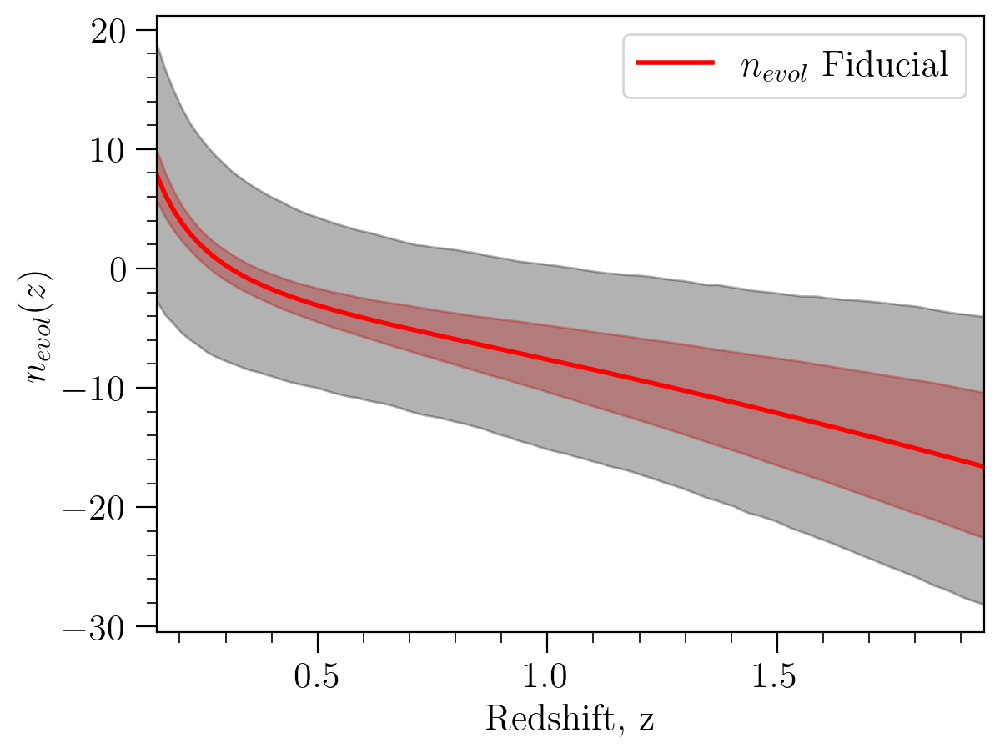

In [196]:
plt.plot(z_lin, num_evol_fid, '-', color='red', label=r'$n_{evol}$'+' Fiducial', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, nevol_lower_bound, nevol_upper_bound, color='red', alpha=0.3)
plt.fill_between(z_lin, nevol_lower_bound_priors_oct, nevol_upper_bound_priors_oct, color='black', alpha=0.3)


plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$n_{evol}(z)$')
plt.legend();

Text(0, 0.5, '$f^{evol}_B(z)$')

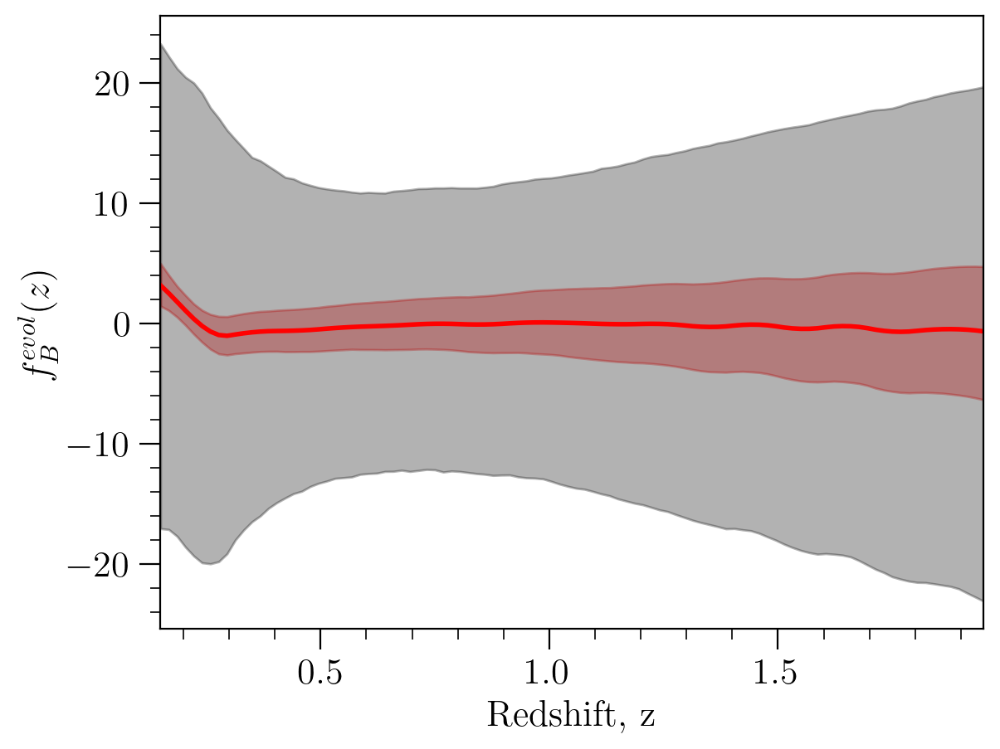

In [197]:
plt.plot(z_lin, fevol_B_fid, '-', color='red', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, fevol_B_lower_bound, fevol_B_upper_bound, color='red', alpha=0.3)
plt.fill_between(z_lin, fevol_B_lower_bound_priors_oct, fevol_B_upper_bound_priors_oct, color='black', alpha=0.3)


plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_B(z)$')

Text(0, 0.5, '$f^{evol}_F(z)$')

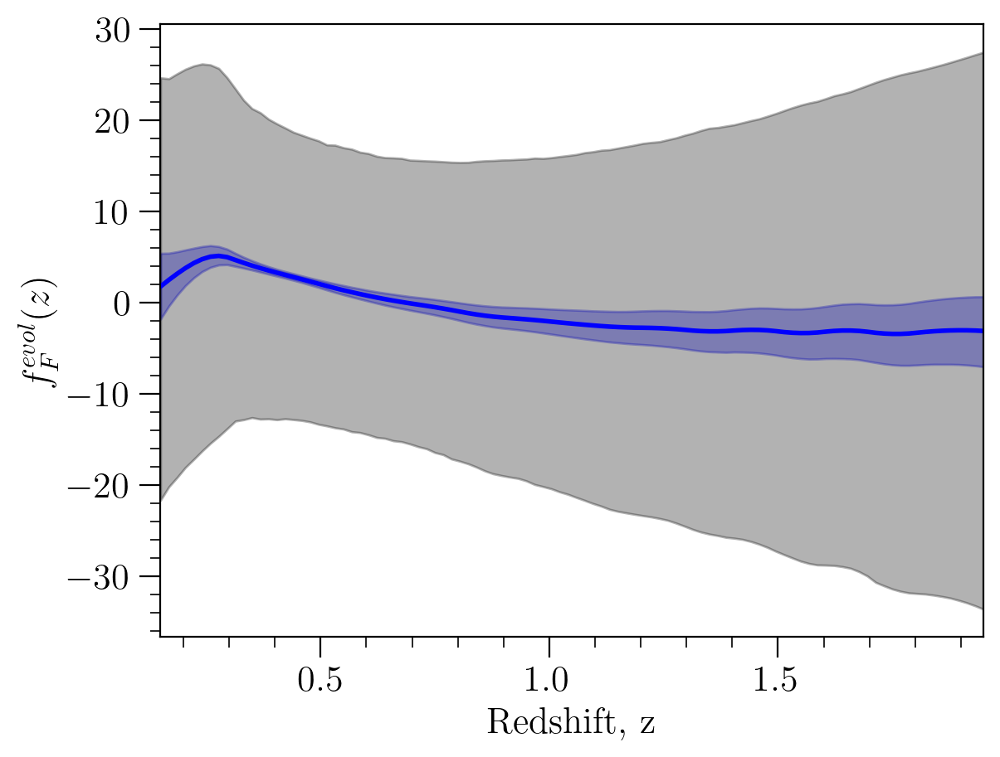

In [198]:
plt.plot(z_lin, fevol_F_fid, '-', color='blue', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, fevol_F_lower_bound, fevol_F_upper_bound, color='blue', alpha=0.3)
plt.fill_between(z_lin, fevol_F_lower_bound_priors_oct, fevol_F_upper_bound_priors_oct, color='black', alpha=0.3)

plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_F(z)$')

## Compare DIPOLE vs OCTUPOLE

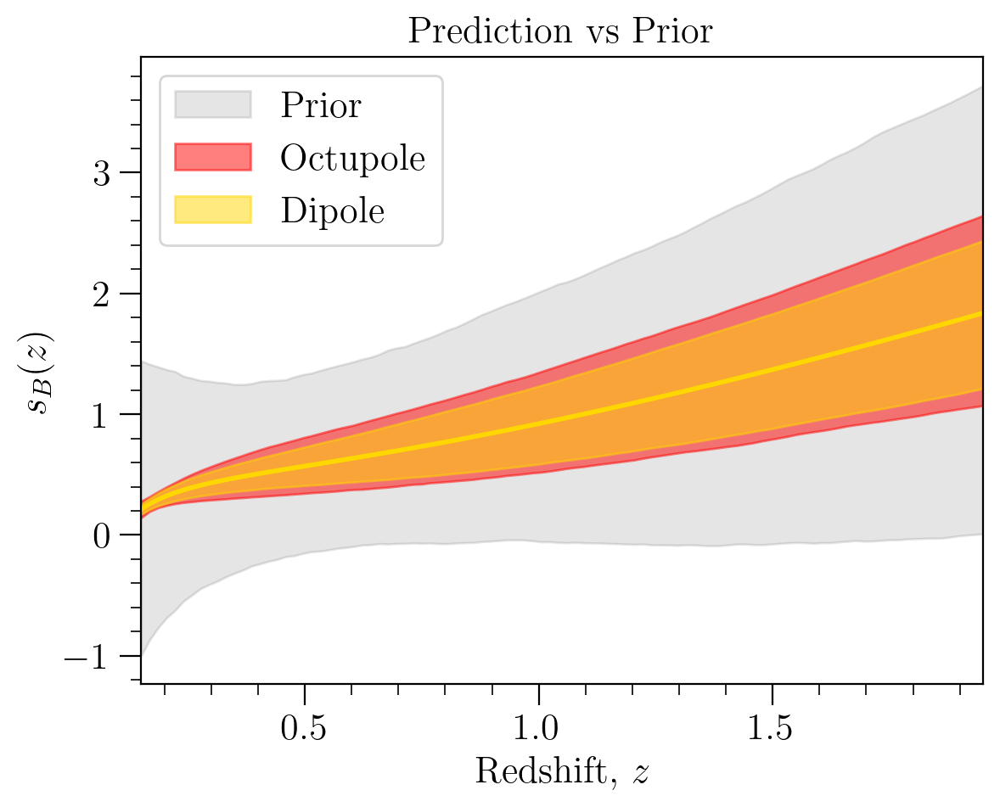

In [230]:
plt.plot(z_lin, sB_fid, '-', lw = 2.0, color='gold')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_priors, sB_upper_bound_priors, color='black', alpha=0.1, label = 'Prior')
plt.fill_between(z_lin, sB_lower_bound_oct, sB_upper_bound_oct, color='red', alpha=0.5, label = 'Octupole')
plt.fill_between(z_lin, sB_lower_bound_, sB_upper_bound_, color='gold', alpha=0.5, label = 'Dipole')


plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_B(z)$');
plt.title(r'Prediction vs Prior')
plt.legend(loc = 'upper left')

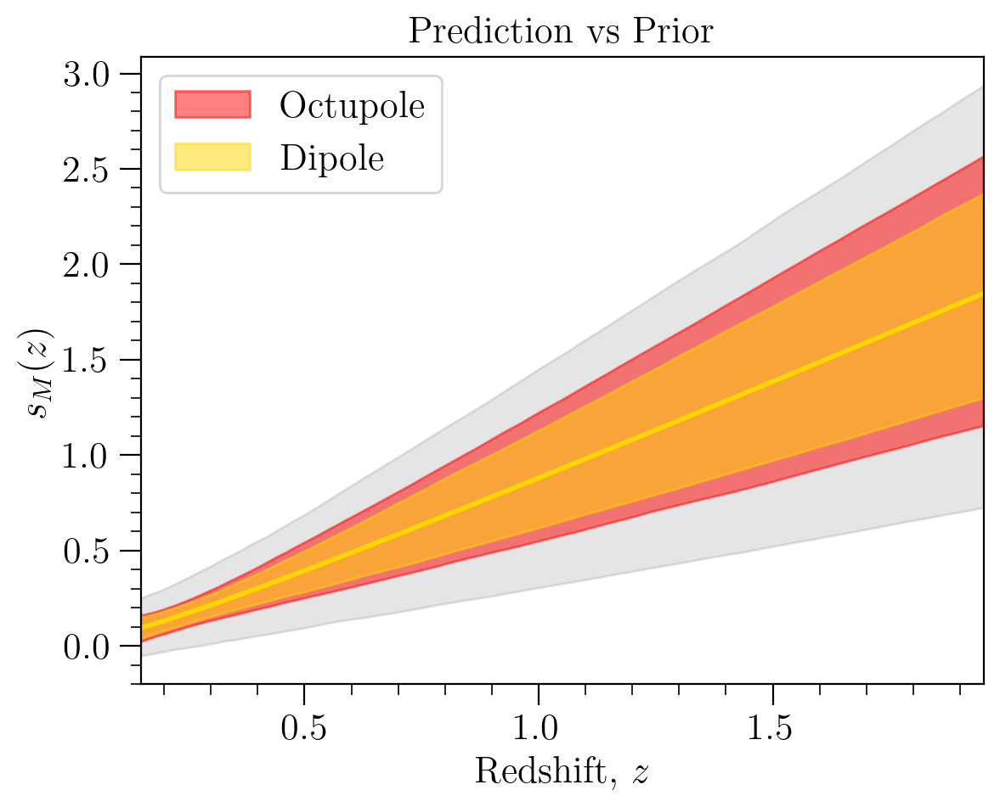

In [227]:
plt.plot(z_lin, sM_fid, '-', lw = 2.0, color='gold')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sM_lower_bound_priors, sM_upper_bound_priors, color='black', alpha=0.1)
plt.fill_between(z_lin, sM_lower_bound_oct, sM_upper_bound_oct, color='red', alpha=0.5, label = 'Octupole')
plt.fill_between(z_lin, sM_lower_bound_, sM_upper_bound_, color='gold', alpha=0.5, label = 'Dipole')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_M(z)$');
plt.title(r'Prediction vs Prior');
plt.legend(loc = 'upper left');

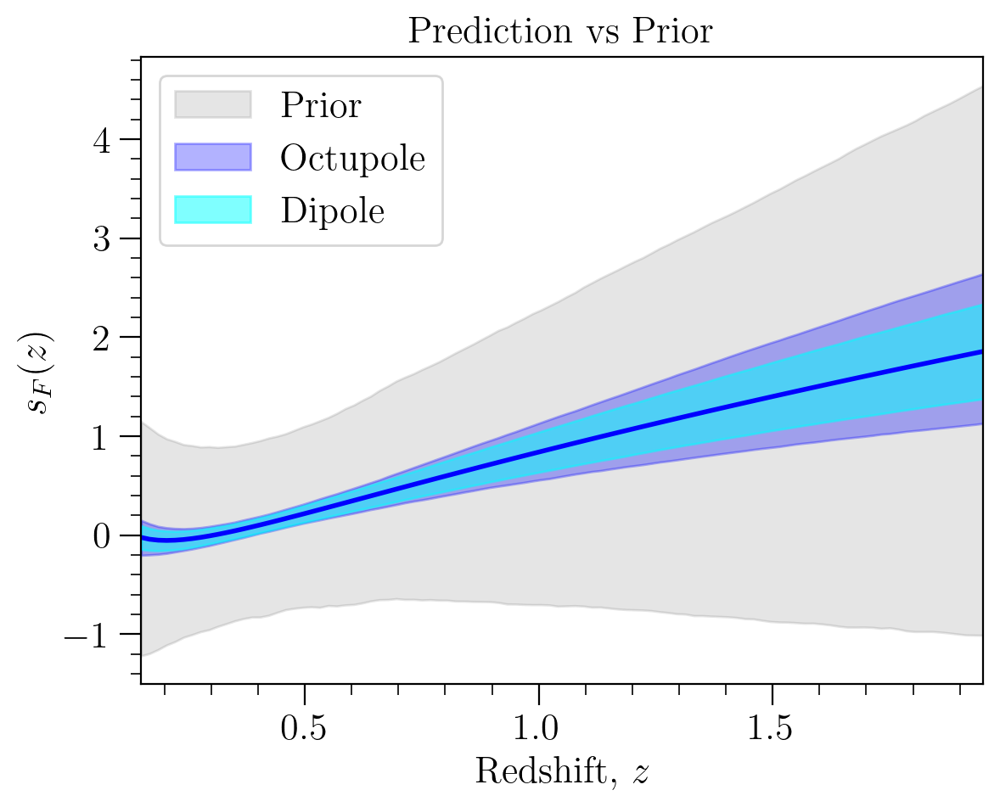

In [235]:
plt.plot(z_lin, sF_fid, '-', lw = 2.0, color='blue')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sF_lower_bound_priors, sF_upper_bound_priors, color='black', alpha=0.1, label = 'Prior')
plt.fill_between(z_lin, sF_lower_bound_oct, sF_upper_bound_oct, color='blue', alpha=0.3, label = 'Octupole')
plt.fill_between(z_lin, sF_lower_bound_, sF_upper_bound_, color='cyan', alpha=0.5, label = 'Dipole')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_F(z)$');
plt.title(r'Prediction vs Prior')
plt.legend(loc='upper left')

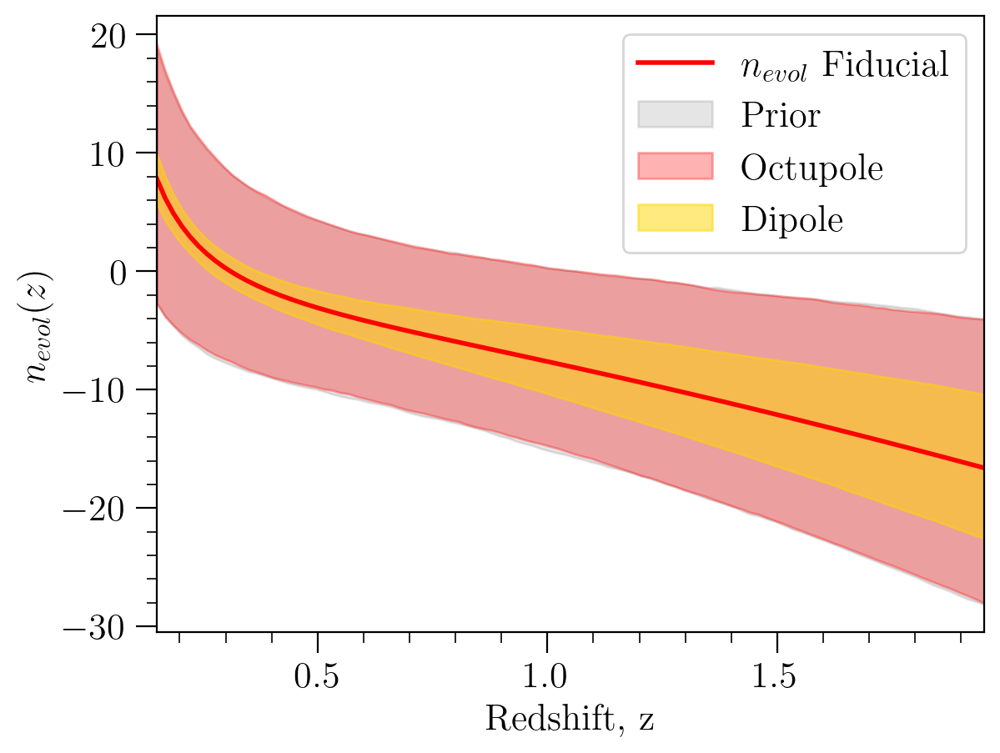

In [236]:
plt.plot(z_lin, num_evol_fid, '-', color='red', label=r'$n_{evol}$'+' Fiducial', lw = 2.0)

# Shade the 68% confidence interval
plt.fill_between(z_lin, nevol_lower_bound_priors_, nevol_upper_bound_priors_, color='black', alpha=0.1, label = 'Prior')
plt.fill_between(z_lin, nevol_lower_bound_oct, nevol_upper_bound_oct, color='red', alpha=0.3, label = 'Octupole')
plt.fill_between(z_lin, nevol_lower_bound_, nevol_upper_bound_, color='gold', alpha=0.5, label = 'Dipole')


plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$n_{evol}(z)$')
plt.legend();

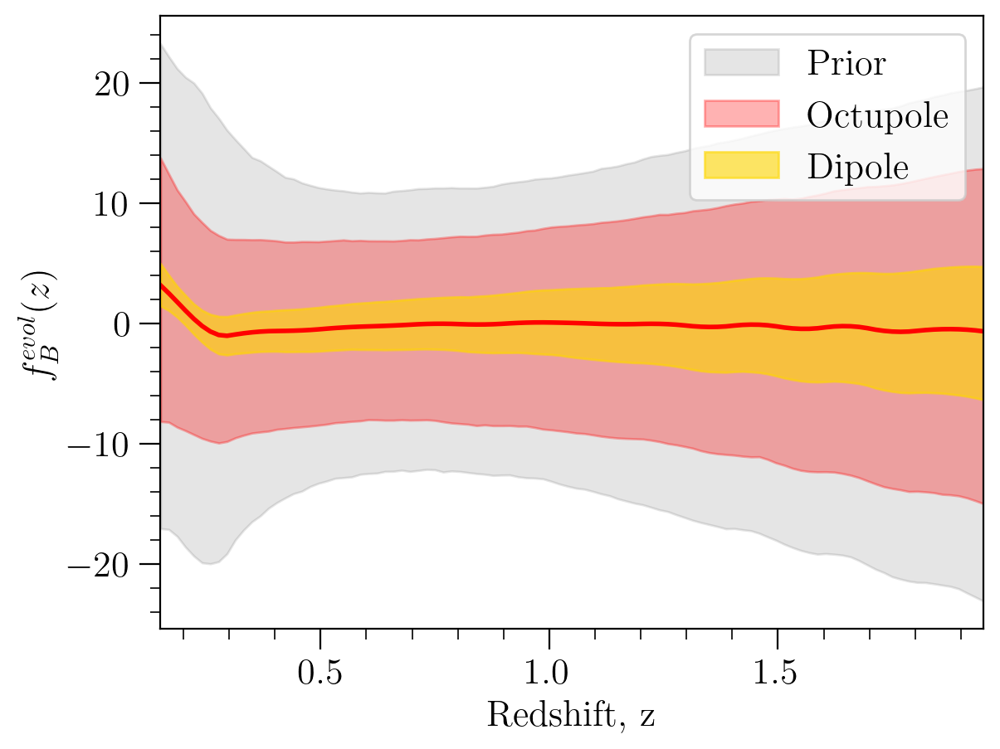

In [240]:
plt.plot(z_lin, fevol_B_fid, '-', color='red', lw = 2.0)

# Shade the 68% confidence interval
plt.fill_between(z_lin, fevol_B_lower_bound_priors, fevol_B_upper_bound_priors, color='black', alpha=0.1, label='Prior')
plt.fill_between(z_lin, fevol_B_lower_bound_oct, fevol_B_upper_bound_oct, color='red', alpha=0.3, label = 'Octupole')
plt.fill_between(z_lin, fevol_B_lower_bound_, fevol_B_upper_bound_, color='gold', alpha=0.6, label = 'Dipole')


plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_B(z)$')
plt.legend(loc = 'upper right')

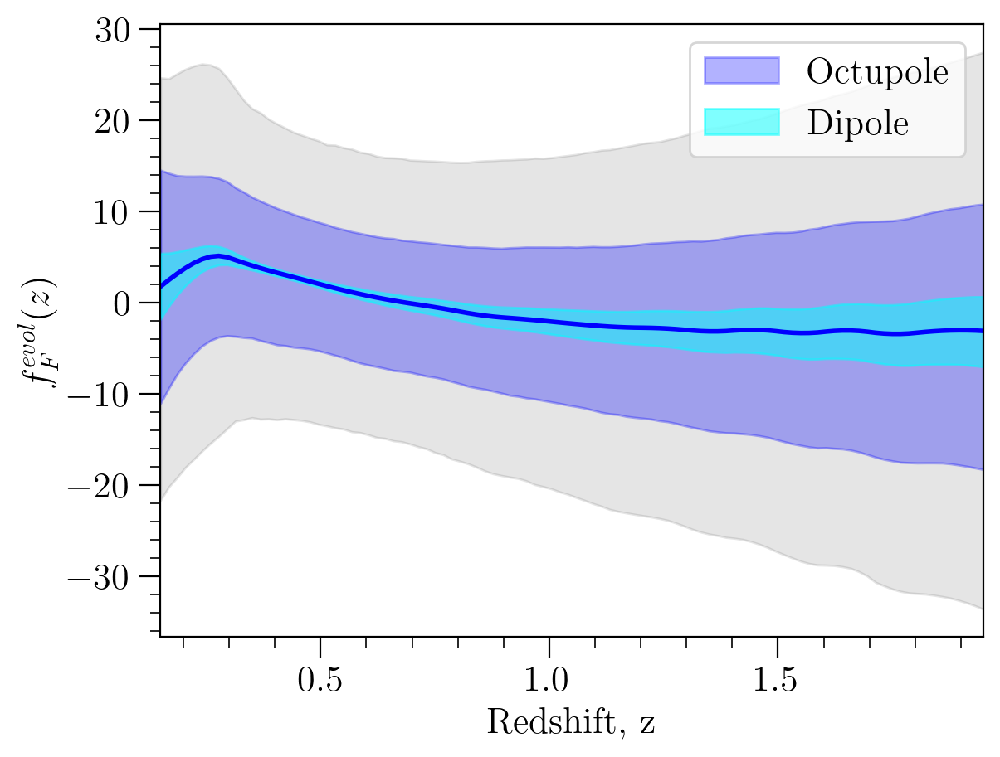

In [241]:
plt.plot(z_lin, fevol_F_fid, '-', color='blue', lw = 2.0)

# Shade the 68% confidence interval
plt.fill_between(z_lin, fevol_F_lower_bound_priors, fevol_F_upper_bound_priors, color='black', alpha=0.1)
plt.fill_between(z_lin, fevol_F_lower_bound_oct, fevol_F_upper_bound_oct, color='blue', alpha=0.3, label = 'Octupole')
plt.fill_between(z_lin, fevol_F_lower_bound_, fevol_F_upper_bound_, color='cyan', alpha=0.5, label = 'Dipole')

plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_F(z)$')
plt.legend();

In [245]:
Fisher_Matrix_dipole_19bins[:4,:4]

array([[ 19248.13486095,  10485.11149004, -16601.15712639,
         25461.3099326 ],
       [ 10485.11149004,   8142.67151989,  -4115.0181875 ,
          5232.42932013],
       [-16601.15712639,  -4115.0181875 ,  25465.1637881 ,
        -43629.55011557],
       [ 25461.3099326 ,   5232.42932013, -43629.55011557,
         79628.0122401 ]])

In [246]:
Fisher_Matrix_octupole_19bins[:4,:4]

array([[  549.66992702,   238.70697504,  -600.03931827,   972.99625633],
       [  238.70697504,   160.82824108,  -137.23795376,   180.41260006],
       [ -600.03931827,  -137.23795376,   976.85011184, -1726.86475941],
       [  972.99625633,   180.41260006, -1726.86475941,  3231.97436135]])

## Include the EVEN MULTIPOLES

### Include cross-variances (FULL ANALYSIS)

We include the EVEN MULTIPOLES in the previous analysis. We  include now the cross correlation between the octupole and the other multipoles (it only has non-zero cross-correlations with the dipole). In addition, we now allow galaxy biases and cosmic parameters to vary, which are constrained by the even multipoles. 

In [255]:
# Create the Cov Matrix for sB, sF, fevolB, fevolF

errB = [5e-1, 5e-1] 
errF = [5e-1, 5e-1]

sB_4fit = np.array([-0.90110744,  1.82300203, -1.01878439, -0.30342324])
sF_4fit = np.array([-0.19376095,  1.0747336,  -0.07806247, -0.00558005])
nevol_fid = np.array([7.94599875, -12.03752387,   2.29927261, -15.83887369])

num_fit = nevol_fid

dsB_19bins = sB_4fit * errB[0] 
dsF_19bins = sF_4fit * errF[0]
dnum_19bins = num_fit * errB[1]

Cov_all_19bins = np.diag(np.concatenate([dsB_19bins**2, dsF_19bins**2, dnum_19bins**2]))

Inv_Cov_all_19bins = np.linalg.inv(Cov_all_19bins)

Inv_Cov_prior_all = np.zeros([len(dsignal_dtheta_fit_all), len(dsignal_dtheta_fit_all)])
Inv_Cov_prior_all[:len(Inv_Cov_all_19bins), :len(Inv_Cov_all_19bins)] = Inv_Cov_all_19bins

np.shape(Cov_all_19bins)

(12, 12)

In [256]:
# Import full Covariance Matrix

Cov_multipoles_19bins = fm.cov_matrix_survey(d = dist[0], z_bins = z_bins, small_off_diagonal = True, split=[50,50], rtol=1e-4)

np.shape(Cov_multipoles_19bins)


 ... Loading Covariance Matrices [MONOBB, MONOBF, MONOFF, DIPBF, QUADBB, QUADBF, QUADFF, HEXAT, OCTBF] ... 

Population splitted in 50% BRIGHT - 50% FAINT 


 ... Success! ... 



(19, 324, 324)

In [257]:
np.shape(dsignal_dtheta_fit_all)

(21, 19, 324)

In [258]:
# Fisher Matrix

Inv_Cov_multipoles_19bins = np.array([np.linalg.inv(Cov_multipoles_19bins[k]) for k,_ in enumerate(z_bins)])

Fisher_Matrix_multipoles_19bins = fm.fisher_matrix(d_signal = dsignal_dtheta_fit_all, inv_cov = Inv_Cov_multipoles_19bins, z_bins = z_bins)
Fisher_Matrix_all_19bins = Fisher_Matrix_multipoles_19bins + Inv_Cov_prior_all

Sigma_Matrix_all_19bins = np.linalg.inv(Fisher_Matrix_all_19bins)

np.shape(Sigma_Matrix_all_19bins)


 ... Computing the Fisher Matrix ... 

Signal & Cov must be given as functions (z,d) and (z,d,d') respectively. 


 ... Success! ... 



(21, 21)

In [259]:
Fisher_Matrix_all_19bins[:4,:4]

array([[ 23239.95437926,  12082.29965205, -21424.55654162,
         33576.85256727],
       [ 12082.29965205,   9170.30292079,  -5135.93740556,
          6663.2688452 ],
       [-21424.55654162,  -5135.93740556,  33580.70642277,
        -58288.81235233],
       [ 33576.85256727,   6663.2688452 , -58288.81235233,
        106897.9595077 ]])

In [260]:
Fisher_Matrix_dipole_19bins[:4,:4]

array([[ 19248.13486095,  10485.11149004, -16601.15712639,
         25461.3099326 ],
       [ 10485.11149004,   8142.67151989,  -4115.0181875 ,
          5232.42932013],
       [-16601.15712639,  -4115.0181875 ,  25465.1637881 ,
        -43629.55011557],
       [ 25461.3099326 ,   5232.42932013, -43629.55011557,
         79628.0122401 ]])

In [261]:
Fisher_Matrix_octupole_19bins[:4,:4]

array([[  549.66992702,   238.70697504,  -600.03931827,   972.99625633],
       [  238.70697504,   160.82824108,  -137.23795376,   180.41260006],
       [ -600.03931827,  -137.23795376,   976.85011184, -1726.86475941],
       [  972.99625633,   180.41260006, -1726.86475941,  3231.97436135]])

#### Constraints

In [262]:
#Absolute Errors

Abs_Errors_all_19bins = np.sqrt(np.diag(Sigma_Matrix_all_19bins))

# Fiducial values

sbias_fid = np.concatenate([sB_4fit, sF_4fit])
num_fid = num_fit
gbias_fid = np.concatenate([np.array([0.554, 0.783]), np.array([0.554, 0.783])])
cosmic_fid = np.fromiter(params_dict0.values(), dtype=float)
cosmic_fid[1] = np.log(10**10 * cosmic_fid[1])

params_fid = np.concatenate([sbias_fid, num_fid, gbias_fid, cosmic_fid])

# Relative errors

Rel_Errors_all_19bins = np.abs(Abs_Errors_all_19bins/params_fid)

params_errors_all_19bins = Rel_Errors_all_19bins * 100

print()
print('------------ Relative errors * 100 ------------' )
print()
print('sbias = ', params_errors_all_19bins[0:len(sbias_fid)])
print()
print('number = ', params_errors_all_19bins[len(sbias_fid):(len(sbias_fid) + len(num_fid))])
print()
print('gbias = ', params_errors_all_19bins[(len(sbias_fid) + len(num_fid)):(len(sbias_fid) + len(num_fid) + len(gbias_fid))])
print()
print('cosmic = ', params_errors_all_19bins[(len(sbias_fid) + len(num_fid)+len(gbias_fid)):])


------------ Relative errors * 100 ------------

sbias =  [30.01764657 18.47280869 25.02675176 23.80647451 39.28697275 27.82862228
 45.07011706 49.94474645]

number =  [41.31183921 31.04109798 25.55481329 30.70779288]

gbias =  [0.42748007 0.36834475 0.14148394 0.27887022]

cosmic =  [1.10512408 0.7080217  0.8991259  1.13027314 0.49626418]


#### Comparing with and without EVEN MULTIPOLES

Compute the improvement in %

In [263]:
print('------------ Relative errors with octupole * 100 ------------' )
print()
print('sbias = ', params_errors_all_19bins[0:len(sbias_fid)])
print()
print('number = ', params_errors_all_19bins[len(sbias_fid):(len(sbias_fid) + len(num_fid))])

------------ Relative errors with octupole * 100 ------------

sbias =  [30.01764657 18.47280869 25.02675176 23.80647451 39.28697275 27.82862228
 45.07011706 49.94474645]

number =  [41.31183921 31.04109798 25.55481329 30.70779288]


In [264]:
print('------------ Relative errors without EVEN * 100 ------------' )
print()
print('sbias = ', params_errors_neven_19bins[0:len(sbias_fid)])
print()
print('number = ', params_errors_neven_19bins[len(sbias_fid):(len(sbias_fid) + len(num_fid))])

------------ Relative errors without EVEN * 100 ------------

sbias =  [30.01757285 18.47189149 25.02639974 23.8056846  39.28684934 27.8277582
 45.07008662 49.94474617]

number =  [41.31180572 31.04102095 25.55359634 30.70763683]


In [265]:
print('------------ Improvement * 100 ------------' )
print()
print('sbias = ', (1-params_errors_all_19bins[0:len(sbias_fid)]/params_errors_neven_19bins[0:len(sbias_fid)]) * 100)
print()
print('number = ', (1-params_errors_all_19bins[len(sbias_fid):(len(sbias_fid) + len(num_fid))]/params_errors_neven_19bins[len(sbias_fid):(len(sbias_fid) + len(num_fid))]) * 100)

------------ Improvement * 100 ------------

sbias =  [-2.45595922e-04 -4.96536159e-03 -1.40658476e-03 -3.31818883e-03
 -3.14127320e-04 -3.10510812e-03 -6.75346774e-05 -5.53952439e-07]

number =  [-8.10718390e-05 -2.48157292e-04 -4.76234670e-03 -5.08178517e-04]


In [268]:
import pandas as pd

row_names = {
    0: "sB_0",
    1: "sB_1",
    2: "sB_2",
    3: "sB_3",
    4: "sM_0",
    5: "sM_2",
    6: "sM_3",
    7: "sM_4"
}

constraints_s = {
    "ODD" : params_errors_neven_19bins[0:len(sbias_fid)],
    "ODD + EVEN" : params_errors_all_19bins[0:len(sbias_fid)],
    "Improvement" : (1-params_errors_all_19bins[0:len(sbias_fid)]/params_errors_neven_19bins[0:len(sbias_fid)]) * 100
}

df_s = pd.DataFrame(constraints_s, index=row_names.values())
df_s = df_s.apply(pd.Series.round, args=[2])

In [269]:
df_s

,ODD,ODD + EVEN,Improvement
sB_0,30.02,30.02,-0.0
sB_1,18.47,18.47,-0.0
sB_2,25.03,25.03,-0.0
sB_3,23.81,23.81,-0.0
sM_0,39.29,39.29,-0.0
sM_2,27.83,27.83,-0.0
sM_3,45.07,45.07,-0.0
sM_4,49.94,49.94,-0.0


In [270]:
latex_string = df_s.to_latex(index=True, float_format='%.2f')  # Remove index if desired
print(latex_string)

\begin{tabular}{lrrr}
\toprule
 & ODD & ODD + EVEN & Improvement \\
\midrule
sB_0 & 30.02 & 30.02 & -0.00 \\
sB_1 & 18.47 & 18.47 & -0.00 \\
sB_2 & 25.03 & 25.03 & -0.00 \\
sB_3 & 23.81 & 23.81 & -0.00 \\
sM_0 & 39.29 & 39.29 & -0.00 \\
sM_2 & 27.83 & 27.83 & -0.00 \\
sM_3 & 45.07 & 45.07 & -0.00 \\
sM_4 & 49.94 & 49.94 & -0.00 \\
\bottomrule
\end{tabular}



In [271]:
row_names = {
    0: "n_0",
    1: "n_1",
    2: "n_2",
    3: "n_3"
}

constraints_num = {
    "ODD" : params_errors_neven_19bins[len(sbias_fid):(len(sbias_fid) + len(num_fid))],
    "ODD+EVEN" : params_errors_all_19bins[len(sbias_fid):(len(sbias_fid) + len(num_fid))],
    "Improvement" : (1-params_errors_all_19bins[len(sbias_fid):(len(sbias_fid) + len(num_fid))]/params_errors_neven_19bins[len(sbias_fid):(len(sbias_fid) + len(num_fid))]) * 100
}

df_num = pd.DataFrame(constraints_num, index=row_names.values())
df_num = df_num.apply(pd.Series.round, args=[2])

In [272]:
df_num

,ODD,ODD+EVEN,Improvement
n_0,41.31,41.31,-0.0
n_1,31.04,31.04,-0.0
n_2,25.55,25.55,-0.0
n_3,30.71,30.71,-0.0


In [273]:
latex_string = df_num.to_latex(index=True, float_format='%.2f')  # Remove index if desired
print(latex_string)

\begin{tabular}{lrrr}
\toprule
 & ODD & ODD+EVEN & Improvement \\
\midrule
n_0 & 41.31 & 41.31 & -0.00 \\
n_1 & 31.04 & 31.04 & -0.00 \\
n_2 & 25.55 & 25.55 & -0.00 \\
n_3 & 30.71 & 30.71 & -0.00 \\
\bottomrule
\end{tabular}



#### Predictions

##### Magnification bias

In [276]:
# Magnification bias fit

def magbias_fit(params, x):
    a, b, c, d = params
    return  a + b * x + c * np.log(x) + d * (np.log(x))**2

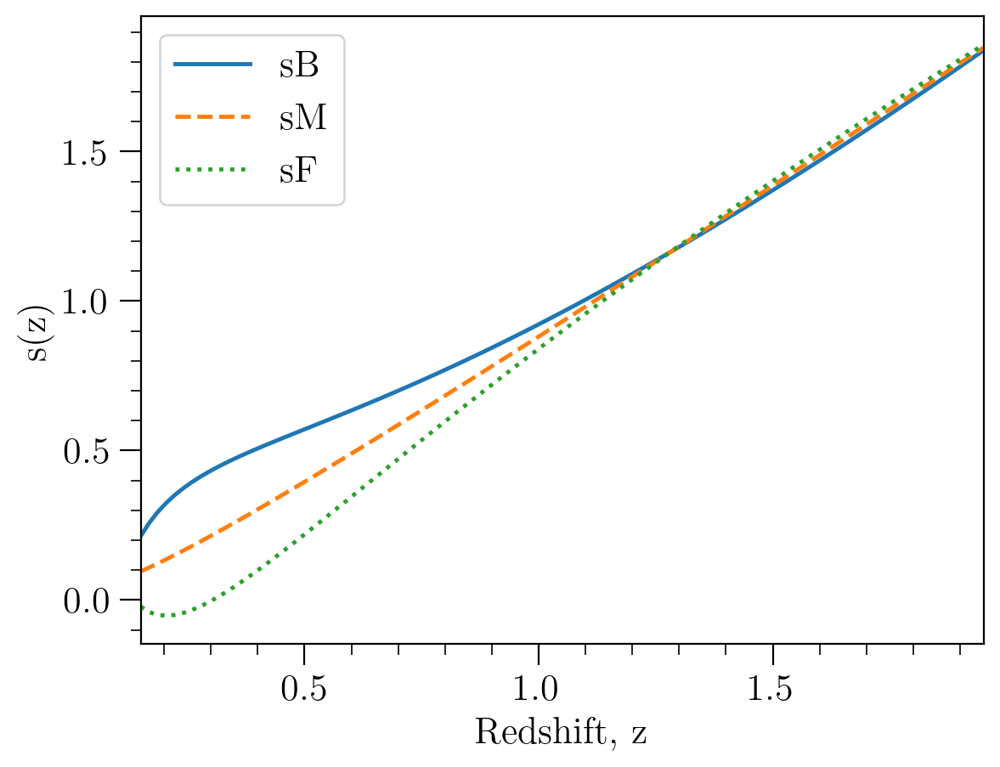

In [277]:
z_lin = np.linspace(z_bins[0], z_bins[-1], 100)
m_split = 2.

sB_fid = magbias_fit(sB_4fit, z_lin)
sM_fid = magbias_fit(sF_4fit, z_lin)
sF_fid = sM_fid * (m_split/(m_split-1)) - sB_fid/(m_split-1)

plt.plot(z_lin, sB_fid, '-', label=r'sB')
plt.plot(z_lin, sM_fid, '--', label=r'sM')
plt.plot(z_lin, sF_fid, ':', label=r'sF')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.legend();


###### Compare the two observables

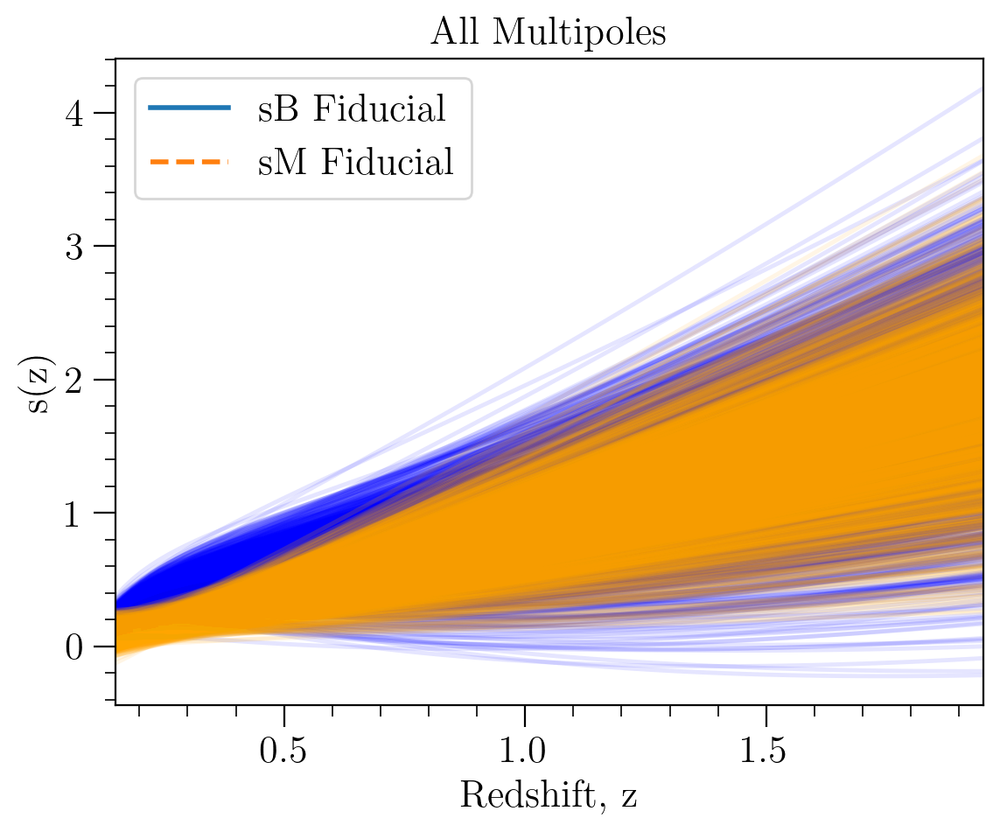

In [278]:
# Select the marginalized covariance matrix for the magnification biases

cov_sB_all = Sigma_Matrix_all_19bins[:4, :4]
cov_sM_all = Sigma_Matrix_all_19bins[4:8, 4:8]

# Generate parameter samples from multivariate normal distribution
num_samples = 2000
sB_pars_samples_all = np.random.multivariate_normal(sB_4fit, cov_sB_all, num_samples)
sM_pars_samples_all = np.random.multivariate_normal(sF_4fit, cov_sM_all, num_samples)

# Evaluate fitting function for each parameter sample
sB_samples_all = np.array([magbias_fit(pars, z_lin) for pars in sB_pars_samples_all])
sM_samples_all = np.array([magbias_fit(pars, z_lin) for pars in sM_pars_samples_all])

# Calculate the 68% confidence interval
sB_lower_bound_all = np.percentile(sB_samples_all, 16, axis=0)
sB_upper_bound_all = np.percentile(sB_samples_all, 84, axis=0)
sM_lower_bound_all = np.percentile(sM_samples_all, 16, axis=0)
sM_upper_bound_all= np.percentile(sM_samples_all, 84, axis=0)

# Step 5: Plotting

plt.plot(z_lin, sB_fid, '-', label=r'sB Fiducial', lw = 2.0)
plt.plot(z_lin, sM_fid, '--', label=r'sM Fiducial', lw = 2.0)

# Plot the fitting function for each sample
for sample in sB_samples_all:
    plt.plot(z_lin, sample, color='blue', alpha=0.1)

for sample in sM_samples_all:
    plt.plot(z_lin, sample, color='orange', alpha=0.1)
    
plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.title(r'All Multipoles')
plt.legend();

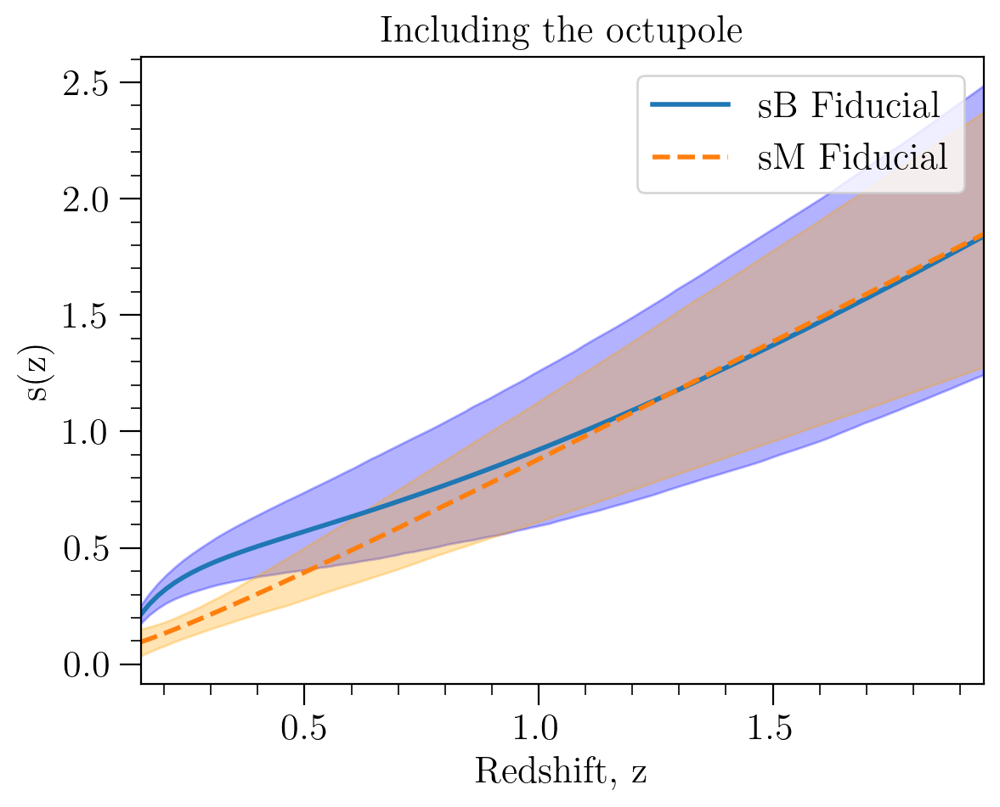

In [279]:
plt.plot(z_lin, sB_fid, '-', label=r'sB Fiducial', lw = 2.0)
plt.plot(z_lin, sM_fid, '--', label=r'sM Fiducial', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_all, sB_upper_bound_all, color='blue', alpha=0.3)
plt.fill_between(z_lin, sM_lower_bound_all, sM_upper_bound_all, color='orange', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.title('Including the octupole')
plt.legend();

###### Compare with priors

In [280]:
# Select the marginalized covariance matrix for the magnification biases priors

cov_sB_priors_all = Cov_all_19bins[:4, :4]
cov_sM_priors_all = Cov_all_19bins[4:8, 4:8]

# Generate parameter samples from multivariate normal distribution
num_samples = 2000
sB_pars_samples_priors_all = np.random.multivariate_normal(sB_4fit, cov_sB_priors_all, num_samples)
sM_pars_samples_priors_all = np.random.multivariate_normal(sF_4fit, cov_sM_priors_all, num_samples)

# Evaluate fitting function for each parameter sample
sB_samples_priors_all = np.array([magbias_fit(pars, z_lin) for pars in sB_pars_samples_priors_all])
sM_samples_priors_all = np.array([magbias_fit(pars, z_lin) for pars in sM_pars_samples_priors_all])

# Calculate the 68% confidence interval
sB_lower_bound_priors_all = np.percentile(sB_samples_priors_all, 16, axis=0)
sB_upper_bound_priors_all = np.percentile(sB_samples_priors_all, 84, axis=0)
sM_lower_bound_priors_all = np.percentile(sM_samples_priors_all, 16, axis=0)
sM_upper_bound_priors_all = np.percentile(sM_samples_priors_all, 84, axis=0)

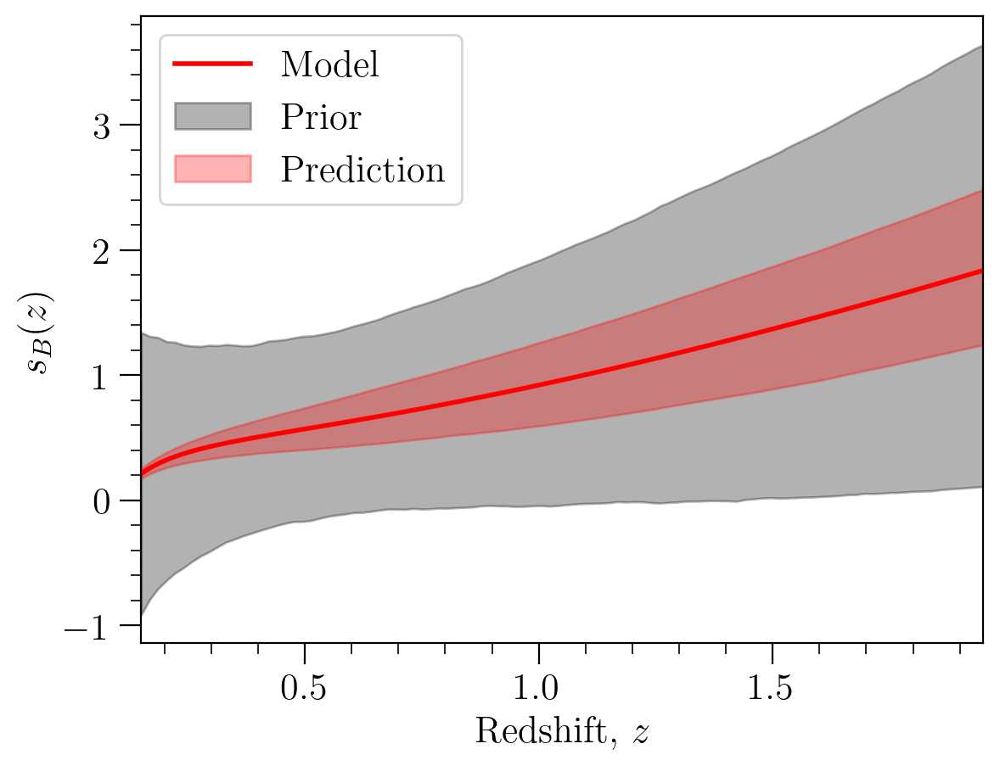

In [281]:
plt.plot(z_lin, sB_fid, '-', lw = 2.0, color='red', label='Model')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_priors_all, sB_upper_bound_priors_all, color='black', alpha=0.3, label='Prior')
plt.fill_between(z_lin, sB_lower_bound_all, sB_upper_bound_all, color='red', alpha=0.3, label='Prediction')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_B(z)$');
plt.legend(loc='upper left');
#plt.title(r'Prediction vs Prior (with octupole)')

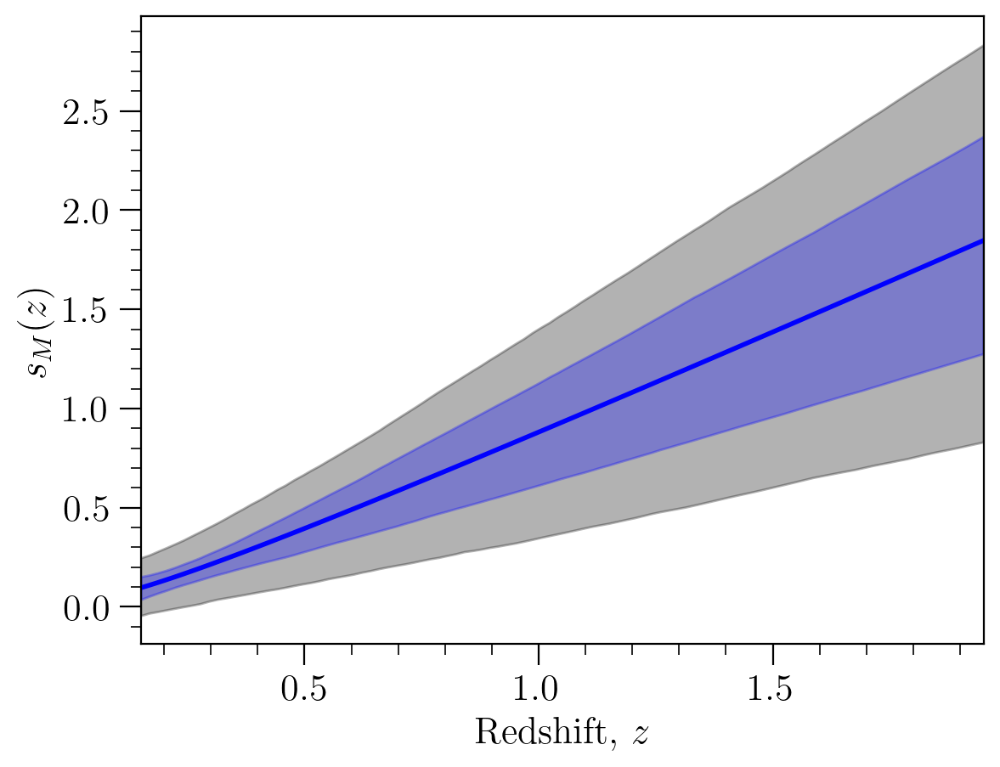

In [283]:
plt.plot(z_lin, sM_fid, '-', lw = 2.0, color='blue', label='Model')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sM_lower_bound_priors_all, sM_upper_bound_priors_all, color='black', alpha=0.3, label='Prior')
plt.fill_between(z_lin, sM_lower_bound_all, sM_upper_bound_all, color='blue', alpha=0.3, label='Prediction')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_M(z)$');
#plt.title(r'Prediction vs Prior (with octupole)')

###### Compare with no-DIPOLE

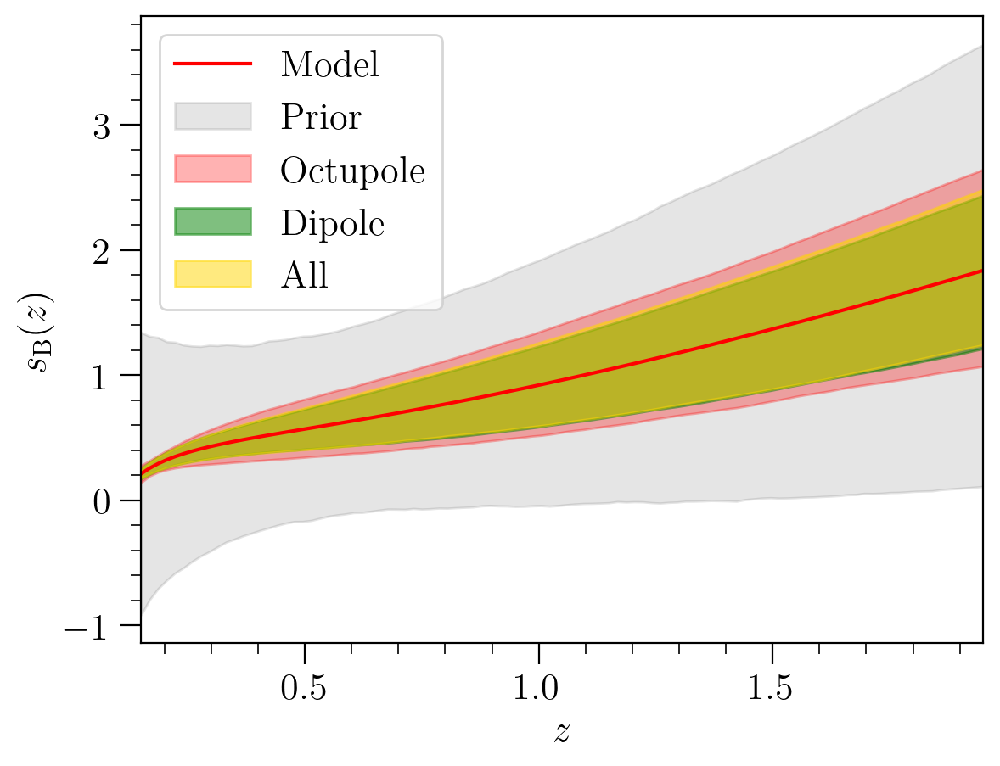

In [287]:
plt.plot(z_lin, sB_fid, '-', lw = 1.5, color='red', label=r'Model')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_priors_all, sB_upper_bound_priors_all, color='black', alpha=0.1, label=r'Prior')
plt.fill_between(z_lin, sB_lower_bound_oct, sB_upper_bound_oct, color='red', alpha=0.3, label=r'Octupole')
plt.fill_between(z_lin, sB_lower_bound_, sB_upper_bound_, color='green', alpha=0.5, label=r'Dipole')
plt.fill_between(z_lin, sB_lower_bound_all, sB_upper_bound_all, color='gold', alpha=0.5, label=r'All')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'$z$');
plt.ylabel(r'$s_\mathrm{B}(z)$');
#plt.title(r'With and without octupole');
plt.legend(loc='upper left');

#plt.savefig("plots/sB_prediction_50x50_full_vs_neven_vs_prior50.pdf", bbox_inches='tight', format='pdf')

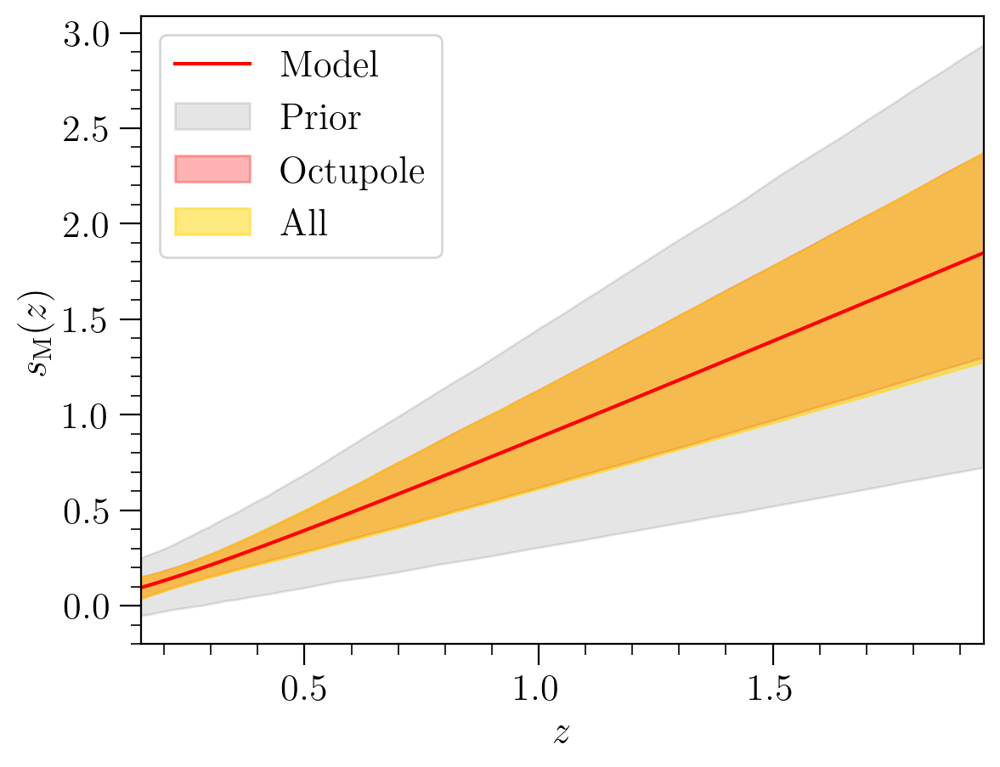

In [288]:
plt.plot(z_lin, sM_fid, '-', lw = 1.5, color='red', label='Model')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sM_lower_bound_priors, sM_upper_bound_priors, color='black', alpha=0.1, label='Prior')
plt.fill_between(z_lin, sM_lower_bound_oct, sM_upper_bound_oct, color='red', alpha=0.3, label='Octupole')
plt.fill_between(z_lin, sM_lower_bound_all, sM_upper_bound_all, color='gold', alpha=0.5, label='All')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'$z$');
plt.ylabel(r'$s_\mathrm{M}(z)$');
#plt.title(r'With and without octupole');
plt.legend(loc='upper left')

#plt.savefig("plots/sM_prediction_50x50_full_vs_neven_vs_prior50.pdf", bbox_inches='tight', format='pdf')

###### Magnification bias of the Faint

The magnification bias of the faint population is obtained by:

$$ s_F(z) = s_{model}(z)\frac{\bar{N}(z)}{\bar{N}_F(z)} - s_B(z)\frac{\bar{N}_B(z)}{\bar{N}_F(z)} = s_F(z) = s_{model}(z)\frac{m}{m-1} - s_B(z)\frac{1}{m-1} $$ 

We need to sample together the $s_B$ and $s_m$ parameters.

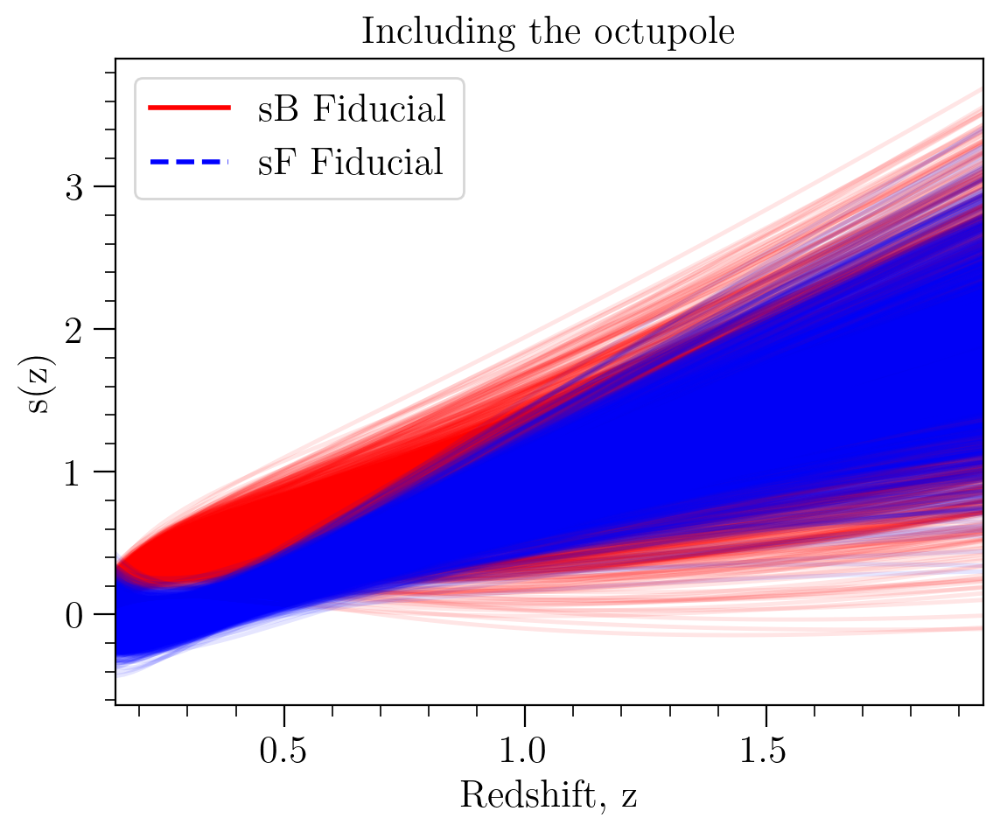

In [289]:
# Select the marginalized covariance matrix for the magnification biases together
cov_sbias_all = Sigma_Matrix_all_19bins[:8, :8]

# Generate parameter samples from multivariate normal distribution
num_samples = 2000
sbias_pars_samples_all = np.random.multivariate_normal(sbias_fid, cov_sbias_all, num_samples)

# Evaluate fitting function for each parameter sample
sB_samples_all = np.array([magbias_fit(pars[:4], z_lin) for pars in sbias_pars_samples_all])
sM_samples_all = np.array([magbias_fit(pars[4:8], z_lin) for pars in sbias_pars_samples_all])

# Compute the sF for each sample
sF_samples_all = sM_samples_all*m_split/(m_split-1) - sB_samples_all/(m_split-1)

# Calculate the 68% confidence interval
sF_lower_bound_all = np.percentile(sF_samples_all, 16, axis=0)
sF_upper_bound_all = np.percentile(sF_samples_all, 84, axis=0)

# Step 5: Plotting

plt.plot(z_lin, sB_fid, '-', label=r'sB Fiducial', lw = 2.0, color='red')
plt.plot(z_lin, sF_fid, '--', label=r'sF Fiducial', lw = 2.0, color='blue')

# Plot the fitting function for each sample
for sample in sB_samples_all:
    plt.plot(z_lin, sample, color='red', alpha=0.1)

for sample in sF_samples_all:
    plt.plot(z_lin, sample, color='blue', alpha=0.1)
    
plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.title('Including the octupole')
plt.legend();

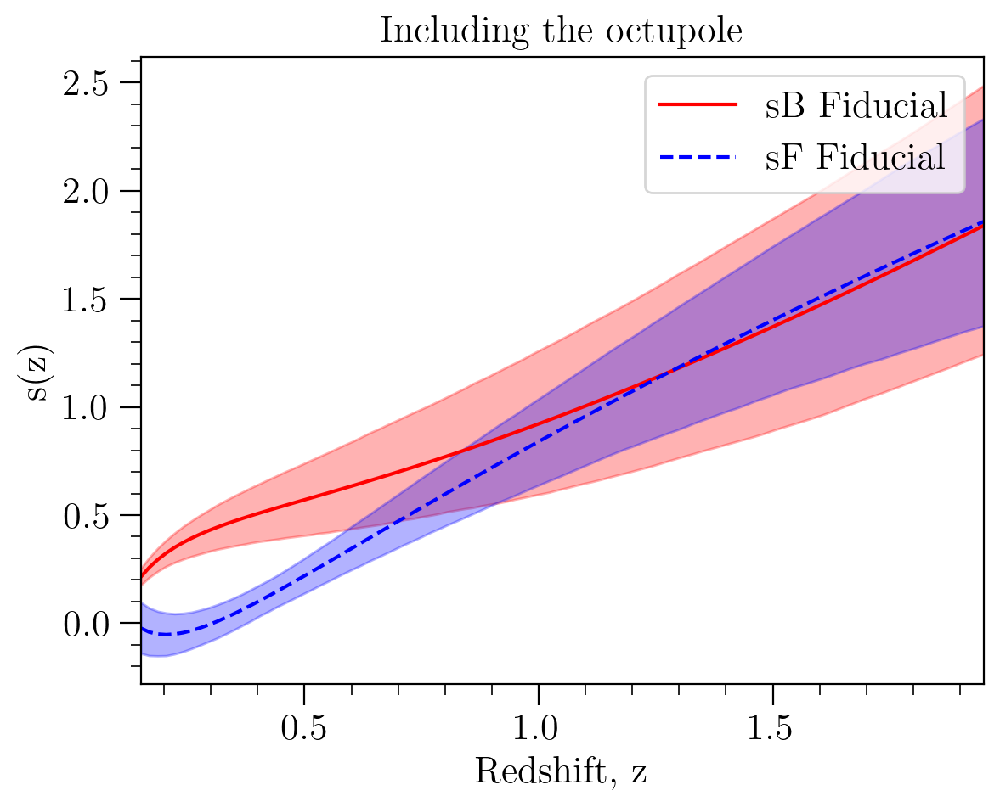

In [290]:
plt.plot(z_lin, sB_fid, '-', label=r'sB Fiducial', lw = 1.5, color='red')
plt.plot(z_lin, sF_fid, '--', label=r'sF Fiducial', lw = 1.5, color='blue')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_all, sB_upper_bound_all, color='red', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound_all, sF_upper_bound_all, color='blue', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.title('Including the octupole')
plt.legend();

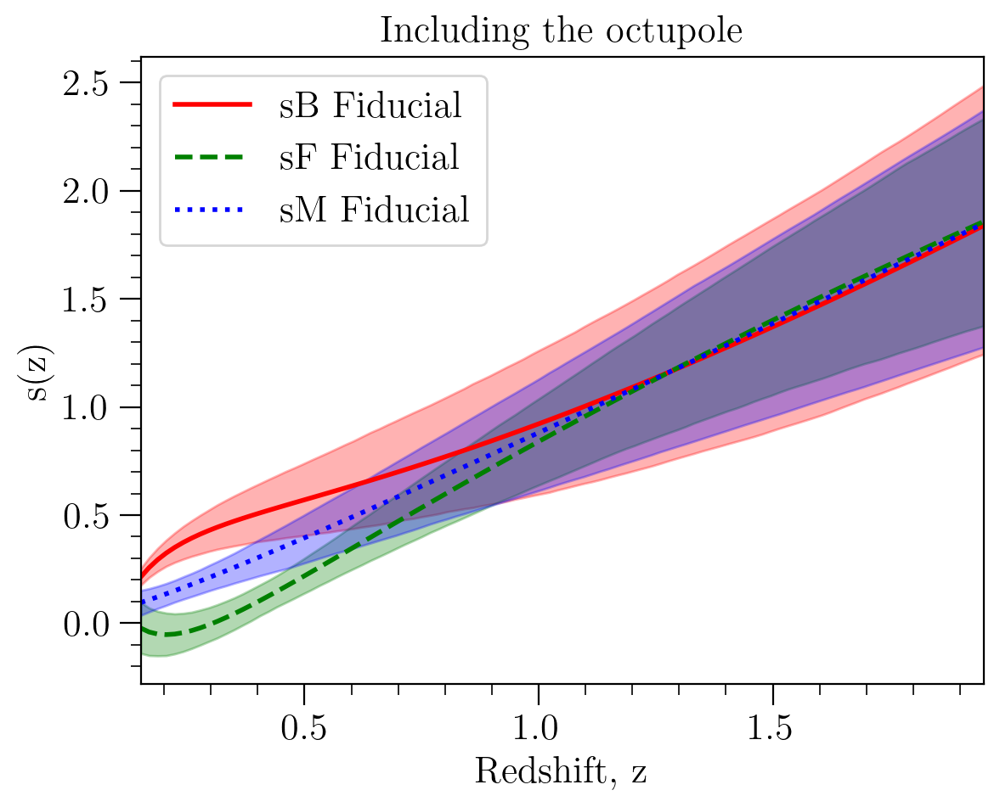

In [291]:
plt.plot(z_lin, sB_fid, '-', label=r'sB Fiducial', lw = 2.0, color='red')
plt.plot(z_lin, sF_fid, '--', label=r'sF Fiducial', lw = 2.0, color='green')
plt.plot(z_lin, sM_fid, ':', label=r'sM Fiducial', lw = 2.0, color='blue')


# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_all, sB_upper_bound_all, color='red', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound_all, sF_upper_bound_all, color='green', alpha=0.3)
plt.fill_between(z_lin, sM_lower_bound_all, sM_upper_bound_all, color='blue', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.title('Including the octupole')
plt.legend();

Compare with priors

In [292]:
# Select the marginalized covariance matrix for the magnification biases together
cov_sbias_priors = Cov_all_19bins[:8, :8]

# Generate parameter samples from multivariate normal distribution
num_samples = 2000
sbias_pars_samples_priors_all = np.random.multivariate_normal(sbias_fid, cov_sbias_priors, num_samples)

# Evaluate fitting function for each parameter sample
sB_samples_priors_all = np.array([magbias_fit(pars[:4], z_lin) for pars in sbias_pars_samples_priors_all])
sM_samples_priors_all = np.array([magbias_fit(pars[4:8], z_lin) for pars in sbias_pars_samples_priors_all])

# Compute the sF for each sample
sF_samples_priors_all = sM_samples_priors_all*m_split/(m_split-1) - sB_samples_priors_all/(m_split-1)

# Calculate the 68% confidence interval
sF_lower_bound_priors_all = np.percentile(sF_samples_priors_all, 16, axis=0)
sF_upper_bound_priors_all = np.percentile(sF_samples_priors_all, 84, axis=0)

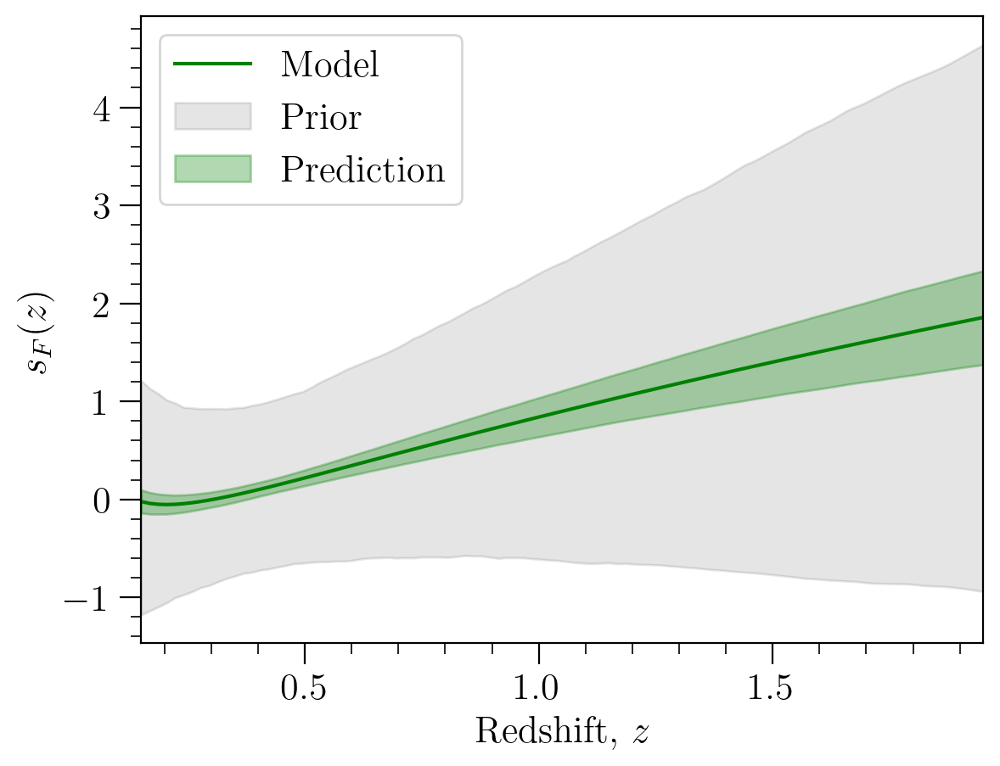

In [293]:
plt.plot(z_lin, sF_fid, '-', lw = 1.5, color='green', label='Model')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sF_lower_bound_priors_all, sF_upper_bound_priors_all, color='black', alpha=0.1, label='Prior')
plt.fill_between(z_lin, sF_lower_bound_all, sF_upper_bound_all, color='green', alpha=0.3, label='Prediction')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s_F(z)$');
#plt.title(r'Prediction vs Prior (with octupole)')
plt.legend(loc='upper left')

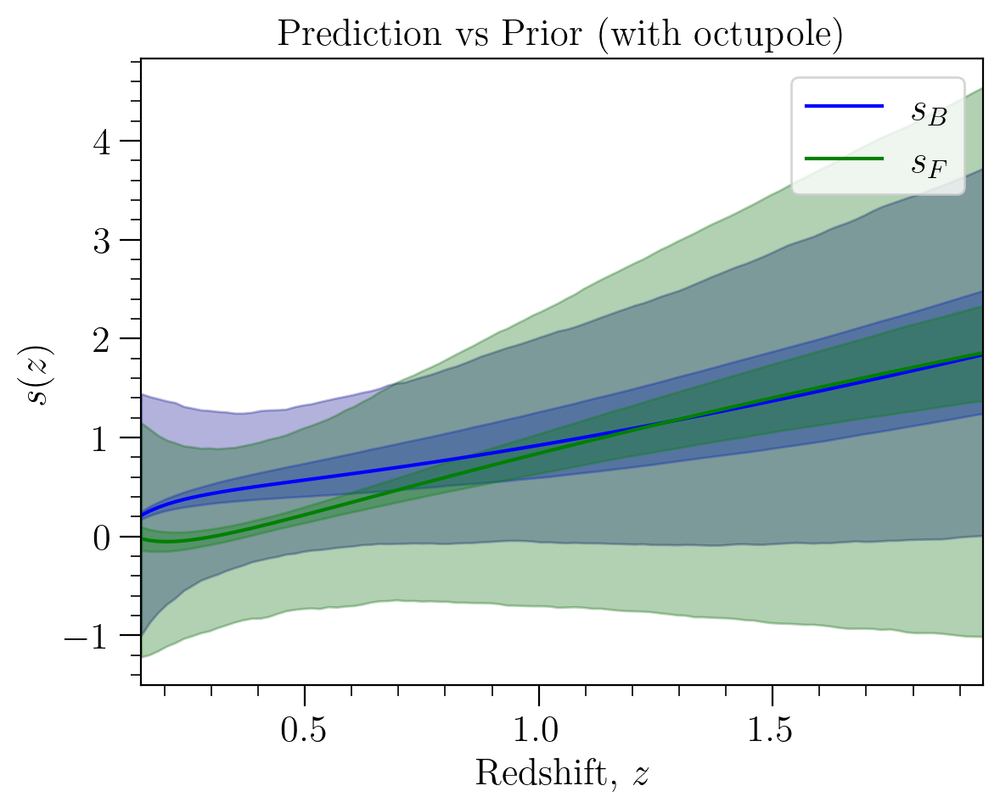

In [294]:
plt.plot(z_lin, sB_fid, '-', lw = 1.5, color='blue', label=r'$s_B$')
plt.plot(z_lin, sF_fid, '-', lw = 1.5, color='green', label=r'$s_F$')


# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_priors, sB_upper_bound_priors, color='darkblue', alpha=0.3)
plt.fill_between(z_lin, sB_lower_bound_all, sB_upper_bound_all, color='blue', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound_priors, sF_upper_bound_priors, color='darkgreen', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound_all, sF_upper_bound_all, color='green', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, $z$');
plt.ylabel(r'$s(z)$');
plt.title(r'Prediction vs Prior (with octupole)');
plt.legend();

Compare with no octupole

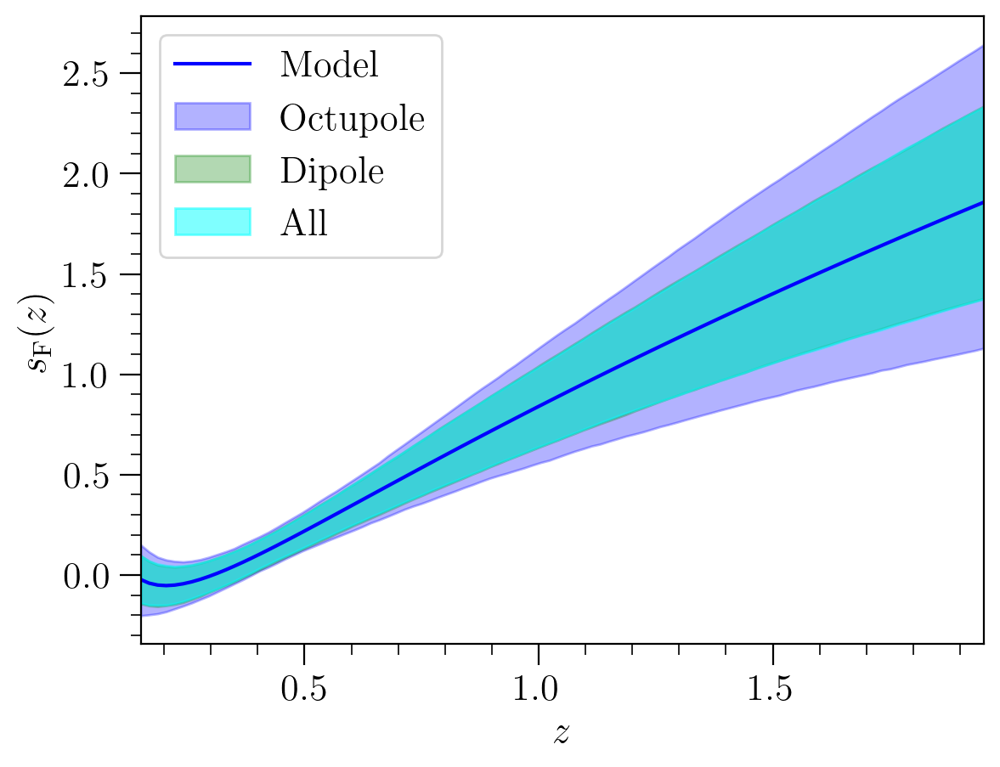

In [299]:
plt.plot(z_lin, sF_fid, '-', lw = 1.5, color='blue', label='Model')

# Shade the 68% confidence interval

#plt.fill_between(z_lin, sF_lower_bound_priors, sF_upper_bound_priors, color='black', alpha=0.1, label='Prior')
plt.fill_between(z_lin, sF_lower_bound_oct, sF_upper_bound_oct, color='blue', alpha=0.3, label='Octupole')
plt.fill_between(z_lin, sF_lower_bound_, sF_upper_bound_, color='green', alpha=0.3, label='Dipole')
plt.fill_between(z_lin, sF_lower_bound_all, sF_upper_bound_all, color='cyan', alpha=0.5, label='All')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'$z$');
plt.ylabel(r'$s_\mathrm{F}(z)$');
#plt.title(r'With and without octupole');
plt.legend(loc='upper left');

#plt.savefig("plots/sF_prediction_50x50_full_vs_neven_vs_prior50.pdf", bbox_inches='tight', format='pdf')

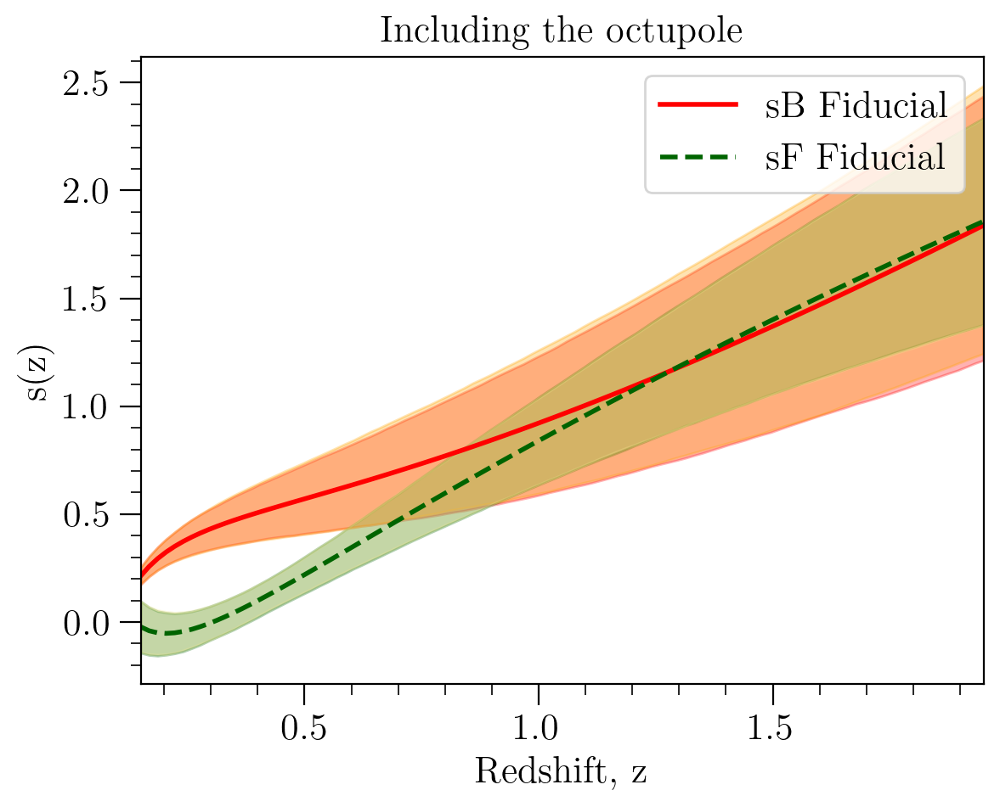

In [300]:
plt.plot(z_lin, sB_fid, '-', label=r'sB Fiducial', lw = 2.0, color='red')
plt.plot(z_lin, sF_fid, '--', label=r'sF Fiducial', lw = 2.0, color='darkgreen')

# Shade the 68% confidence interval
plt.fill_between(z_lin, sB_lower_bound, sB_upper_bound, color='red', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound, sF_upper_bound, color='darkgreen', alpha=0.3)
plt.fill_between(z_lin, sB_lower_bound_all, sB_upper_bound_all, color='orange', alpha=0.3)
plt.fill_between(z_lin, sF_lower_bound_all, sF_upper_bound_all, color='khaki', alpha=0.3)

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r's(z)')
plt.title('Including the octupole')
plt.legend();

##### Number evolution

In [301]:
def nevol_fit(params, x):
    a, b, c, d = params
    return a + b * x + c * (1/x) + d * np.exp(-x)

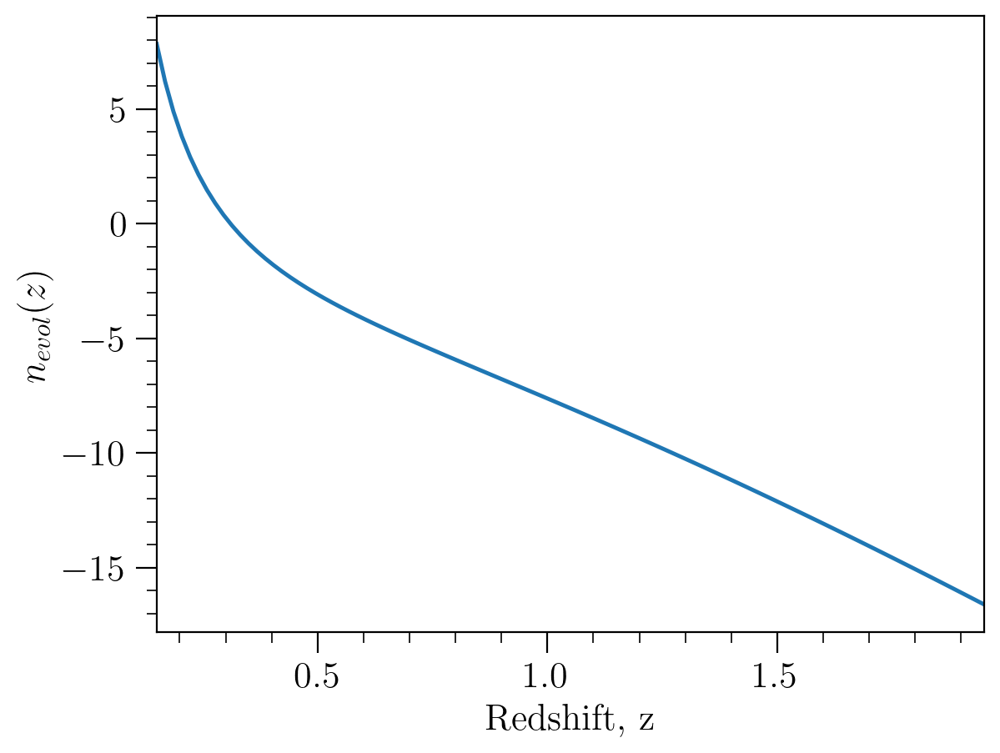

In [302]:
z_lin = np.linspace(z_bins[0], z_bins[-1], 100)
m_split = 2.

num_evol_fid = nevol_fit(nevol_fid, z_lin)

plt.plot(z_lin, num_evol_fid, '-')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z');
plt.ylabel(r'$n_{evol}(z)$');

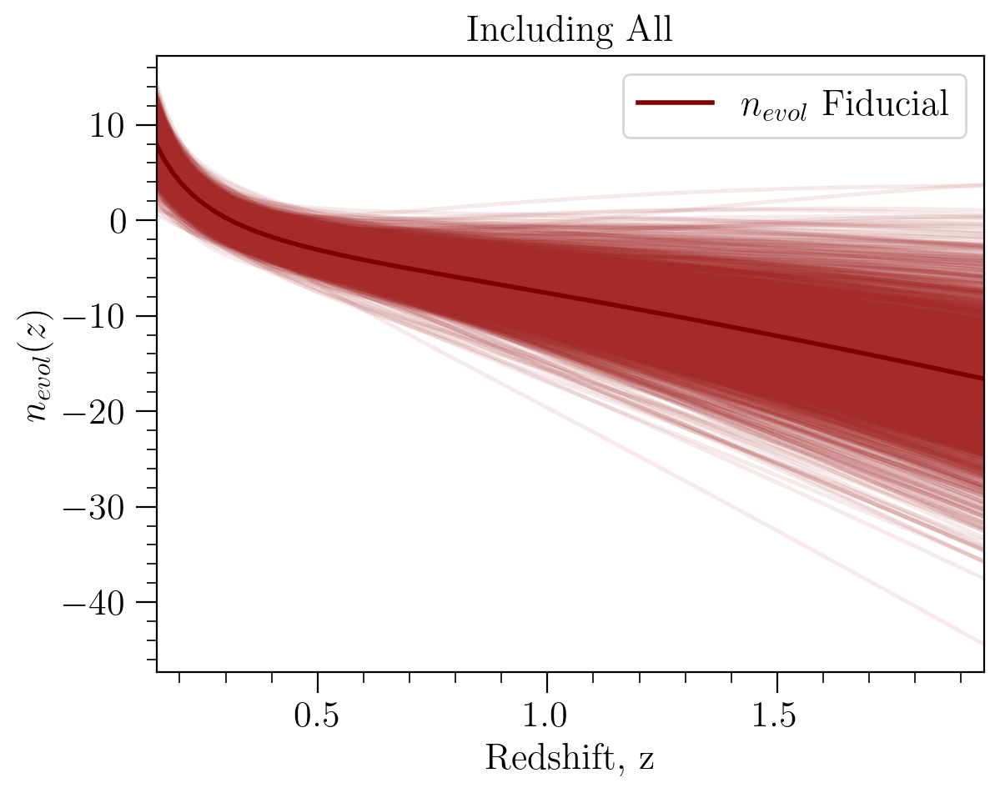

In [303]:
# Select the marginalized covariance matrix for the number evolution
cov_numevol_all = Sigma_Matrix_all_19bins[8:12, 8:12]
cov_numevol_priors_all = Cov_all_19bins[8:12, 8:12]


# Generate parameter samples from multivariate normal distribution
num_samples = 2000
nevol_pars_samples_all = np.random.multivariate_normal(nevol_fid, cov_numevol_all, num_samples)
nevol_samples_priors_all = np.random.multivariate_normal(nevol_fid, cov_numevol_priors_all, num_samples)


# Evaluate fitting function for each parameter sample
nevol_samples_all = np.array([nevol_fit(pars, z_lin) for pars in nevol_pars_samples_all])
nevol_samples_priors_all = np.array([nevol_fit(pars, z_lin) for pars in nevol_samples_priors_all])

# Calculate the 68% confidence interval
nevol_lower_bound_all = np.percentile(nevol_samples_all, 16, axis=0)
nevol_upper_bound_all = np.percentile(nevol_samples_all, 84, axis=0)
nevol_lower_bound_priors_all = np.percentile(nevol_samples_priors_all, 16, axis=0)
nevol_upper_bound_priors_all = np.percentile(nevol_samples_priors_all, 84, axis=0)

# Step 5: Plotting

# Plot the fitting function for each sample
for sample in nevol_samples_all:
    plt.plot(z_lin, sample, color='brown', alpha=0.1)
    
plt.plot(z_lin, num_evol_fid, '-', color='maroon', label=r'$n_{evol}$'+' Fiducial', lw = 2.0)

plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$n_{evol}(z)$')
plt.title('Including All')
plt.legend();

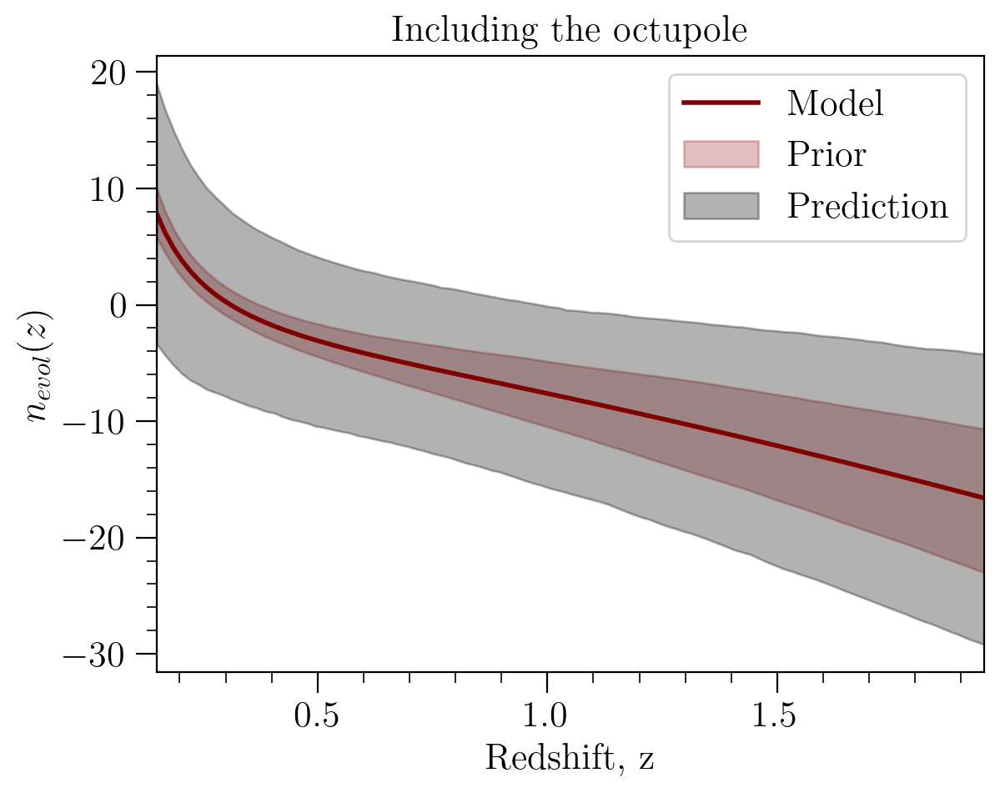

In [304]:
plt.plot(z_lin, num_evol_fid, '-', color='maroon', label=r'Model', lw = 2.0)

# Shade the 68% confidence interval

plt.fill_between(z_lin, nevol_lower_bound_all, nevol_upper_bound_all, color='brown', alpha=0.3, label=r'Prior')
plt.fill_between(z_lin, nevol_lower_bound_priors_all, nevol_upper_bound_priors_all, color='black', alpha=0.3, label=r'Prediction')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$n_{evol}(z)$')
plt.title('Including the octupole')
plt.legend();

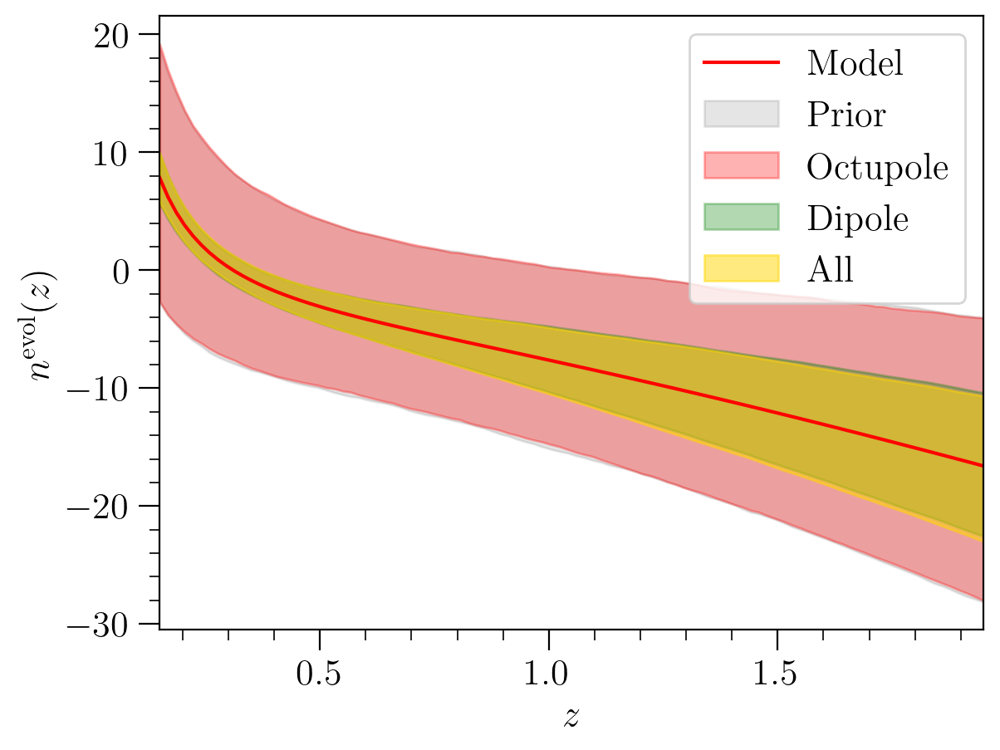

In [308]:
plt.plot(z_lin, num_evol_fid, '-', color='red', label=r'Model', lw = 1.5)

# Shade the 68% confidence interval

plt.fill_between(z_lin, nevol_lower_bound_priors, nevol_upper_bound_priors, color='black', alpha=0.1, label='Prior')
plt.fill_between(z_lin, nevol_lower_bound_oct, nevol_upper_bound_oct, color='red', alpha=0.3, label='Octupole')
plt.fill_between(z_lin, nevol_lower_bound_, nevol_upper_bound_, color='green', alpha=0.3, label='Dipole')
#plt.fill_between(z_lin, nevol_lower_bound, nevol_upper_bound, color='orange', alpha=0.5, label='Dipole+Octupole')
plt.fill_between(z_lin, nevol_lower_bound_all, nevol_upper_bound_all, color='gold', alpha=0.5, label='All')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'$z$')
plt.ylabel(r'$n^\mathrm{evol}(z)$')
#plt.title('With and without octupole')
plt.legend();

#plt.savefig("plots/nevol_prediction_50x50_full_vs_neven_vs_prior50.pdf", bbox_inches='tight', format='pdf')

##### Evolution bias

The evolution bias is computed from the magnification biases and the evolution of the number densities.

$$ f^{evol}_{B}(z) = -\frac{d\log{N_B(z)}}{d\log{(1+z)}} - \frac{d\log{H(z)}}{d\log{(1+z)}} + \frac{2(1+z)}{r(z)H(z)} -5\,s_B(z)\left(1+\frac{(1+z)}{r(z)H(z)}\right) - \frac{5}{2}s_B(z)\,\frac{d\log{F_c}}{d\log{(1+z)}} $$

$$ f^{evol}_{F}(z) = -\frac{d\log{N_F(z)}}{d\log{(1+z)}} - \frac{d\log{H(z)}}{d\log{(1+z)}} + \frac{2(1+z)}{r(z)H(z)} -5\,s_F(z)\left(1+\frac{(1+z)}{r(z)H(z)}\right) 
    - \frac{5}{2}\left[\frac{\bar{N}}{\bar{N}_F}\,s_{model}(z)\frac{d\log{F_*}}{d\log{(1+z)}}-\frac{\bar{N}_B}{\bar{N}_F}\,s_B(z)\frac{d\log{F_c}}{d\log{(1+z)}}\right] $$

We have all the ingredients defined as methods in the EvolutionBias class. We need to extract the relevant terms and then sample togeter the $n_{evol}$ and magnification bias parameters to construct the predictions for each evolution bias. 

In [309]:
m_split = 2.

myEvolBias = EvolutionBias(n_split=m_split)

dlogH = myEvolBias.dlogH
rHterm = myEvolBias.rHterm
dFstar = myEvolBias.dLogFstar
dFcut = myEvolBias.dLogFcut

In [310]:
def fevol_bright(pars_s, pars_n, z):
    pars_sB = pars_s[:4] 
    return - nevol_fit(params=pars_n, x=z) - dlogH(z) + (2 - 5*magbias_fit(params=pars_sB, x=z))*rHterm(z) - 5*magbias_fit(params=pars_sB, x=z) - 5/2*magbias_fit(params=pars_sB, x=z)*dFcut(z)
    
def fevol_faint(pars_s, pars_n, z):
    
    pars_sB = pars_s[:4]
    pars_sM = pars_s[4:]
    s_B = magbias_fit(params=pars_sB, x=z)
    s_M = magbias_fit(params=pars_sM, x=z)
    s_faint = s_M*m_split/(m_split-1) - s_B/(m_split-1)
    
    return - nevol_fit(params=pars_n, x=z) - dlogH(z) + (2 - 5*s_faint)*rHterm(z) - 5*s_faint + 5/2*((1/(m_split-1)) * s_B *dFcut(z) - (m_split/(m_split-1)) * s_M *dFstar(z))

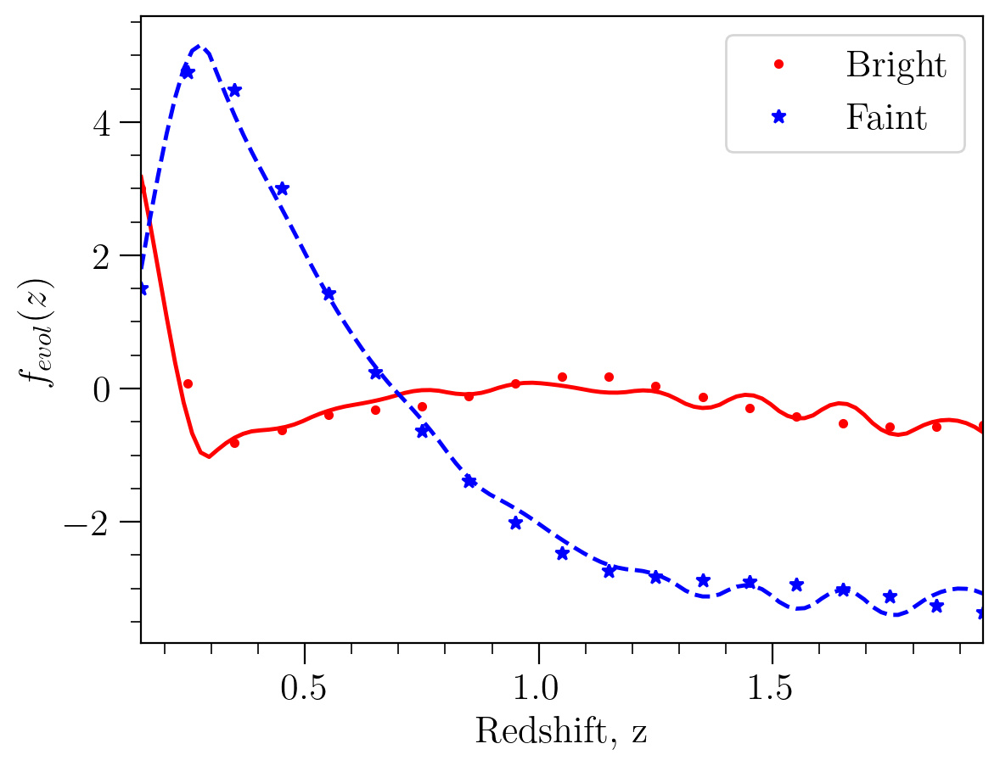

In [311]:
from scipy.interpolate import interp1d

z_lin = np.linspace(z_bins[0], z_bins[-1], 100)

fevol_B_fid = fevol_bright(pars_s = sbias_fid, pars_n = nevol_fid, z = z_lin)
fevol_F_fid = fevol_faint(pars_s = sbias_fid, pars_n = nevol_fid, z = z_lin)

plt.plot(z_lin, fevol_B_fid, 'r-')
plt.plot(z_lin, fevol_F_fid, 'b--')

feB_ = myEvolBias.fevol_bright(z_lin)
feF_ = myEvolBias.fevol_faint(z_lin)

feBi = interp1d(z_lin, feB_, kind='cubic', fill_value='extrapolate')
feFi = interp1d(z_lin, feF_, kind='cubic', fill_value='extrapolate')

feB = feBi(z_bins)
feF = feFi(z_bins)

plt.plot(z_bins, feB, 'r.', label='Bright')
plt.plot(z_bins, feF, 'b*', label='Faint')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'Redshift, z');
plt.ylabel(r'$f_{evol}(z)$');
plt.legend();

In [312]:
# Select the marginalized covariance matrix for the number evolution

cov_all_all = Sigma_Matrix_all_19bins[:12, :12]
cov_all_priors = Cov_all_19bins[:12, :12]

all_fid = np.concatenate([sbias_fid, nevol_fid])

# Generate parameter samples from multivariate normal distribution

num_samples = 2000
all_pars_samples_all = np.random.multivariate_normal(all_fid, cov_all_all, num_samples)
all_pars_samples_priors = np.random.multivariate_normal(all_fid, cov_all_priors, num_samples)

# Evaluate fitting function for each parameter sample

fevol_B_samples_all = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples_all])
fevol_B_samples_priors_all = np.array([fevol_bright(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples_priors])
fevol_F_samples_all = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples_all])
fevol_F_samples_priors_all = np.array([fevol_faint(pars_s = pars[:8], pars_n = pars[8:12], z = z_lin) for pars in all_pars_samples_priors])

# Calculate the 68% confidence intervals

fevol_B_lower_bound_all = np.percentile(fevol_B_samples_all, 16, axis=0)
fevol_B_upper_bound_all = np.percentile(fevol_B_samples_all, 84, axis=0)
fevol_B_lower_bound_priors_all = np.percentile(fevol_B_samples_priors, 16, axis=0)
fevol_B_upper_bound_priors_all = np.percentile(fevol_B_samples_priors, 84, axis=0)

fevol_F_lower_bound_all = np.percentile(fevol_F_samples_all, 16, axis=0)
fevol_F_upper_bound_all = np.percentile(fevol_F_samples_all, 84, axis=0)
fevol_F_lower_bound_priors_all = np.percentile(fevol_F_samples_priors, 16, axis=0)
fevol_F_upper_bound_priors_all = np.percentile(fevol_F_samples_priors, 84, axis=0)

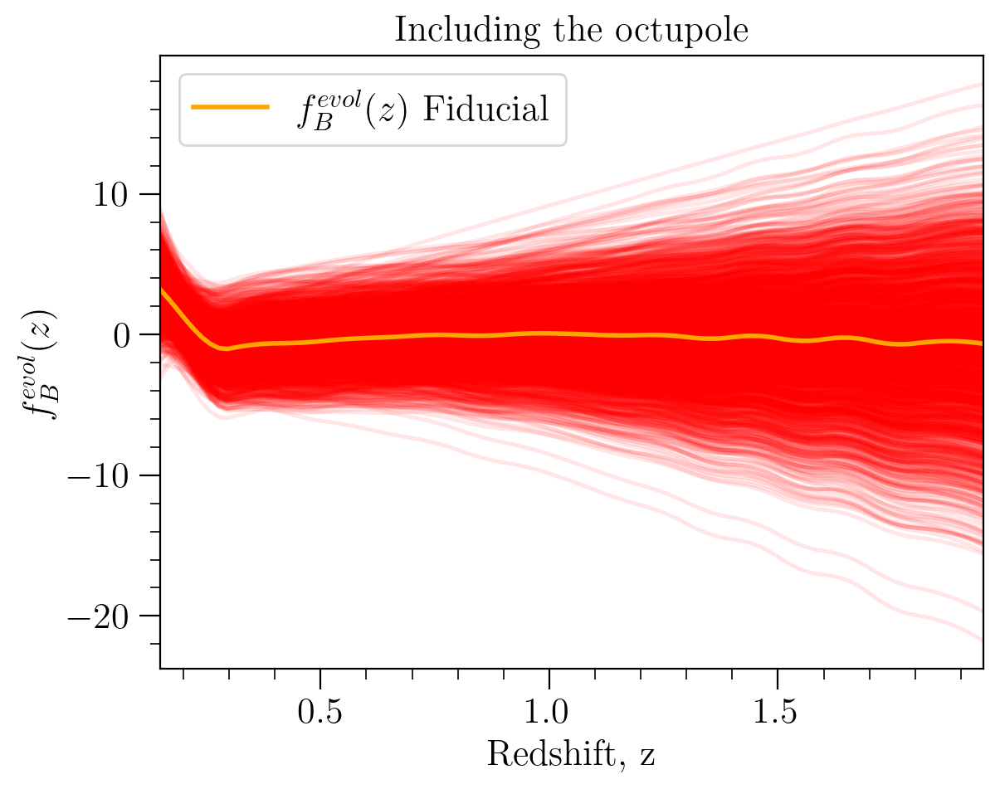

In [171]:
# Plot the fitting function for each sample
for sample in fevol_B_samples_all:
    plt.plot(z_lin, sample, color='red', alpha=0.1)
    
plt.plot(z_lin, fevol_B_fid, '-', color='orange', label=r'$f^{evol}_B(z)$'+' Fiducial', lw = 2.0)

plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_B(z)$')
plt.title('Including the octupole')
plt.legend();

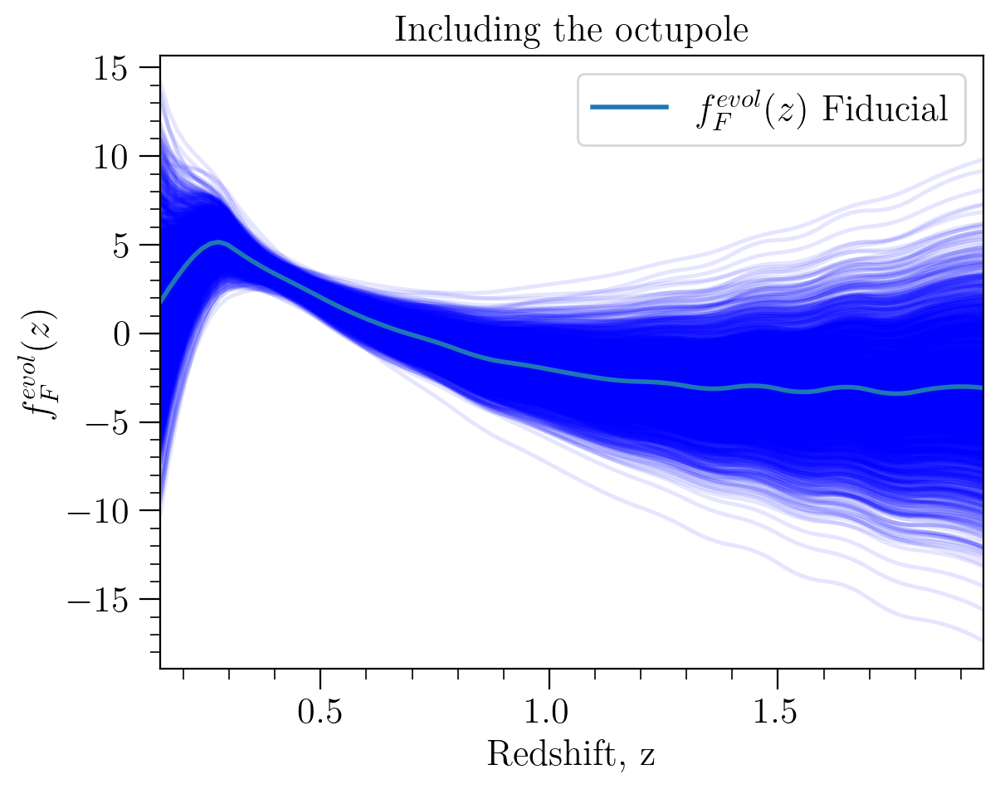

In [172]:
# Plot the fitting function for each sample
for sample in fevol_F_samples_all:
    plt.plot(z_lin, sample, color='blue', alpha=0.1)
    
plt.plot(z_lin, fevol_F_fid, '-', label=r'$f^{evol}_F(z)$'+' Fiducial', lw = 2.0)

plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_F(z)$')
plt.title('Including the octupole')
plt.legend();

Text(0.5, 1.0, 'Including All')

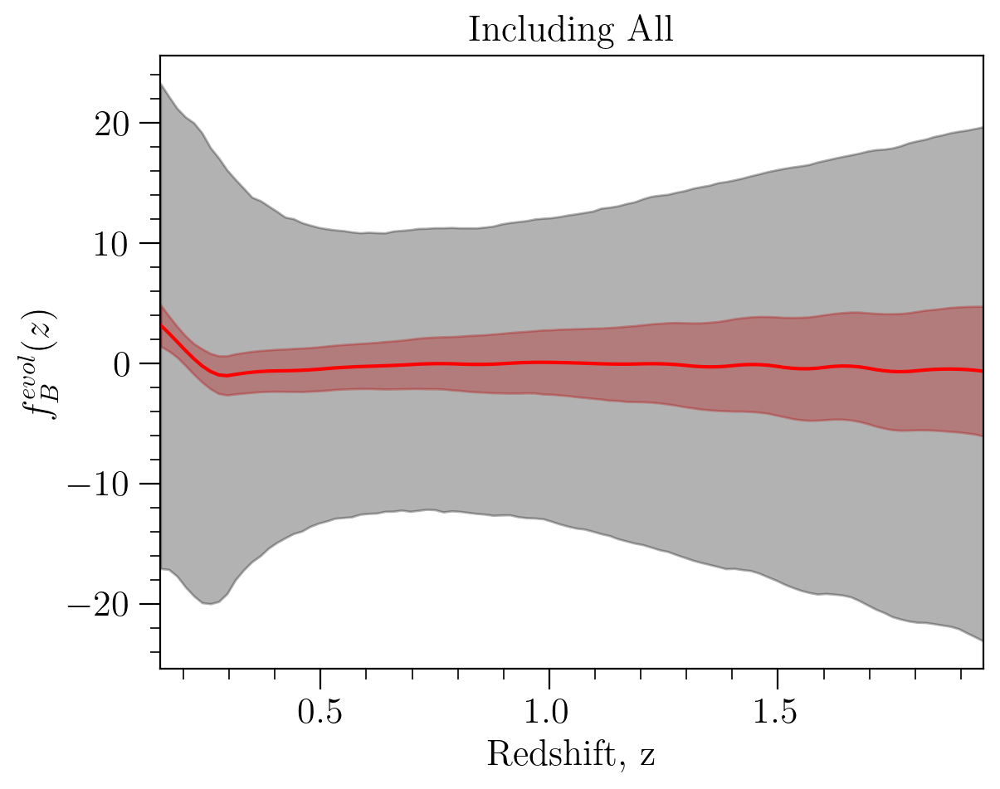

In [313]:
plt.plot(z_lin, fevol_B_fid, '-', color='red', lw = 1.5)

# Shade the 68% confidence interval

plt.fill_between(z_lin, fevol_B_lower_bound_all, fevol_B_upper_bound_all, color='red', alpha=0.3)
plt.fill_between(z_lin, fevol_B_lower_bound_priors_all, fevol_B_upper_bound_priors_all, color='black', alpha=0.3)


plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z')
plt.ylabel(r'$f^{evol}_B(z)$')
plt.title('Including All')

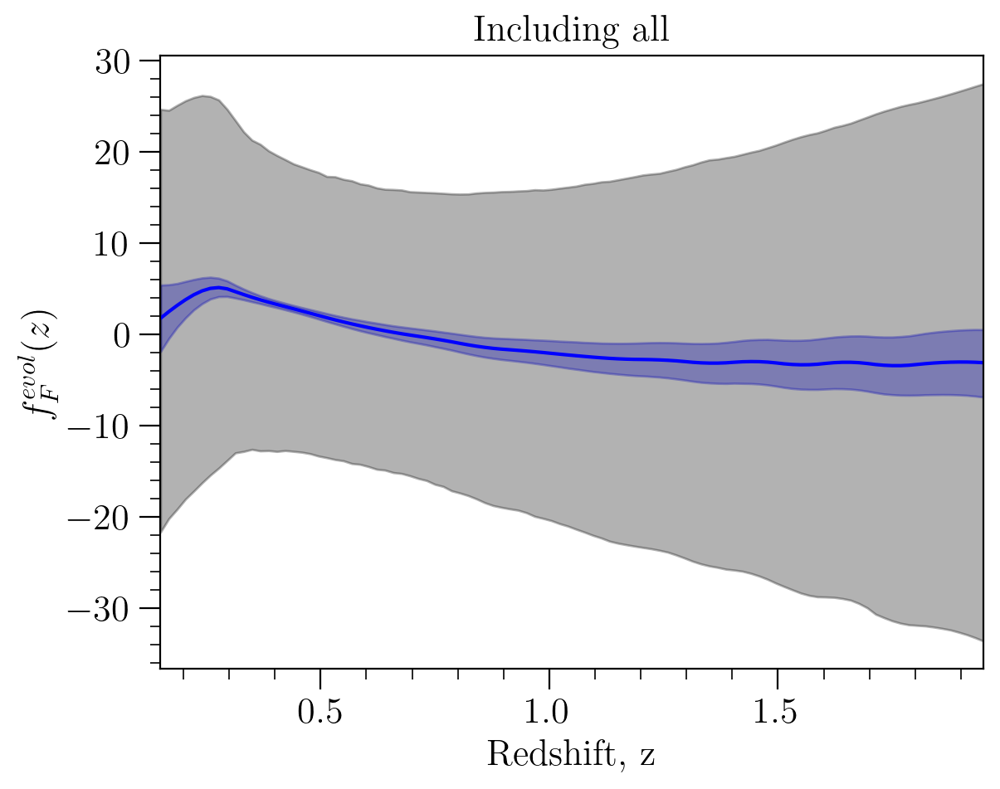

In [314]:
plt.plot(z_lin, fevol_F_fid, '-', color='blue', lw = 1.5)

# Shade the 68% confidence interval

plt.fill_between(z_lin, fevol_F_lower_bound_all, fevol_F_upper_bound_all, color='blue', alpha=0.3)
plt.fill_between(z_lin, fevol_F_lower_bound_priors_all, fevol_F_upper_bound_priors_all, color='black', alpha=0.3)

plt.xlim(0.15,1.95)

plt.xlabel(r'Redshift, z');
plt.ylabel(r'$f^{evol}_F(z)$');
plt.title('Including all');

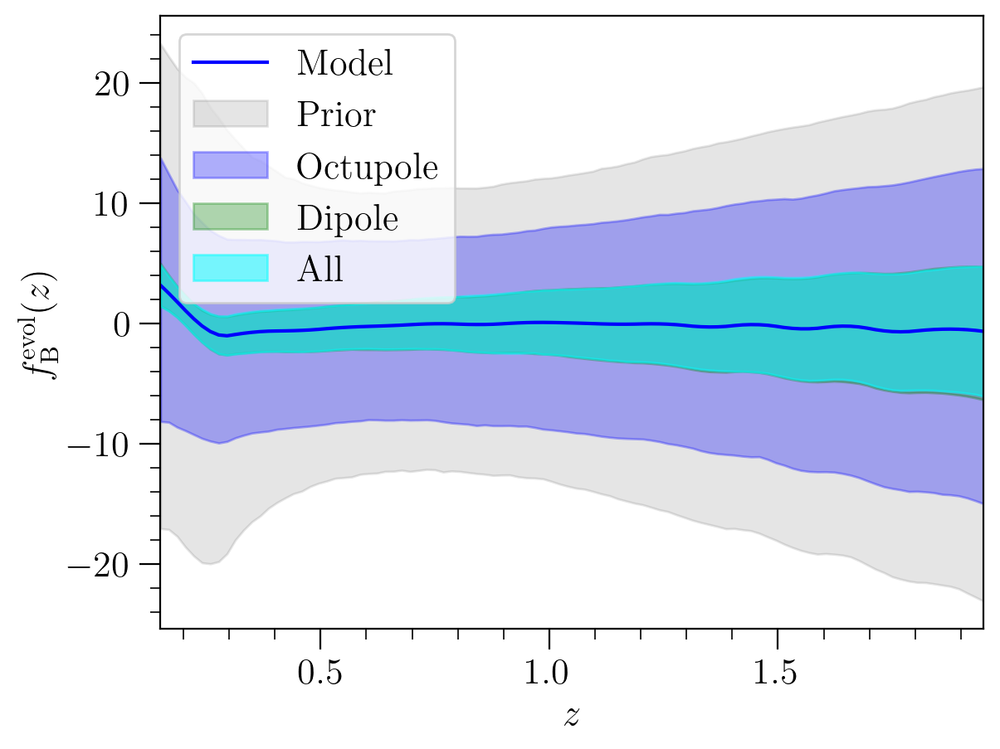

In [315]:
plt.plot(z_lin, fevol_B_fid, '-', color='blue', lw = 1.5, label = 'Model')

# Shade the 68% confidence interval


plt.fill_between(z_lin, fevol_B_lower_bound_priors, fevol_B_upper_bound_priors, color='black', alpha=0.1, label='Prior')
plt.fill_between(z_lin, fevol_B_lower_bound_oct, fevol_B_upper_bound_oct, color='blue', alpha=0.3, label='Octupole')
plt.fill_between(z_lin, fevol_B_lower_bound_, fevol_B_upper_bound_, color='green', alpha=0.3, label='Dipole')
plt.fill_between(z_lin, fevol_B_lower_bound_all, fevol_B_upper_bound_all, color='cyan', alpha=0.5, label='All')

plt.xlim(0.15,1.95)

plt.xlabel(r'$z$')
plt.ylabel(r'$f^\mathrm{evol}_\mathrm{B}(z)$')
#plt.title('With and without the octupole');
plt.legend(loc='upper left')

#plt.savefig("plots/fevolB_prediction_50x50_full_vs_neven_vs_prior50.pdf", bbox_inches='tight', format='pdf')

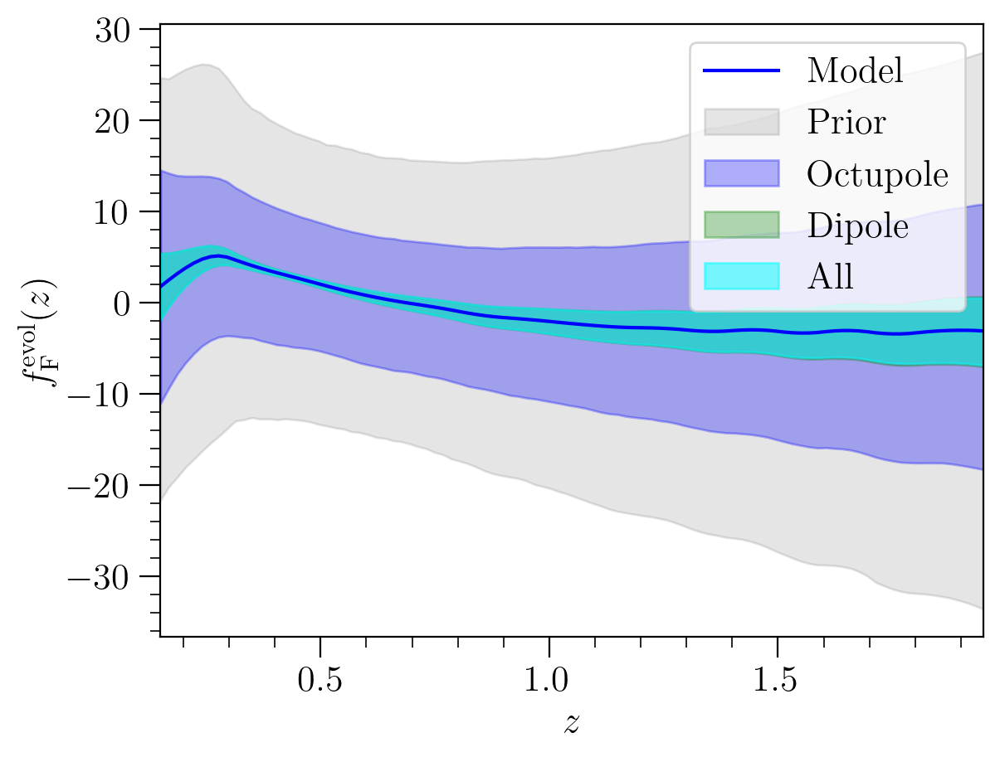

In [318]:
plt.plot(z_lin, fevol_F_fid, '-', color='blue', lw = 1.5, label='Model')

# Shade the 68% confidence interval

plt.fill_between(z_lin, fevol_F_lower_bound_priors, fevol_F_upper_bound_priors, color='black', alpha=0.1, label='Prior')
plt.fill_between(z_lin, fevol_F_lower_bound_oct, fevol_F_upper_bound_oct, color='blue', alpha=0.3, label='Octupole')
plt.fill_between(z_lin, fevol_F_lower_bound_, fevol_F_upper_bound_, color='green', alpha=0.3, label='Dipole')
plt.fill_between(z_lin, fevol_F_lower_bound_all, fevol_F_upper_bound_all, color='cyan', alpha=0.5, label='All')

plt.xlim(0.15,1.95)

plt.xlabel(r'$z$');
plt.ylabel(r'$f^\mathrm{evol}_\mathrm{F}(z)$');
#plt.title('With and without octupole');
plt.legend(loc='upper right')

#plt.savefig("plots/fevolF_prediction_50x50_full_vs_neven_vs_prior50.pdf", bbox_inches='tight', format='pdf')

### Additional comparisons

In [324]:
# Remove nevol from DIPOLE 

Fisher_Matrix_dipole_19bins_sbias = Fisher_Matrix_dipole_19bins[:8,:8]

Sigma_Matrix_dipole_19bins_sbias = np.linalg.inv(Fisher_Matrix_dipole_19bins_sbias)

np.shape(Fisher_Matrix_dipole_19bins_sbias), np.shape(Sigma_Matrix_dipole_19bins_sbias)

((8, 8), (8, 8))

In [330]:
Sigma_Matrix_octupole_19bins[:4,:4]

array([[ 0.11346894, -0.08096465,  0.06954558,  0.00773811],
       [-0.08096465,  0.21053323, -0.0550304 , -0.0142014 ],
       [ 0.06954558, -0.0550304 ,  0.07403553,  0.02208953],
       [ 0.00773811, -0.0142014 ,  0.02208953,  0.01066912]])

In [332]:
Sigma_Matrix_dipole_19bins_sbias[:4,:4]

array([[ 0.07831407, -0.02777419,  0.06832719,  0.01636817],
       [-0.02777419,  0.09319456, -0.02989711, -0.01116479],
       [ 0.06832719, -0.02989711,  0.06319733,  0.01633904],
       [ 0.01636817, -0.01116479,  0.01633904,  0.00468271]])

In [335]:
# SAMPLING ALL AT ONCE 

# Select the marginalized covariance matrix for the number evolution

cov_s_dip = Sigma_Matrix_dipole_19bins_sbias
cov_s_oct = Sigma_Matrix_octupole_19bins
cov_all_priors = Cov_all_19bins

all_fid = np.concatenate([sbias_fid, nevol_fid])

# Generate parameter samples from multivariate normal distribution

num_samples = 2000
s_pars_samples_oct = np.random.multivariate_normal(all_fid, cov_s_oct, num_samples)
s_pars_samples_dip = np.random.multivariate_normal(all_fid[:8], cov_s_dip, num_samples)

all_pars_samples_priors = np.random.multivariate_normal(all_fid, cov_all_priors, num_samples)

In [336]:
np.shape(s_pars_samples_oct), np.shape(s_pars_samples_dip)

((2000, 12), (2000, 8))

In [352]:
# Evaluate fitting function for each parameter sample

sB_samples_dip = np.array([magbias_fit(pars[:4], z_lin) for pars in s_pars_samples_dip])
sB_samples_oct = np.array([magbias_fit(pars[:4], z_lin) for pars in s_pars_samples_oct])

sM_samples_dip = np.array([magbias_fit(pars[4:8], z_lin) for pars in s_pars_samples_dip])
sM_samples_oct = np.array([magbias_fit(pars[4:8], z_lin) for pars in s_pars_samples_oct])

# Calculate the 68% confidence interval

sB_lower_bound_dip = np.percentile(sB_samples_dip, 16, axis=0)
sB_upper_bound_dip = np.percentile(sB_samples_dip, 84, axis=0)
sM_lower_bound_dip = np.percentile(sM_samples_dip, 16, axis=0)
sM_upper_bound_dip = np.percentile(sM_samples_dip, 84, axis=0)

sB_lower_bound_oct = np.percentile(sB_samples_oct, 16, axis=0)
sB_upper_bound_oct = np.percentile(sB_samples_oct, 84, axis=0)
sM_lower_bound_oct = np.percentile(sM_samples_oct, 16, axis=0)
sM_upper_bound_oct = np.percentile(sM_samples_oct, 84, axis=0)

# Evaluate fitting function for each parameter sample

sB_samples_priors_oct = np.array([magbias_fit(pars[:4], z_lin) for pars in all_pars_samples_priors])
sM_samples_priors_oct = np.array([magbias_fit(pars[4:8], z_lin) for pars in all_pars_samples_priors])

# Calculate the 68% confidence interval

sB_lower_bound_priors_oct = np.percentile(sB_samples_priors_oct, 16, axis=0)
sB_upper_bound_priors_oct = np.percentile(sB_samples_priors_oct, 84, axis=0)
sM_lower_bound_priors_oct = np.percentile(sM_samples_priors_oct, 16, axis=0)
sM_upper_bound_priors_oct = np.percentile(sM_samples_priors_oct, 84, axis=0)

In [353]:
# Compute the sF for each sample
sF_samples_dip = sM_samples_dip*m_split/(m_split-1) - sB_samples_dip/(m_split-1)
sF_samples_oct = sM_samples_oct*m_split/(m_split-1) - sB_samples_oct/(m_split-1)
sF_samples_priors_oct = sM_samples_priors_oct*m_split/(m_split-1) - sB_samples_priors_oct/(m_split-1)

# Calculate the 68% confidence interval

sF_lower_bound_dip = np.percentile(sF_samples_dip, 16, axis=0)
sF_upper_bound_dip = np.percentile(sF_samples_dip, 84, axis=0)

sF_lower_bound_oct = np.percentile(sF_samples_oct, 16, axis=0)
sF_upper_bound_oct = np.percentile(sF_samples_oct, 84, axis=0)
sF_lower_bound_priors_oct = np.percentile(sF_samples_priors_oct, 16, axis=0)
sF_upper_bound_priors_oct = np.percentile(sF_samples_priors_oct, 84, axis=0)

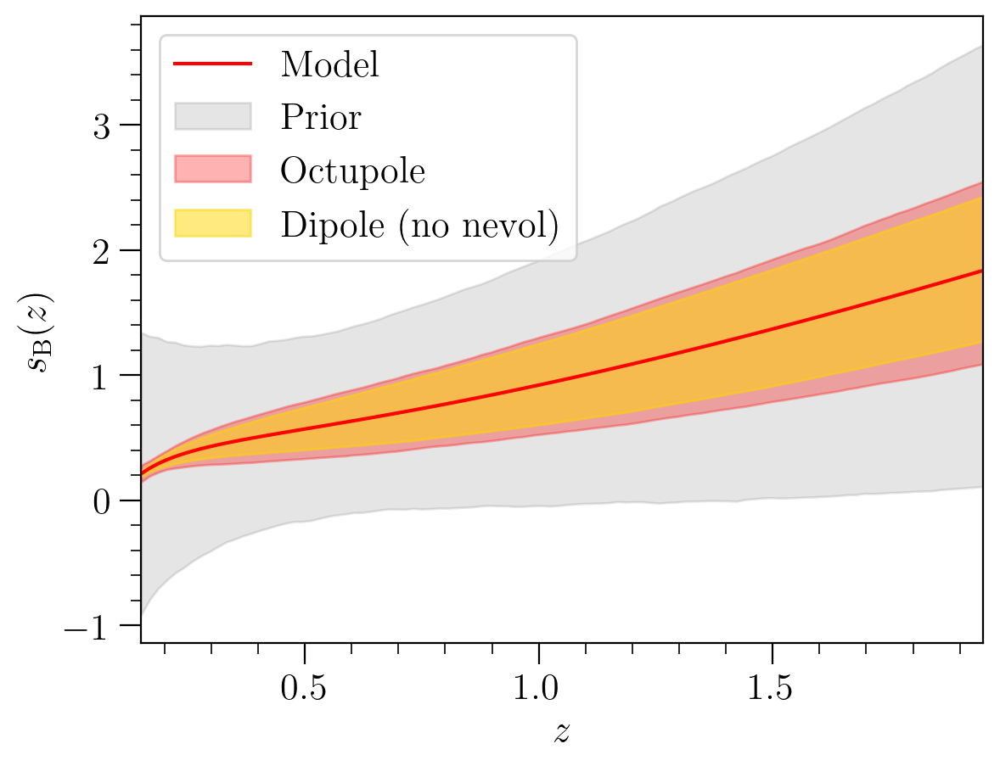

In [354]:
plt.plot(z_lin, sB_fid, '-', lw = 1.5, color='red', label=r'Model')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_priors_all, sB_upper_bound_priors_all, color='black', alpha=0.1, label=r'Prior')
plt.fill_between(z_lin, sB_lower_bound_oct, sB_upper_bound_oct, color='red', alpha=0.3, label=r'Octupole')
plt.fill_between(z_lin, sB_lower_bound_dip, sB_upper_bound_dip, color='gold', alpha=0.5, label=r'Dipole (no nevol)')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'$z$');
plt.ylabel(r'$s_\mathrm{B}(z)$');
#plt.title(r'With and without octupole');
plt.legend(loc='upper left');

#plt.savefig("plots/sB_prediction_50x50_full_vs_neven_vs_prior50.pdf", bbox_inches='tight', format='pdf')

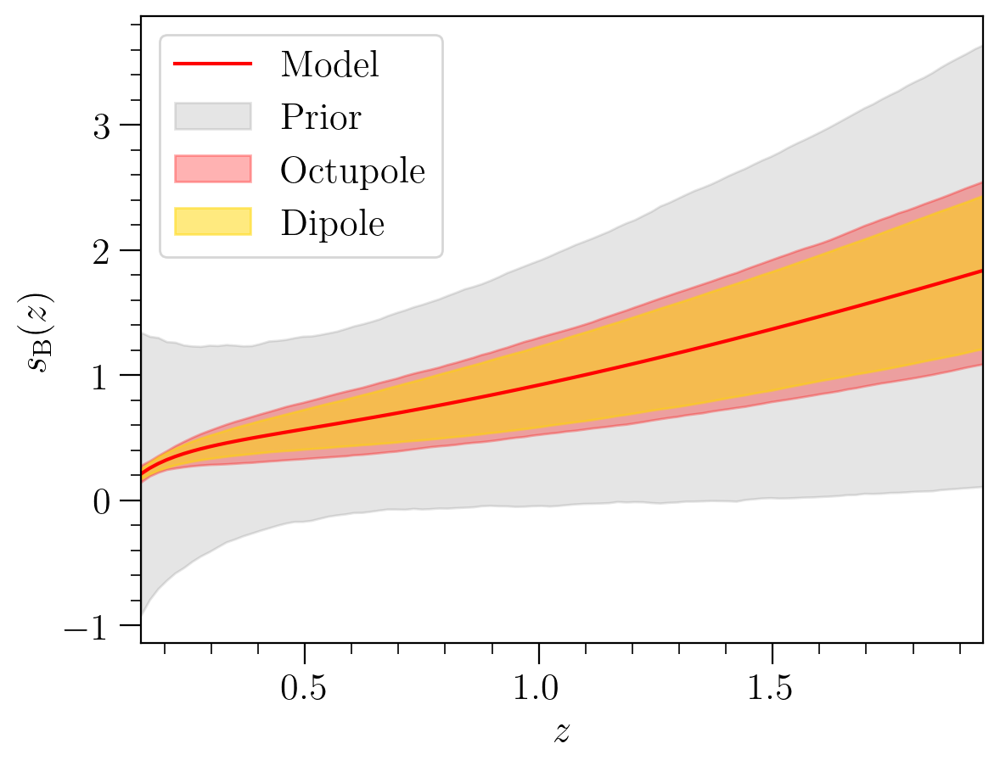

In [360]:
plt.plot(z_lin, sB_fid, '-', lw = 1.5, color='red', label=r'Model')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sB_lower_bound_priors_all, sB_upper_bound_priors_all, color='black', alpha=0.1, label=r'Prior')
plt.fill_between(z_lin, sB_lower_bound_oct, sB_upper_bound_oct, color='red', alpha=0.3, label=r'Octupole')
plt.fill_between(z_lin, sB_lower_bound_, sB_upper_bound_, color='gold', alpha=0.5, label=r'Dipole')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'$z$');
plt.ylabel(r'$s_\mathrm{B}(z)$');
#plt.title(r'With and without octupole');
plt.legend(loc='upper left');

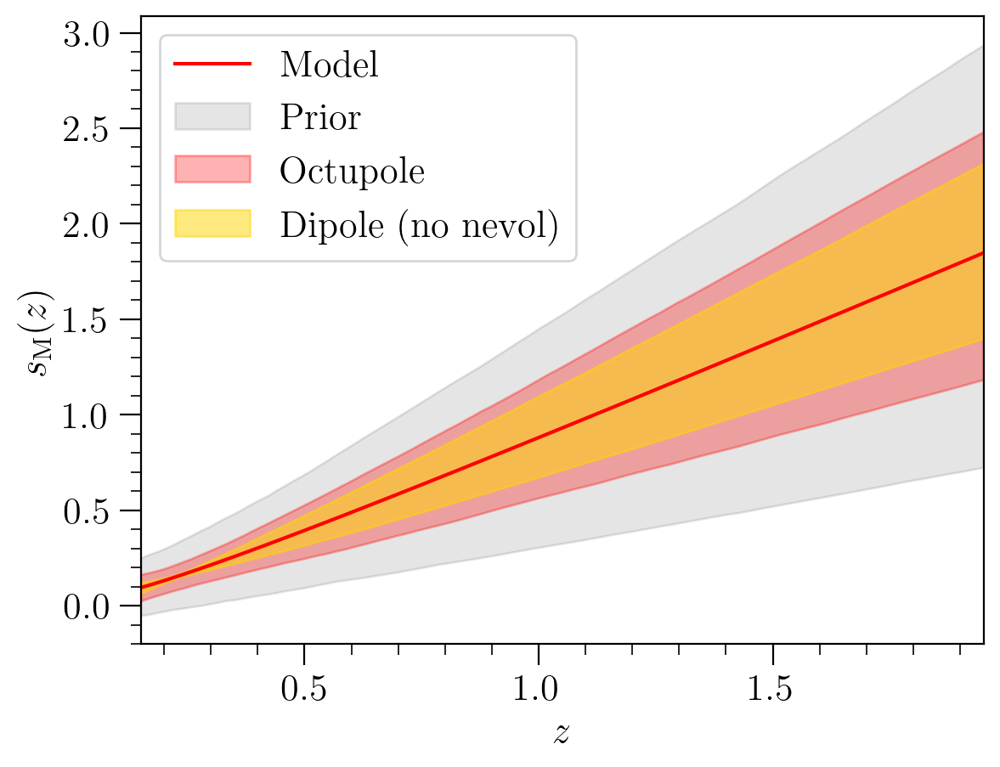

In [356]:
plt.plot(z_lin, sM_fid, '-', lw = 1.5, color='red', label='Model')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sM_lower_bound_priors, sM_upper_bound_priors, color='black', alpha=0.1, label='Prior')
plt.fill_between(z_lin, sM_lower_bound_oct, sM_upper_bound_oct, color='red', alpha=0.3, label='Octupole')
plt.fill_between(z_lin, sM_lower_bound_dip, sM_upper_bound_dip, color='gold', alpha=0.5, label='Dipole (no nevol)')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'$z$');
plt.ylabel(r'$s_\mathrm{M}(z)$');
#plt.title(r'With and without octupole');
plt.legend(loc='upper left')

#plt.savefig("plots/sM_prediction_50x50_full_vs_neven_vs_prior50.pdf", bbox_inches='tight', format='pdf')

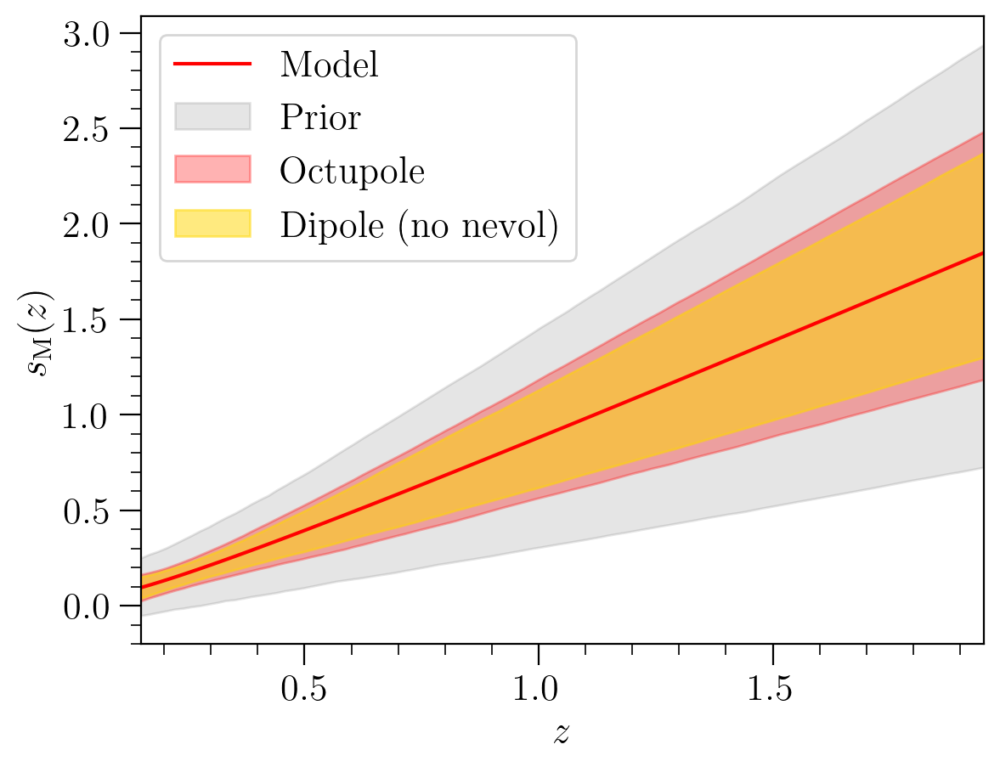

In [359]:
plt.plot(z_lin, sM_fid, '-', lw = 1.5, color='red', label='Model')

# Shade the 68% confidence interval

plt.fill_between(z_lin, sM_lower_bound_priors, sM_upper_bound_priors, color='black', alpha=0.1, label='Prior')
plt.fill_between(z_lin, sM_lower_bound_oct, sM_upper_bound_oct, color='red', alpha=0.3, label='Octupole')
plt.fill_between(z_lin, sM_lower_bound_, sM_upper_bound_, color='gold', alpha=0.5, label='Dipole')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'$z$');
plt.ylabel(r'$s_\mathrm{M}(z)$');
#plt.title(r'With and without octupole');
plt.legend(loc='upper left')

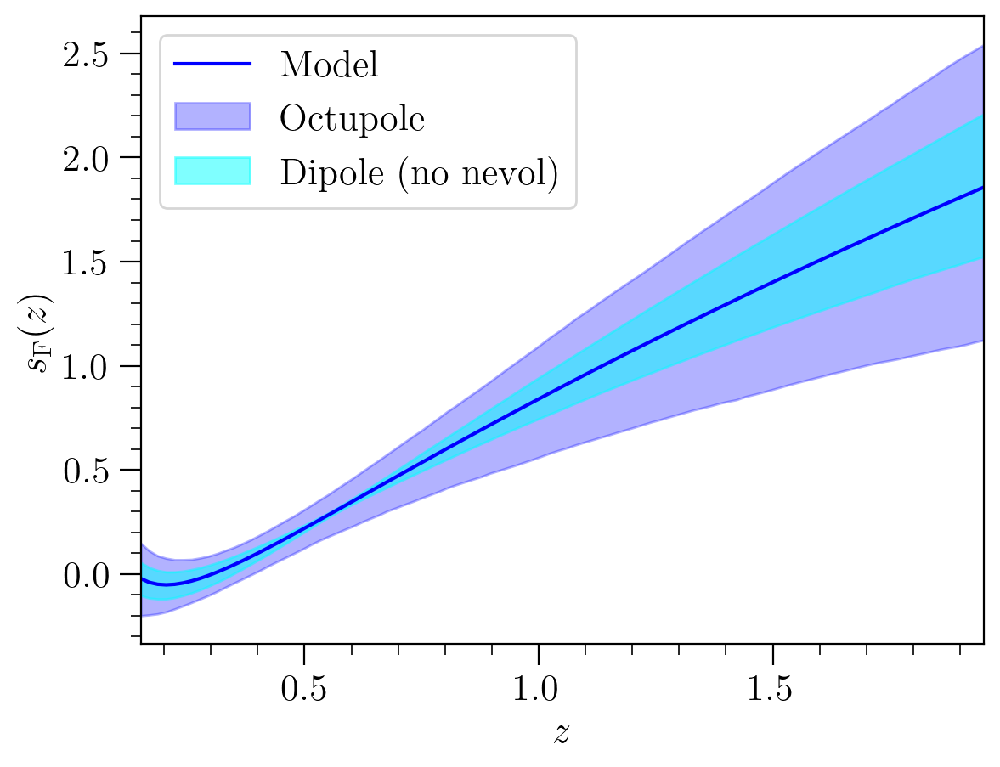

In [357]:
plt.plot(z_lin, sF_fid, '-', lw = 1.5, color='blue', label='Model')

# Shade the 68% confidence interval

#plt.fill_between(z_lin, sF_lower_bound_priors, sF_upper_bound_priors, color='black', alpha=0.1, label='Prior')
plt.fill_between(z_lin, sF_lower_bound_oct, sF_upper_bound_oct, color='blue', alpha=0.3, label='Octupole')
plt.fill_between(z_lin, sF_lower_bound_dip, sF_upper_bound_dip, color='cyan', alpha=0.5, label='Dipole (no nevol)')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'$z$');
plt.ylabel(r'$s_\mathrm{F}(z)$');
#plt.title(r'With and without octupole');
plt.legend(loc='upper left');

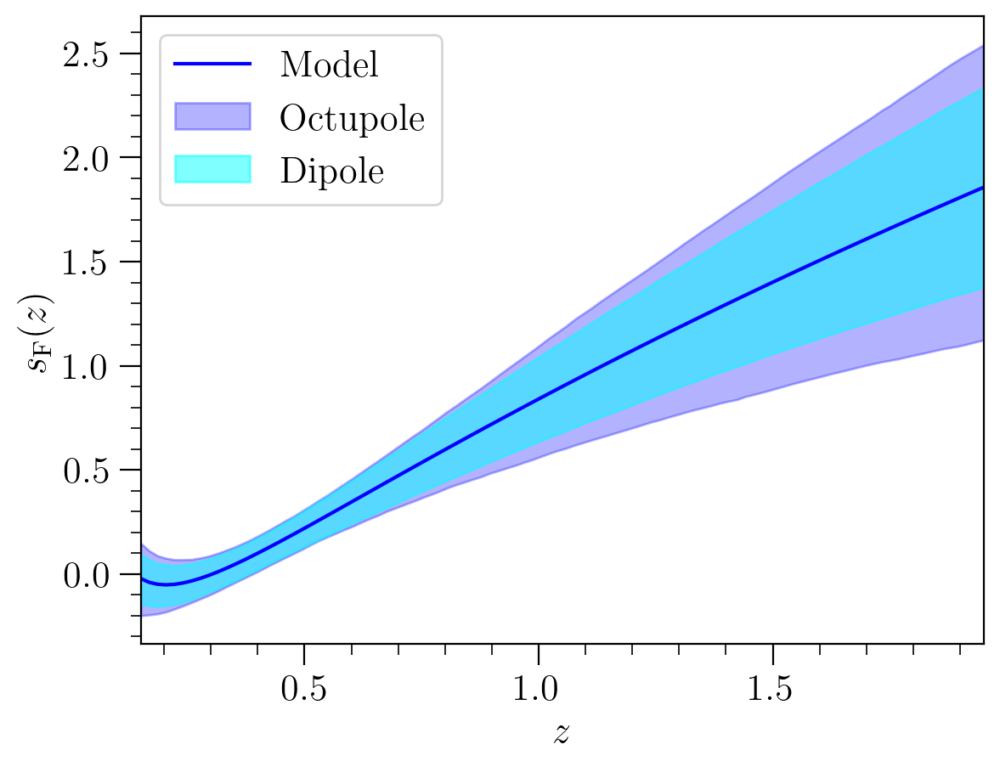

In [358]:
plt.plot(z_lin, sF_fid, '-', lw = 1.5, color='blue', label='Model')

# Shade the 68% confidence interval

#plt.fill_between(z_lin, sF_lower_bound_priors, sF_upper_bound_priors, color='black', alpha=0.1, label='Prior')
plt.fill_between(z_lin, sF_lower_bound_oct, sF_upper_bound_oct, color='blue', alpha=0.3, label='Octupole')
plt.fill_between(z_lin, sF_lower_bound_, sF_upper_bound_, color='cyan', alpha=0.5, label='Dipole')

plt.xlim(z_bins[0],z_bins[-1])

plt.xlabel(r'$z$');
plt.ylabel(r'$s_\mathrm{F}(z)$');
#plt.title(r'With and without octupole');
plt.legend(loc='upper left');